In [1]:
import numpy as np
import matplotlib.pyplot as plt
import composite
%matplotlib inline
from numpy import trapz
import copy

In [2]:
carbon_query = "SELECT * from Supernovae inner join Photometry ON Supernovae.SN = Photometry.SN where (Carbon = 'A' or Carbon = 'F' or Carbon = 'N') and phase"

In [3]:
SN_Array = composite.grab(carbon_query, multi_epoch = True, make_corr = True)

ERROR:  1998bu_19990126_0_2_00.dat None
ERROR:  2002bo_20020313_3360_7726_00.dat None
ERROR:  2002bo_20020314_0_2_00.dat None
ERROR:  2002bo_20020403_0_2_00.dat None
ERROR:  2002bo_20020421_0_2_00.dat None
ERROR:  2002bo_20020518_0_2_00.dat None
ERROR:  sn2007jg-20070918-not.dat None
ERROR:  sn1992a-19920116.220-iue.flm None
164 questionable files currently ignored
Generate variance failed for:  [u'2005cf_20050601_3243_9720_00.dat', u'sn2004dt-20040820-hst.flm', u'sn2004dt-20040823-hst.flm', u'sn2004ef-20040914-hst.flm', u'sn2004ef-20040918-hst.flm', u'sn2005cf-20050603-hst.flm', u'sn2005cf-20050605-hst.flm', u'sn2005cf-20050607-hst.flm', u'sn2005cf-20050611-hst.flm', u'sn2005cf-20050614-hst.flm', u'sn2005m-20050128-hst.flm', u'sn2005m-20050131-hst.flm']
150 questionable spectra removed 2404 spectra left
81 Peculiar Ias removed 2323 spectra left
2048 spectra with host corrections
2048 valid SNe found
Arrays cleaned


In [4]:
names = []
for i, SN in enumerate(SN_Array):
    print i, SN.name, SN.filename, SN.source, SN.phase, SN.carbon
    names.append(SN.name)

0 1989b sn1989b-19890221.flm bsnip 13.455370726 F
1 1989b sn1989b-19890427-o1i1.flm bsnip 78.2981270419 F
2 1989b sn1989b-19890710-o.flm bsnip 152.119111155 F
3 1990n sn1990n-19900717-oi.flm bsnip 7.33808719397 A
4 1990n sn1990n-19900731-oi.flm bsnip 21.4830649943 A
5 1990n sn1990n-19900829-oi.flm bsnip 50.3450784586 A
6 1990n sn1990n-19900830-ir2.flm bsnip 51.1892126231 A
7 1990n sn1990n-19901217-opt2.flm bsnip 160.395457422 A
8 1991bg sn1991bg-19911213-noz.flm bsnip 0.681687715271 N
9 1991bg sn1991bg-19911214-noz.flm bsnip 1.67830718204 N
10 1991bg sn1991bg-19920101-noz.flm bsnip 19.6174575839 N
11 1991bg sn1991bg-19920109-hires-noz.flm bsnip 27.590413318 N
12 1991bg sn1991bg-19920109-noz.flm bsnip 27.590413318 N
13 1991bg sn1991bg-19920130-noz.flm bsnip 48.5194221202 N
14 1991bg sn1991bg-19920313-noz.flm bsnip 91.8653925883 N
15 1991bg sn1991bg-19920523-uoi.flm bsnip 162.441996747 N
16 1991t sn1991t-19910419.flm bsnip -8.66879898507 F
17 1991t sn1991t-19910505.flm bsnip 7.2390784964

In [5]:
events = set(names)
print len(names), 'spectra of', len(events), 'SNe'

2048 spectra of 138 SNe


2003kf 14.4085496353 A


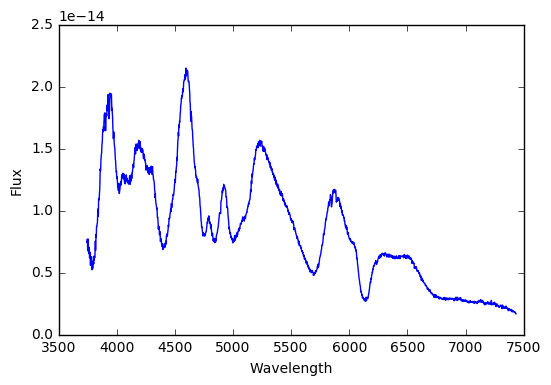

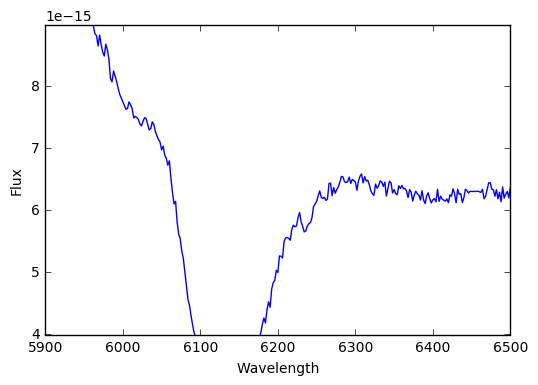

In [6]:
# example = SN_Array[520]
example = SN_Array[1067]
print example.name, example.phase, example.carbon
plt.plot(example.wavelength[example.x1:example.x2], example.flux[example.x1:example.x2])
plt.xlabel('Wavelength')
plt.ylabel('Flux')
plt.show()
plt.plot(example.wavelength[example.x1:example.x2], example.flux[example.x1:example.x2])
plt.xlim([5900.,6500.])
plt.ylim([0.4e-14,0.9e-14])
plt.xlabel('Wavelength')
plt.ylabel('Flux')
plt.show()

# Defintions

In [7]:
def sm_vexp(sn):
    if sn.SNR >= 40.:
        return 0.001
    elif sn.SNR >= 20. and sn.SNR < 40.:
        return 0.002
    elif sn.SNR < 20.:
        return 0.003

In [8]:
def gsmooth(x_array, y_array, var_y, vexp, nsig = 5.0):
    #returns smoothed flux array
    # if no variance array create a constant one
    if len(var_y) == 0:
        var_y = np.zeros(len(y_array))
        
    for i in range(len(var_y)):
        if var_y[i] == 0:
            var_y[i] = 1E-20
            # var_y[i] = 1E-31
    
    # Output y-array
    new_y = np.zeros(len(x_array), float)
    
    # Loop over y-array elements
    for i in range(len(x_array)):
        
        # Construct a Gaussian of sigma = vexp*x_array[i]
        gaussian = np.zeros(len(x_array), float)
        sigma = vexp*x_array[i]
        
        # Restrict range to +/- nsig sigma
        sigrange = np.nonzero(abs(x_array-x_array[i]) <= nsig*sigma)
        gaussian[sigrange] = (1/(sigma*np.sqrt(2*np.pi)))*np.exp(-0.5*((x_array[sigrange]-x_array[i])/sigma)**2)
        
        # Multiply Gaussian by 1 / variance
        W_lambda = gaussian / var_y
        
        # Perform a weighted sum to give smoothed y value at x_array[i]
        W0 = np.sum(W_lambda)
        W1 = np.sum(W_lambda*y_array)
        new_y[i] = W1/W0

    # Return smoothed y-array
    return new_y

In [9]:
def max_wave(sn, w1, w2, w3, error = False, n = 1000):
    
    sm_flux= gsmooth(sn.wavelength[sn.x1:sn.x2], sn.flux[sn.x1:sn.x2], 1/sn.ivar[sn.x1:sn.x2], sm_vexp(sn))

    wave_domain_1 = (sn.wavelength[sn.x1:sn.x2] > w1) & (sn.wavelength[sn.x1:sn.x2] < w2) #set domain as within minwave and maxwave
    list(wave_domain_1)
    
#     flux_range = sn.flux[wave_domain] #find corresponding flux vales for wavelengths within domain
    elem_flux_1 = max(sm_flux[wave_domain_1]) #find minimum value within these flux vales to locate "dip
    max_wave_1 = sn.wavelength[sn.x1:sn.x2][wave_domain_1][np.where(sm_flux[wave_domain_1] == elem_flux_1)][0] #find the corresponding wavelength
        
    local_flux_error_1 = (1./sn.ivar[sn.x1:sn.x2][wave_domain_1])**0.5
    local_median_error_1 = np.median(local_flux_error_1)
    
    wave_domain_2 = (sn.wavelength[sn.x1:sn.x2] > w2) & (sn.wavelength[sn.x1:sn.x2] < w3)
    list(wave_domain_2)
    
    elem_flux_2 = max(sm_flux[wave_domain_2]) #find minimum value within these flux vales to locate "dip
    max_wave_2 = sn.wavelength[sn.x1:sn.x2][wave_domain_2][np.where(sm_flux[wave_domain_2] == elem_flux_2)][0] #find the corresponding wavelength
        
    local_flux_error_2 = (1./sn.ivar[sn.x1:sn.x2][wave_domain_2])**0.5
    local_median_error_2 = np.median(local_flux_error_2)
        
    if error == True:
        flux_dist_1 = []
        for i in range(n):
            point_sample_1 = np.random.normal(elem_flux_1, local_median_error_1)
            flux_dist_1.append(point_sample_1)
        
        lower68bound_1 = sorted(flux_dist_1)[int(round(n * .16)) - 1]
        upper68bound_1 = sorted(flux_dist_1)[int(round(n * .84)) - 1]
        sigma_1 = local_median_error_1
        return max_wave_1, sigma_1, lower68bound_1, upper68bound_1
    
        flux_dist_2 = []
        for i in range(n):
            point_sample_2 = np.random.normal(elem_flux_2, local_median_error_2)
            flux_dist_2.append(point_sample_2)
        
        lower68bound_2 = sorted(flux_dist_2)[int(round(n * .16)) - 1]
        upper68bound_2 = sorted(flux_dist_2)[int(round(n * .84)) - 1]
        sigma_2 = local_median_error_2
        return max_wave_2, sigma_2, lower68bound_2, upper68bound_2
        
    else:
        return [max_wave_1, max_wave_2, sm_flux]

In [10]:
def eq_width(sn, w1, w2, w3, plot=False):
    
    initial= max_wave(sn, w1, w2, w3, False)
    
    max_1 = initial[0]
    max_2 = initial[1]
    
    sm_flux= initial[2]
    
    if sn.wavelength[sn.x1:sn.x2][np.where(sm_flux==min(sm_flux[np.where((sn.wavelength[sn.x1:sn.x2]>6300.) & (sn.wavelength[sn.x1:sn.x2]<6350.))]))] >= 6324.:
        max_1 = max_wave(sn, 6200, 6310, 6400, False)[0]
        max_2= max_wave(sn, 6200, 6330, 6400, False)[1]
    
    if max_2-max_1<24.:
        max_1=6280.
        max_2=6350.
    
    domain = (sn.wavelength[sn.x1:sn.x2] >= max_1) & (sn.wavelength[sn.x1:sn.x2] <= max_2)
    list(domain)
    wave_range = sn.wavelength[sn.x1:sn.x2][domain]
    flux_range = sn.flux[sn.x1:sn.x2][domain]

    line_elem = np.polyfit([max_1, max_2], [sm_flux[np.where(sn.wavelength[sn.x1:sn.x2] == max_1)],
                                            sm_flux[np.where(sn.wavelength[sn.x1:sn.x2] == max_2)]], 1)
#         print(line_elem)
    line = line_elem[0] * wave_range + line_elem[1]
#         print line
#         ask about this

    norm = flux_range / line
    #new_norm = norm * 0 + 0.3
    #print (new_norm)


    a_curve = trapz((norm), x = wave_range)
    a_line = max(wave_range) - min(wave_range)

    eq_width = a_line - a_curve
    
    if plot==True:
        plt.figure()
        plt.plot(sn.wavelength[sn.x1:sn.x2][np.where((sn.wavelength[sn.x1:sn.x2]>6000.) & (sn.wavelength[sn.x1:sn.x2]<6500.))],sn.flux[sn.x1:sn.x2][np.where((sn.wavelength[sn.x1:sn.x2]>6000.) & (sn.wavelength[sn.x1:sn.x2]<6500.))])
        plt.plot(sn.wavelength[sn.x1:sn.x2][np.where((sn.wavelength[sn.x1:sn.x2]>6000.) & (sn.wavelength[sn.x1:sn.x2]<6500.))],sm_flux[np.where((sn.wavelength[sn.x1:sn.x2]>6000.) & (sn.wavelength[sn.x1:sn.x2]<6500.))], color='blue')
#         plt.xlim([6200.,6400.])
#         plt.ylim([20.,30.])
        plt.axvline (x=max_1, color = 'red')
        plt.axvline (x=max_2, color = 'red')
        plt.plot(sn.wavelength[sn.x1:sn.x2][domain],line, color='orange')
        plt.xlabel('Wavelength')
        plt.ylabel('Flux')
        plt.show()
        
        plt.figure()
        plt.plot(sn.wavelength[sn.x1:sn.x2][np.where((sn.wavelength[sn.x1:sn.x2]>6200.) & (sn.wavelength[sn.x1:sn.x2]<6400.))],sn.flux[sn.x1:sn.x2][np.where((sn.wavelength[sn.x1:sn.x2]>6200.) & (sn.wavelength[sn.x1:sn.x2]<6400.))])
        plt.plot(sn.wavelength[sn.x1:sn.x2][np.where((sn.wavelength[sn.x1:sn.x2]>6200.) & (sn.wavelength[sn.x1:sn.x2]<6400.))],sm_flux[np.where((sn.wavelength[sn.x1:sn.x2]>6200.) & (sn.wavelength[sn.x1:sn.x2]<6400.))], color='blue')
#         plt.xlim([6200.,6400.])
#         plt.ylim([20.,30.])
        plt.axvline (x=max_1, color = 'red')
        plt.axvline (x=max_2, color = 'red')
        plt.plot(sn.wavelength[sn.x1:sn.x2][domain],line, color='orange')
        plt.xlabel('Wavelength')
        plt.ylabel('Flux')
        plt.show()

#         plt.plot(norm, color = 'black')
#         plt.plot(wave_range, norm, color = "orange")
#         plt.plot(wave_range , 1, color = "yellow")
#         plt.axvline (x=max_1, color = 'red')
#         plt.axvline (x=max_2, color = 'blue')

    return eq_width

In [11]:
unique_events = []
SN_ls = []

for i in range(len(SN_Array)): 
    if SN_Array[i].name not in unique_events:
        unique_events.append(SN_Array[i].name)

for i in range(len(unique_events)):
    events = []
    phases = []
    for SN in SN_Array:
        if SN.name == unique_events[i]:
            events.append(SN)
            phases.append(SN.phase)
    for e in events:
        if e.phase == min(phases):
            SN_ls.append(e)

In [12]:
New_SN_Array=[]
for i in SN_ls:
    if i.phase<7 and i.x2>2700 and i.x1<2550:
        New_SN_Array.append(i)

In [13]:
for i in SN_Array:
    if i in New_SN_Array:
        i.__setattr__('ew_c', eq_width(i, 6200, 6300, 6400))
    else:
        i.__setattr__('ew_c', 'nan')

In [14]:
# for i in New_SN_Array:
#     print i.ew_c

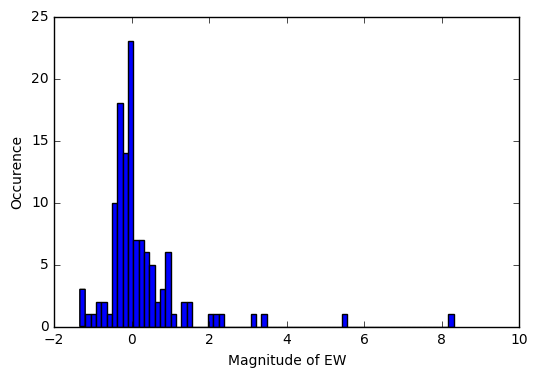

In [15]:
eq_width_ls=[]
for i in New_SN_Array:
    eq_width_ls.append(i.ew_c)
    
plt.hist(eq_width_ls, 70)
plt.xlabel('Magnitude of EW')
plt.ylabel('Occurence')
plt.show()

# Equivalent Width Error

In [16]:
def eq_width_gaussian(sn, new_flux, w1, w2, w3, plot=False):
    
    initial=max_wave(sn, w1, w2, w3, False)
    
    max_1 = initial[0]
    max_2 = initial[1]
    
    sm_flux= initial[2]
    
    if sn.wavelength[sn.x1:sn.x2][np.where(sm_flux==min(sm_flux[np.where((sn.wavelength[sn.x1:sn.x2]>6300.) & (sn.wavelength[sn.x1:sn.x2]<6400.))]))] >= 6324.:
        max_1 = max_wave(sn, 6200, 6310, 6400, False)[0]
        max_2= max_wave(sn, 6200, 6330, 6400, False)[1]
    
    if max_2-max_1<24.:
        max_1=6280.
        max_2=6350.

    domain = (sn.wavelength[sn.x1:sn.x2] >= max_1) & (sn.wavelength[sn.x1:sn.x2] <= max_2)
    list(domain)
    wave_range = sn.wavelength[sn.x1:sn.x2][domain]
    flux_range = new_flux[domain]

    line_elem = np.polyfit([max_1, max_2], [sm_flux[np.where(sn.wavelength[sn.x1:sn.x2] == max_1)],
                                            sm_flux[np.where(sn.wavelength[sn.x1:sn.x2] == max_2)]], 1)
#         print(line_elem)
    line = line_elem[0] * wave_range + line_elem[1]
#         print line
#         ask about this

    norm = flux_range / line
    #new_norm = norm * 0 + 0.3
    #print (new_norm)


    a_curve = trapz((norm), x = wave_range)
    a_line = max(wave_range) - min(wave_range)

    eq_width_gaussian = a_line - a_curve
    
    if plot==True:
        plt.figure()
        plt.plot(sn.wavelength[sn.x1:sn.x2][np.where((sn.wavelength[sn.x1:sn.x2]>6000.) & (sn.wavelength[sn.x1:sn.x2]<6500.))], new_flux[np.where((sn.wavelength[sn.x1:sn.x2]>6000.) & (sn.wavelength[sn.x1:sn.x2]<6500.))])
        plt.plot(sn.wavelength[sn.x1:sn.x2][np.where((sn.wavelength[sn.x1:sn.x2]>6000.) & (sn.wavelength[sn.x1:sn.x2]<6500.))], sm_flux[np.where((sn.wavelength[sn.x1:sn.x2]>6000.) & (sn.wavelength[sn.x1:sn.x2]<6500.))], color='blue')
        plt.axvline (x=max_1, color = 'red')
        plt.axvline (x=max_2, color = 'red')
        plt.plot(sn.wavelength[sn.x1:sn.x2][domain],line, color='orange')
#         plt.xlim([6200.,6400.])
        plt.show()

        plt.figure()
        plt.plot(sn.wavelength[sn.x1:sn.x2][np.where((sn.wavelength[sn.x1:sn.x2]>6200.) & (sn.wavelength[sn.x1:sn.x2]<6400.))], new_flux[np.where((sn.wavelength[sn.x1:sn.x2]>6200.) & (sn.wavelength[sn.x1:sn.x2]<6400.))])
        plt.plot(sn.wavelength[sn.x1:sn.x2][np.where((sn.wavelength[sn.x1:sn.x2]>6200.) & (sn.wavelength[sn.x1:sn.x2]<6400.))], sm_flux[np.where((sn.wavelength[sn.x1:sn.x2]>6200.) & (sn.wavelength[sn.x1:sn.x2]<6400.))], color='blue')
        plt.axvline (x=max_1, color = 'red')
        plt.axvline (x=max_2, color = 'red')
        plt.plot(sn.wavelength[sn.x1:sn.x2][domain],line, color='orange')
#         plt.xlim([6200.,6400.])
        plt.show()
#         plt.plot(norm, color = 'black')
#         plt.plot(wave_range, norm, color = "orange")
#         plt.plot(wave_range , 1, color = "yellow")
#         plt.axvline (x=max_1, color = 'red')
#         plt.axvline (x=max_2, color = 'blue')

    return eq_width_gaussian

In [17]:
def ew_error(sn, num, plot=False):
    eq_width_gaussians=[]
    locs=np.where((sn.wavelength[sn.x1:sn.x2] >= 6200) & (sn.wavelength[sn.x1:sn.x2] <= 6400))
    sm_flux= gsmooth(sn.wavelength[sn.x1:sn.x2], sn.flux[sn.x1:sn.x2], 1/sn.ivar[sn.x1:sn.x2], sm_vexp(sn))
    sig= np.average(np.absolute(sn.flux[sn.x1:sn.x2][locs] - sm_flux[locs]))
     
    for i in range(0,num):
        new_flux= copy.deepcopy(sm_flux)
        delta_flux= np.random.normal(loc=0, scale=sig, size=101)
        new_flux[locs]= new_flux[locs] + delta_flux
        eq_width_gaussians.append(eq_width_gaussian(sn, new_flux, 6200, 6300, 6400))
        
        if plot==True:
            print eq_width_gaussian(sn, new_flux, 6200, 6300, 6400, plot=True)

        np.warnings.filterwarnings('ignore')
    return np.std(eq_width_gaussians)#, np.average(eq_width_gaussians)#, plt.hist(eq_width_gaussians, 60)

In [18]:
for i in SN_Array:
    if i in New_SN_Array:
        i.__setattr__('ew_c_error', ew_error(i,100))
    else:
        i.__setattr__('ew_c_error', 'nan')

Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1991t | F | 0.558816847604 | 0.135845434801 | 0.966353152007 | 0.830507717206 | 0.694662282405


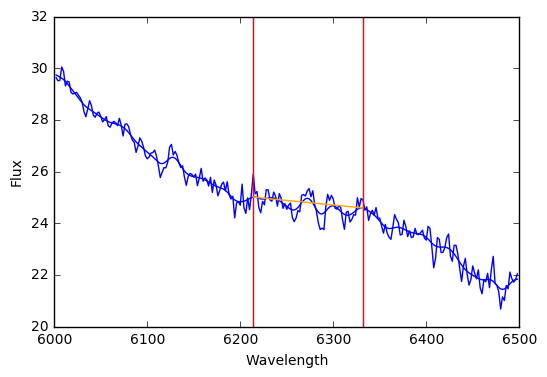

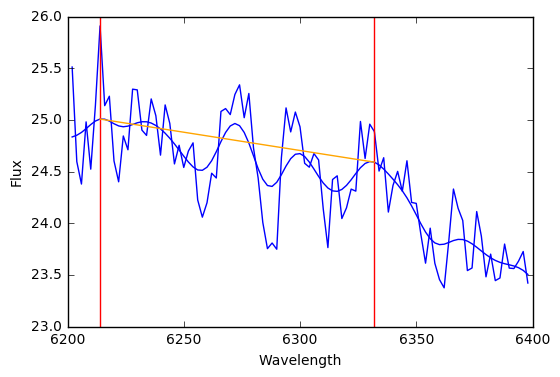

0.558816847604
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1994d | A | 0.220862651182 | 0.0317225341116 | 0.316030253517 | 0.284307719406 | 0.252585185294


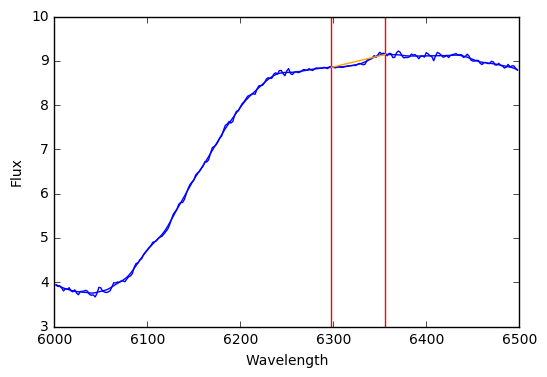

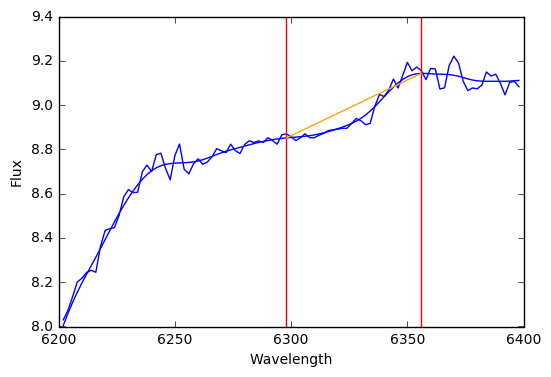

0.220862651182
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1997br | N | 0.467376428926 | 0.140252656204 | 0.888134397538 | 0.747881741334 | 0.60762908513


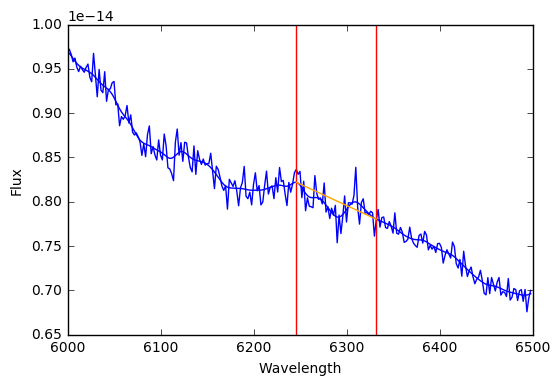

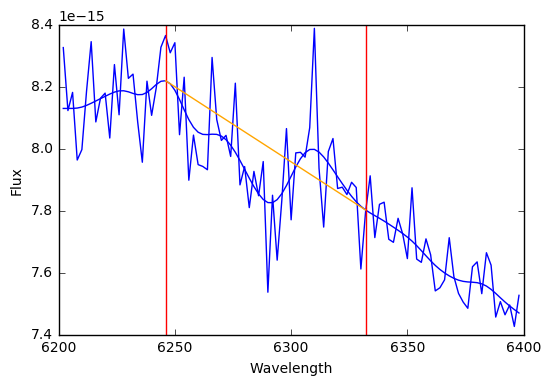

0.467376428926
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1998aq | F | 1.51816918444 | 0.0834284426584 | 1.76845451241 | 1.68502606975 | 1.6015976271


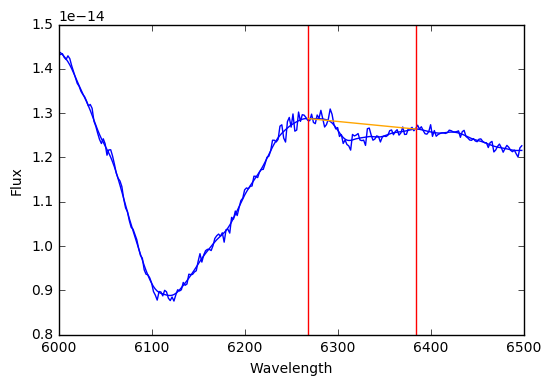

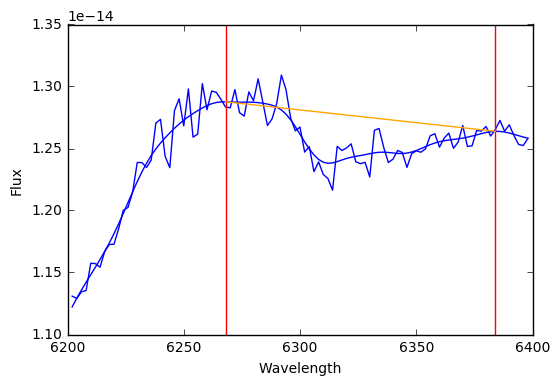

1.51816918444
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1998dh | N | 0.28435931569 | 0.0882402088191 | 0.549079942148 | 0.460839733329 | 0.37259952451


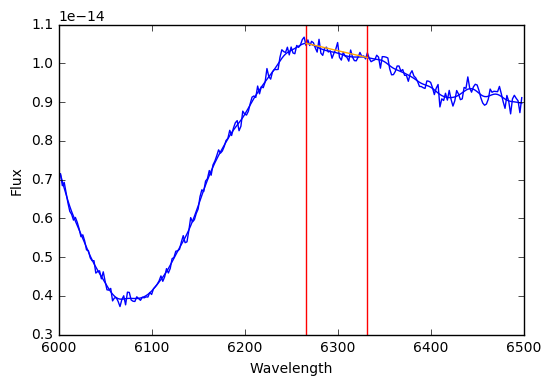

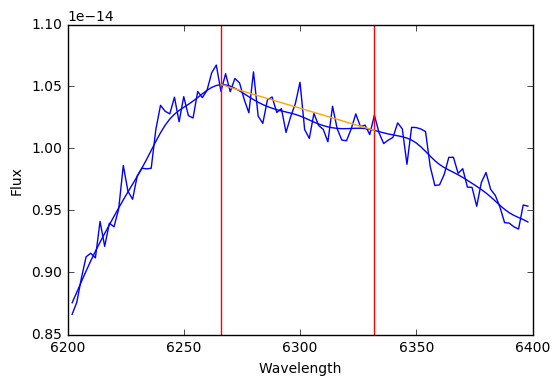

0.28435931569
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1998dm | A | 1.35235711916 | 0.0444091786646 | 1.48558465516 | 1.44117547649 | 1.39676629783


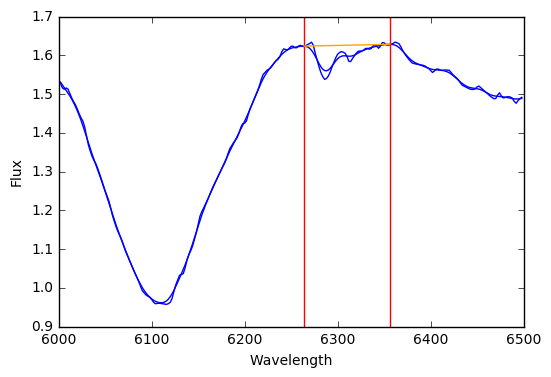

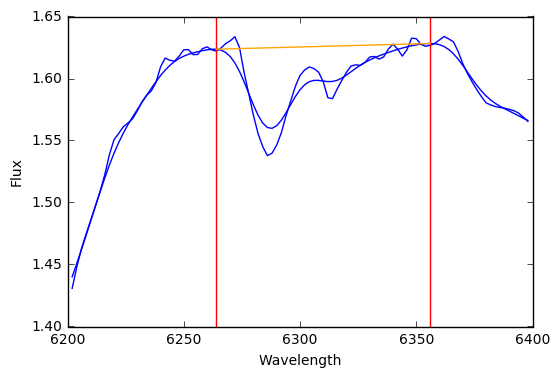

1.35235711916
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1999aa | N | 0.200395195561 | 0.0887004766927 | 0.466496625639 | 0.377796148947 | 0.289095672254


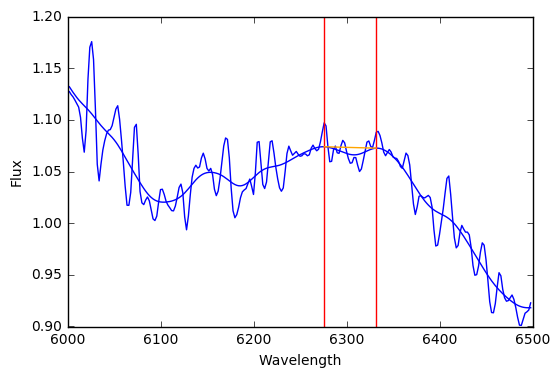

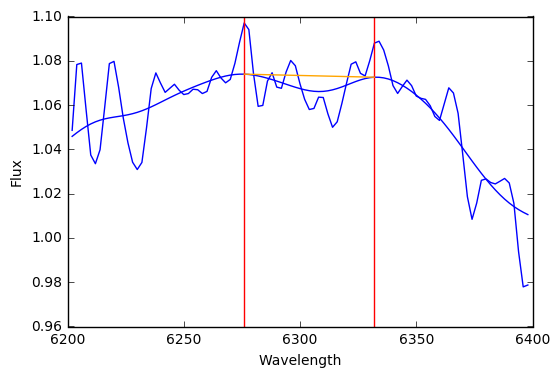

0.200395195561
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1999ac | F | 0.162862586817 | 0.0763001707996 | 0.391763099216 | 0.315462928416 | 0.239162757617


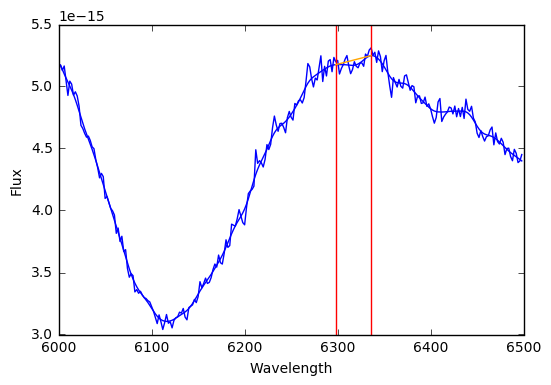

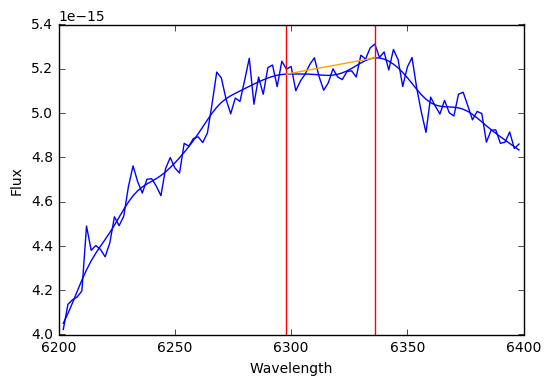

0.162862586817
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1999by | F | 0.447708005272 | 0.106328099641 | 0.766692304194 | 0.660364204553 | 0.554036104913


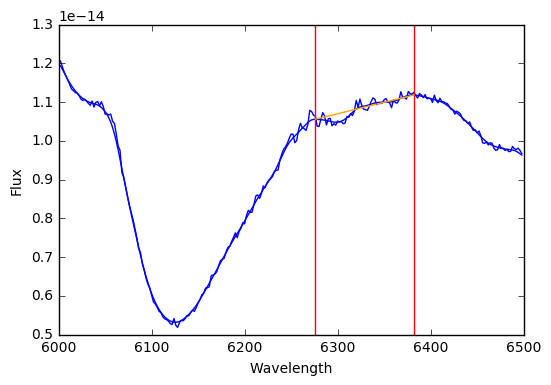

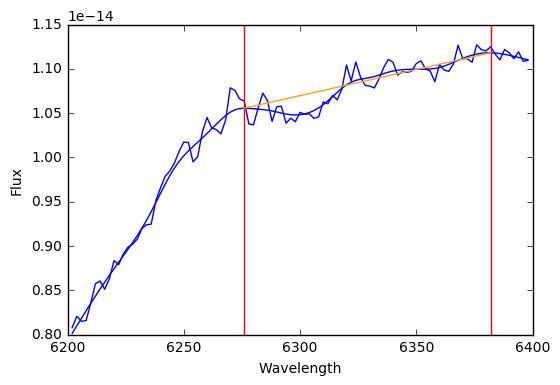

0.447708005272
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1999cl | N | 0.0307451621551 | 0.0413938246338 | 0.154926636056 | 0.113532811423 | 0.0721389867889


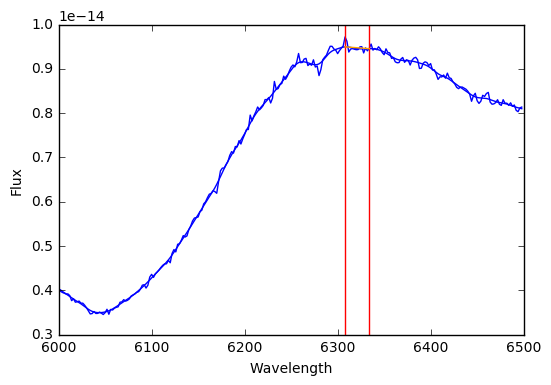

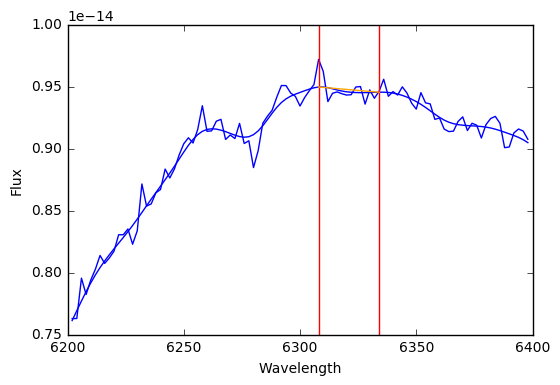

0.0307451621551
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1999dk | F | 0.013665547195 | 0.0152689592468 | 0.0594724249354 | 0.0442034656886 | 0.0289345064418


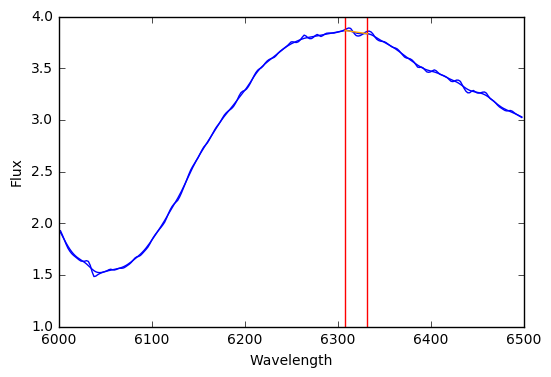

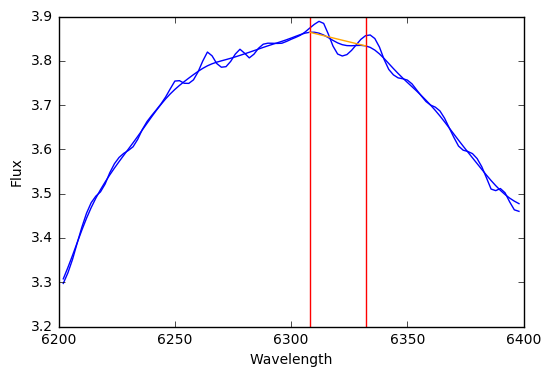

0.013665547195
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1999dq | N | 0.0586153150475 | 0.0572396579049 | 0.230334288762 | 0.173094630857 | 0.115854972952


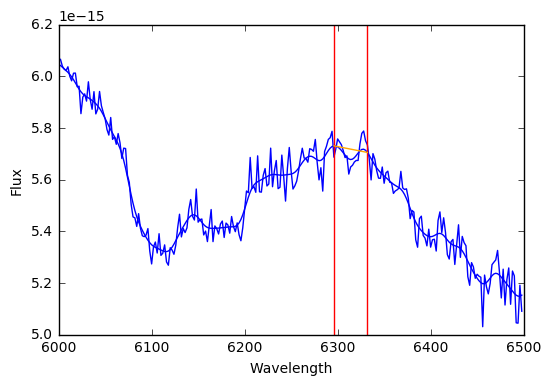

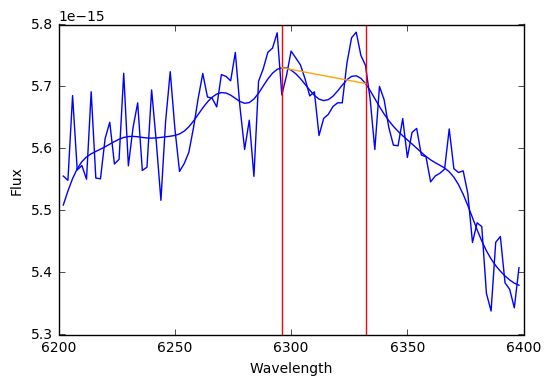

0.0586153150475
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2000dk | N | 0.638119795001 | 0.211715250733 | 1.2732655472 | 1.06155029647 | 0.849835045733


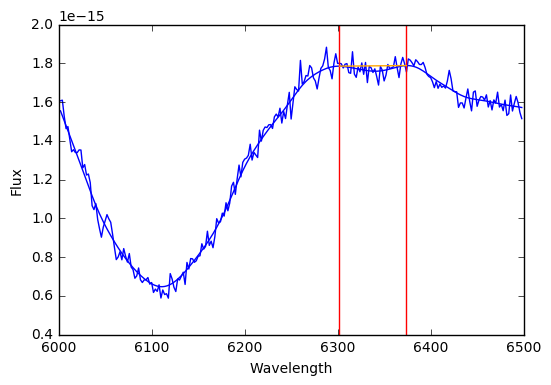

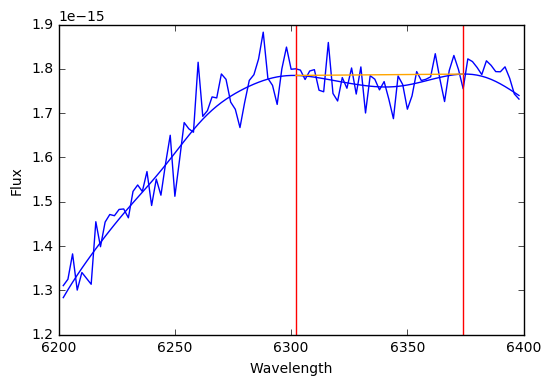

0.638119795001
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2001az | F | 0.0268348478849 | 0.0931659298841 | 0.306332637537 | 0.213166707653 | 0.120000777769


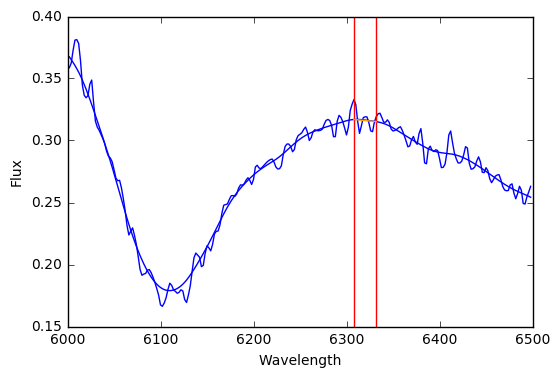

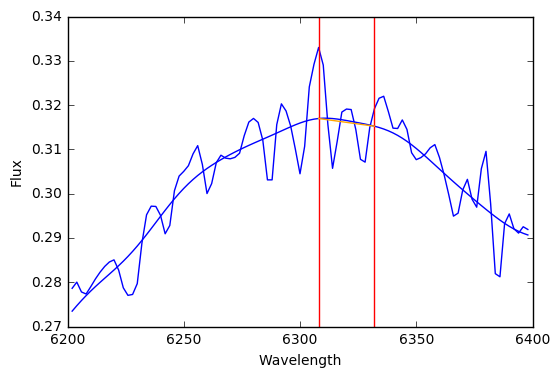

0.0268348478849
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2001ep | N | 0.386015155772 | 0.175389852824 | 0.912184714245 | 0.736794861421 | 0.561405008596


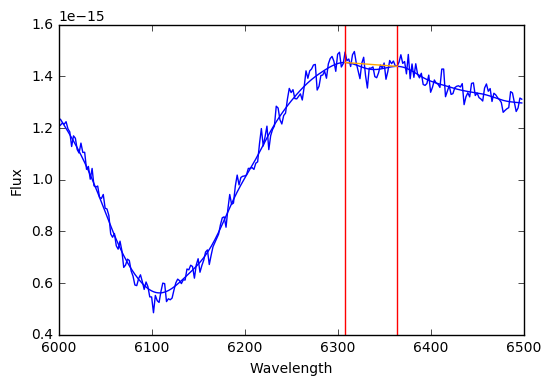

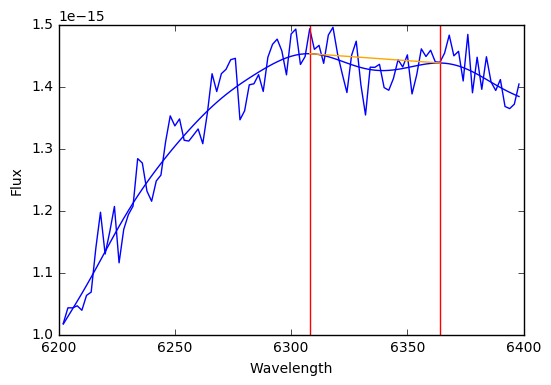

0.386015155772
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2001fe | F | 0.496736051495 | 0.149372359096 | 0.944853128784 | 0.795480769687 | 0.646108410591


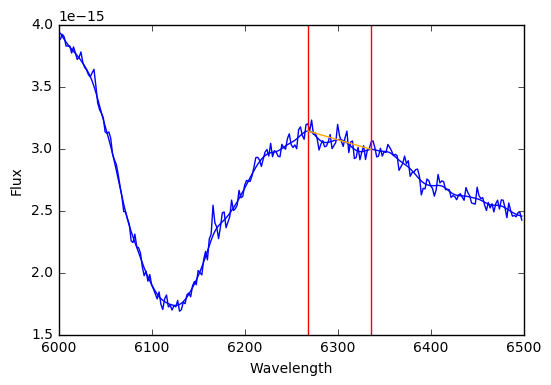

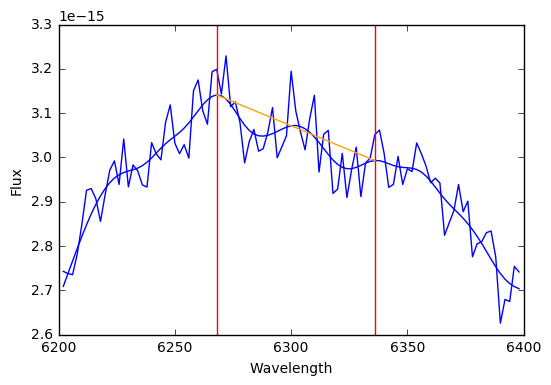

0.496736051495
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2002bo | N | 1.06094470756 | 0.203836592117 | 1.67245448392 | 1.4686178918 | 1.26478129968


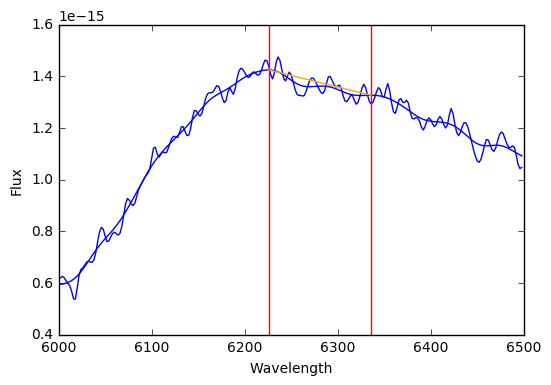

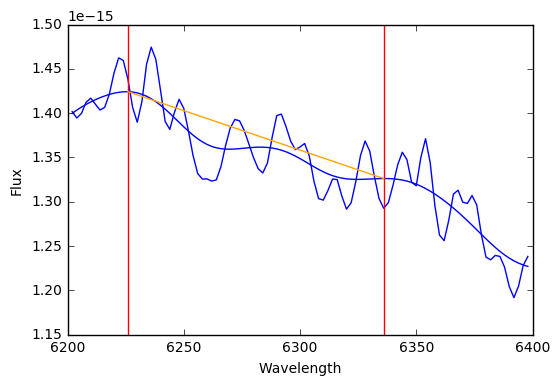

1.06094470756
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2002bo | N | 0.561857458559 | 0.0772830617048 | 0.793706643673 | 0.716423581968 | 0.639140520264


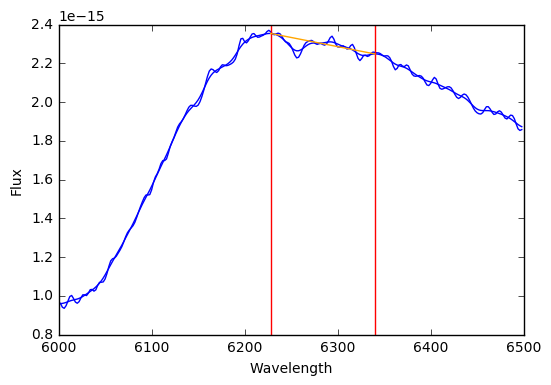

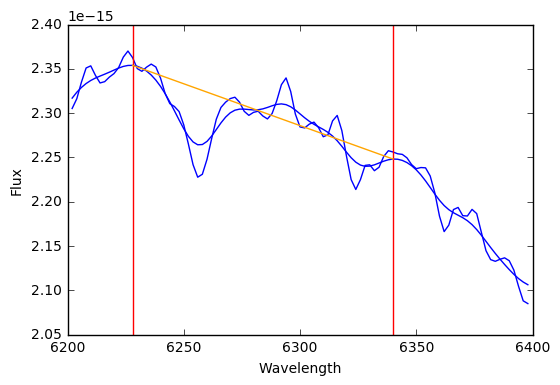

0.561857458559
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2002cr | A | 0.892994485528 | 0.188172562229 | 1.45751217222 | 1.26933960999 | 1.08116704776


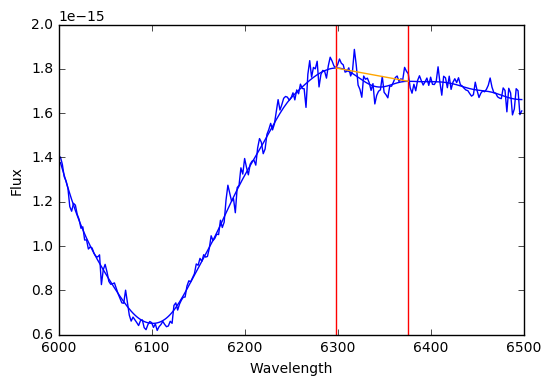

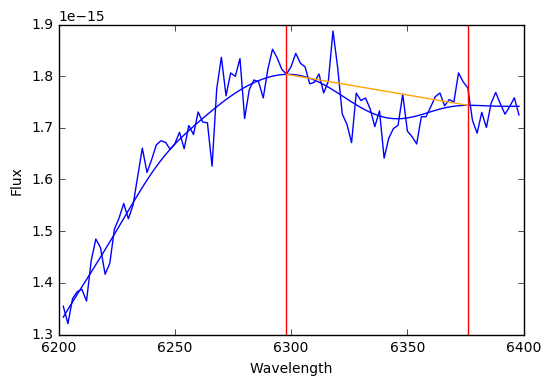

0.892994485528
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2002er | F | 0.381816179469 | 0.102451835746 | 0.689171686707 | 0.586719850961 | 0.484268015215


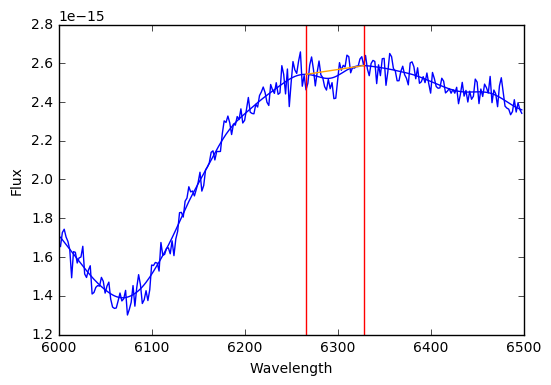

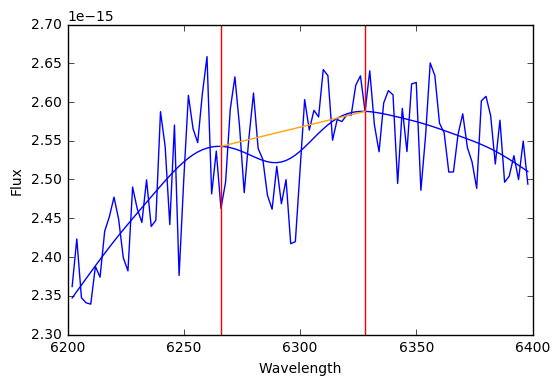

0.381816179469
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2002fb | N | 3.131986135 | 1.01228127416 | 6.16882995748 | 5.15654868332 | 4.14426740916


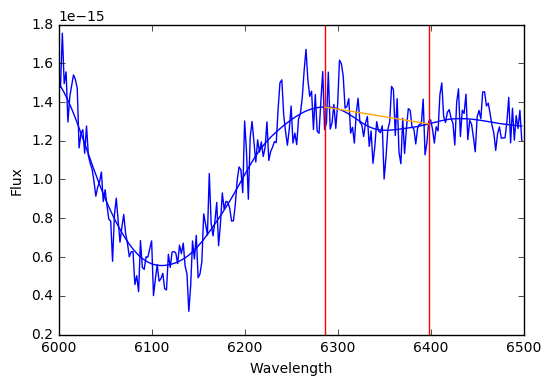

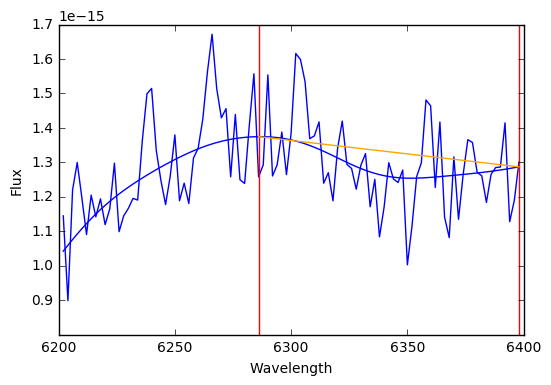

3.131986135
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2002hw | A | 0.862371345229 | 0.0807353065984 | 1.10457726502 | 1.02384195843 | 0.943106651828


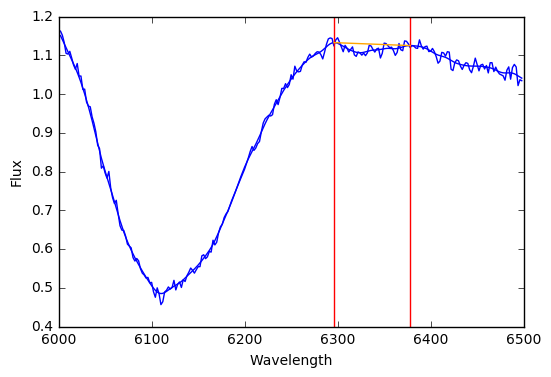

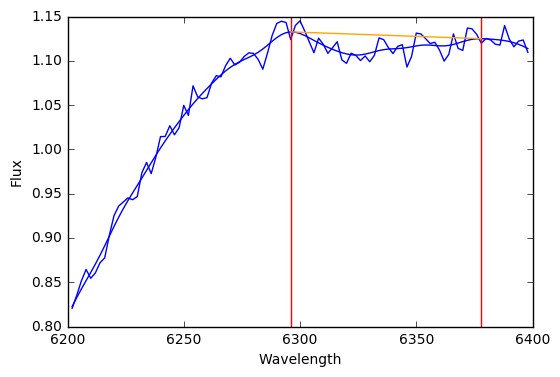

0.862371345229
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2003cq | N | 0.71522911148 | 0.817079846094 | 3.16646864976 | 2.34938880367 | 1.53230895757


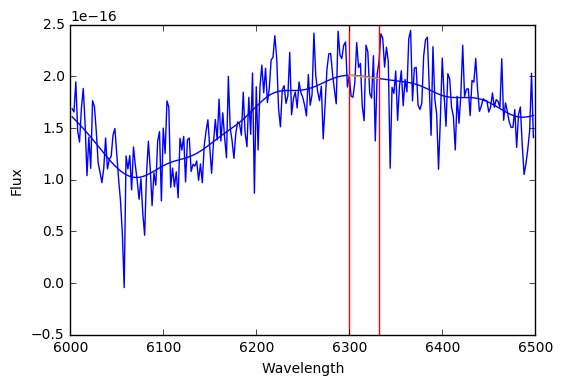

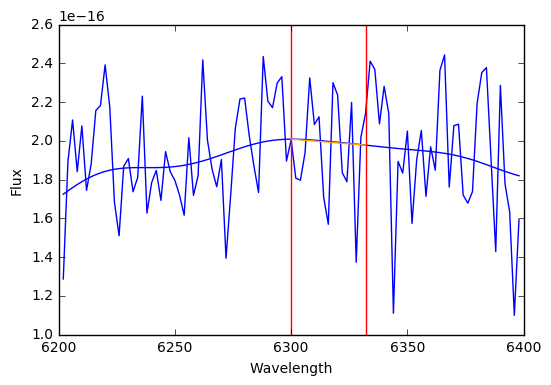

0.71522911148
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2003du | F | 2.0717242337 | 0.0560967367906 | 2.24001444407 | 2.18391770728 | 2.12782097049


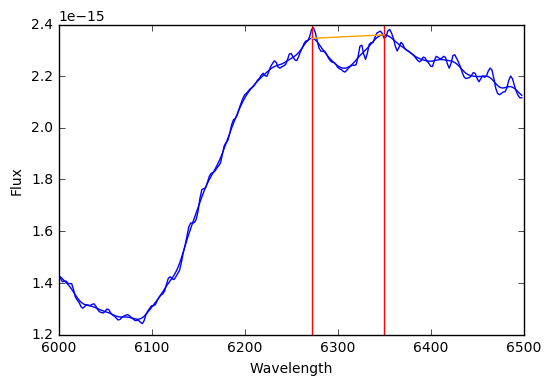

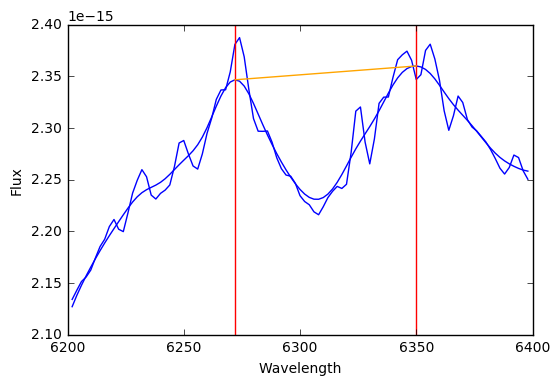

2.0717242337
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2003kf | A | 0.995306569744 | 0.0494780935753 | 1.14374085047 | 1.09426275689 | 1.04478466332


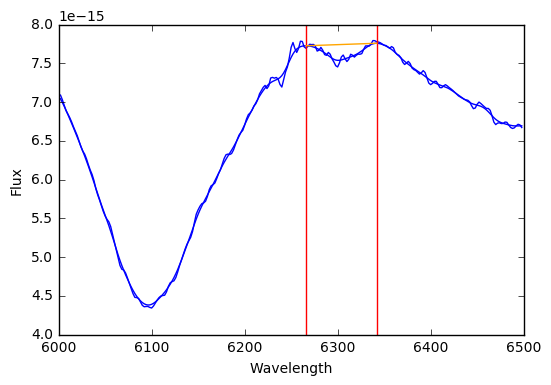

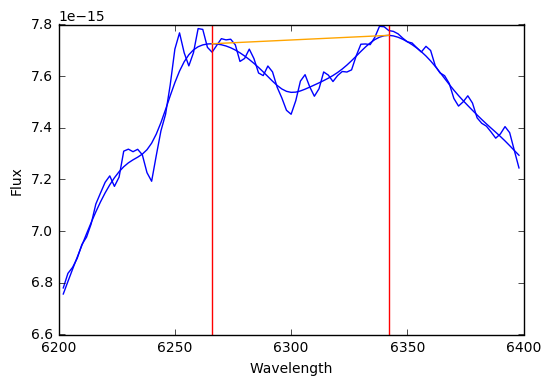

0.995306569744
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2003u | F | 2.30048140566 | 0.300296500143 | 3.20137090608 | 2.90107440594 | 2.6007779058


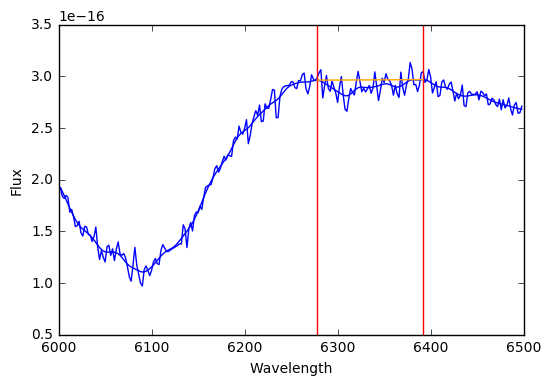

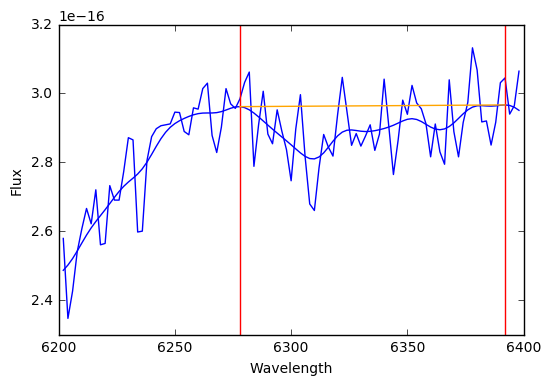

2.30048140566
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2003w | N | 0.0900221189673 | 0.113220320438 | 0.429683080282 | 0.316462759844 | 0.203242439405


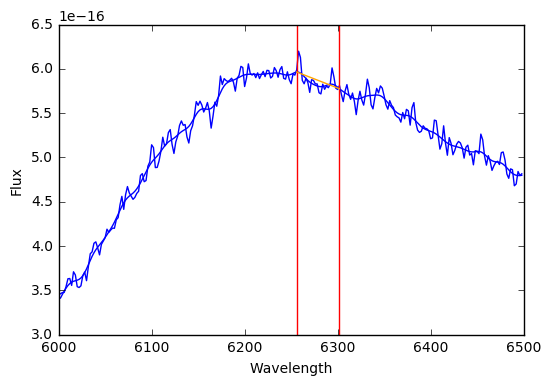

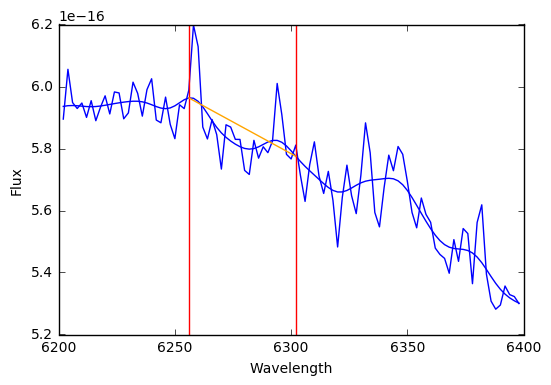

0.0900221189673
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2004ey | A | 0.151075944435 | 0.0398117562415 | 0.270511213159 | 0.230699456918 | 0.190887700676


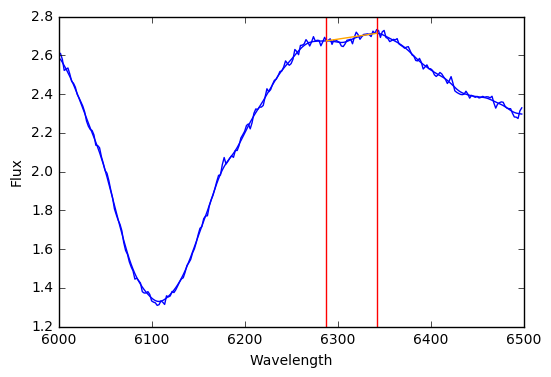

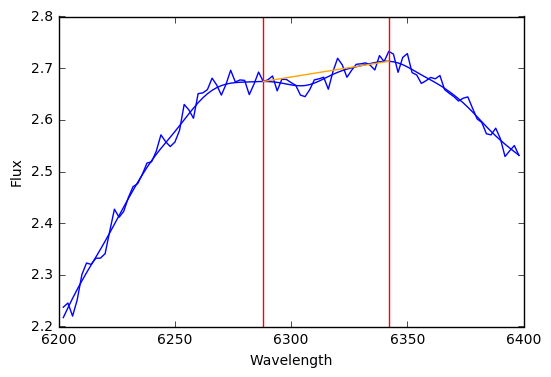

0.151075944435
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2004fu | N | 0.303893843804 | 0.160913625689 | 0.78663472087 | 0.625721095182 | 0.464807469493


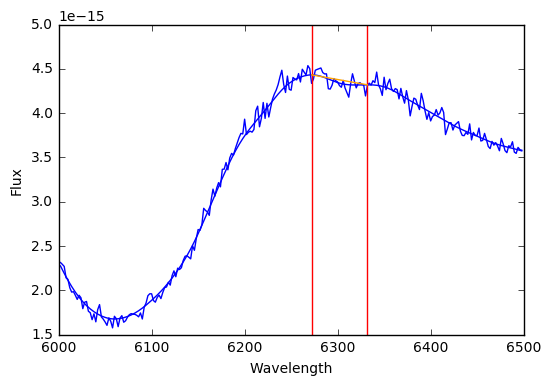

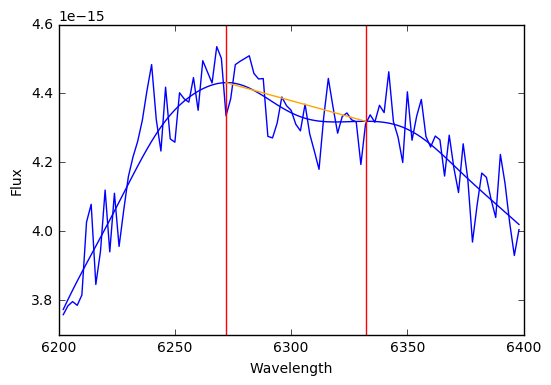

0.303893843804
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2005ag | N | 8.30944820511 | 2.14516109716 | 14.7449314966 | 12.5997703994 | 10.4546093023


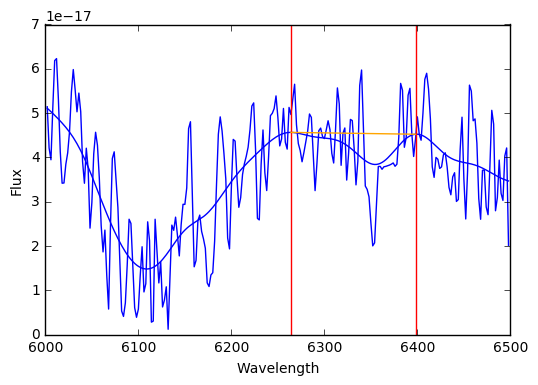

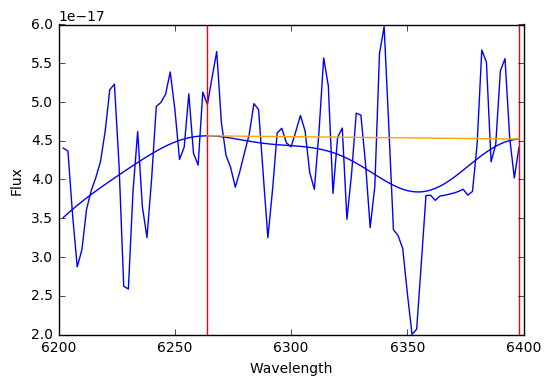

8.30944820511
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2005cf | A | 0.407051902723 | 0.0252042099357 | 0.48266453253 | 0.457460322595 | 0.432256112659


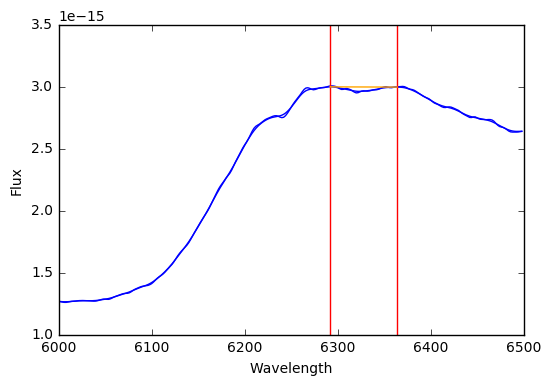

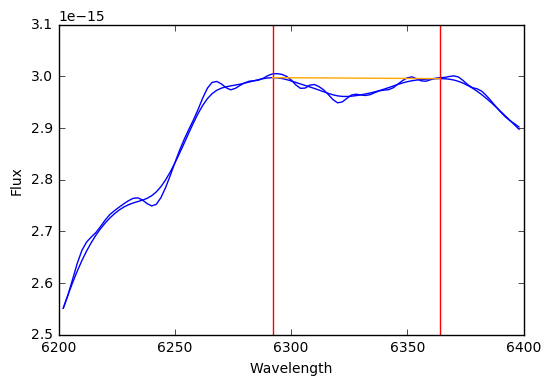

0.407051902723
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2005el | A | 3.41634713084 | 0.113405725719 | 3.75656430799 | 3.64315858227 | 3.52975285655


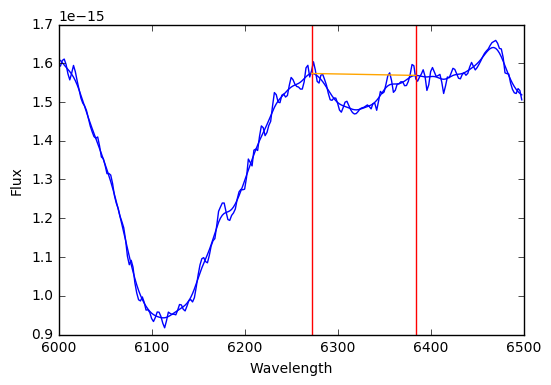

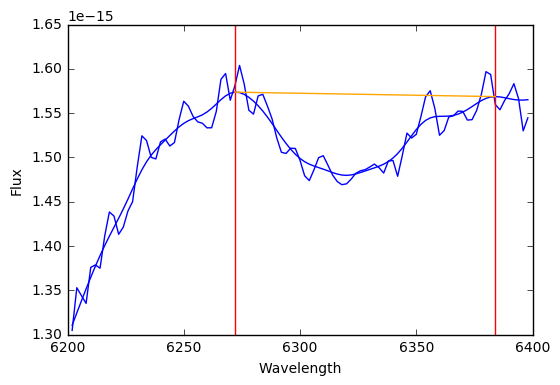

3.41634713084
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2005eq | N | 0.276550548624 | 0.358563586878 | 1.35224130926 | 0.99367772238 | 0.635114135502


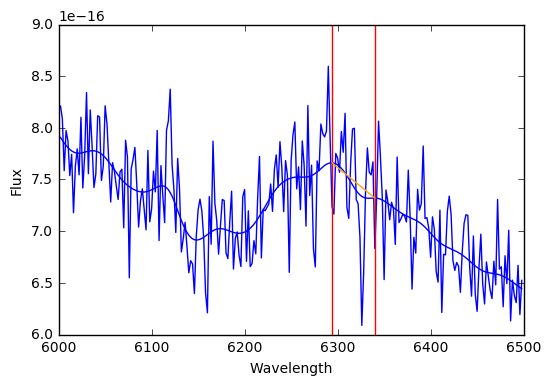

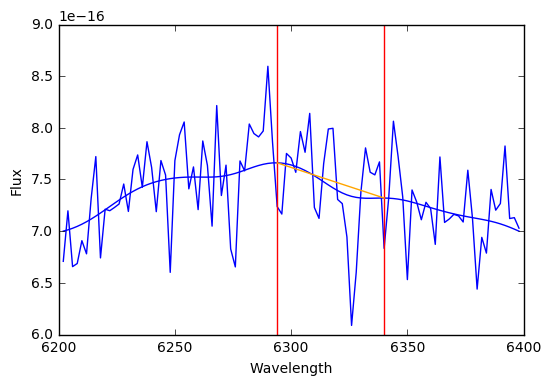

0.276550548624
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2005eu | A | 0.148582880678 | 0.163940993287 | 0.640405860538 | 0.476464867252 | 0.312523873965


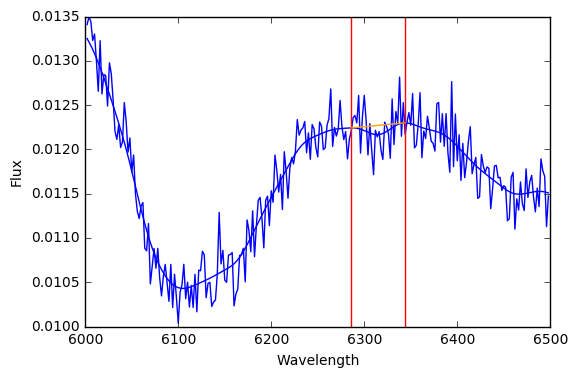

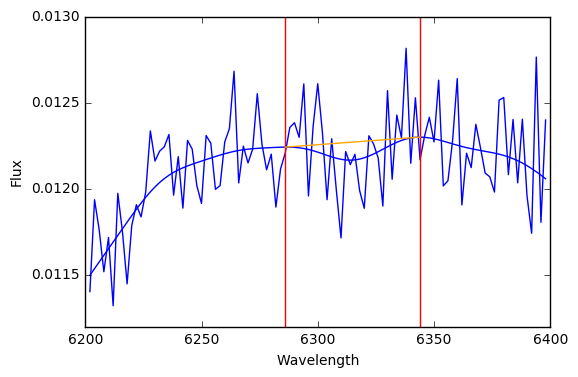

0.148582880678
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2005hc | N | 0.887399281824 | 0.913382803181 | 3.62754769137 | 2.71416488819 | 1.80078208501


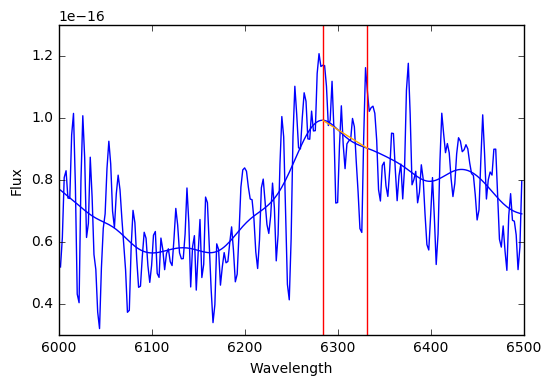

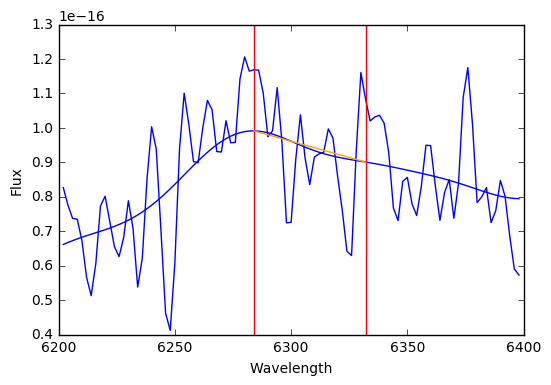

0.887399281824
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2005iq | A | 0.58494661732 | 0.670918785457 | 2.59770297369 | 1.92678418823 | 1.25586540278


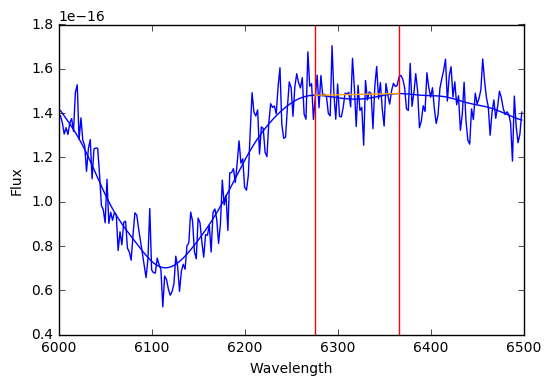

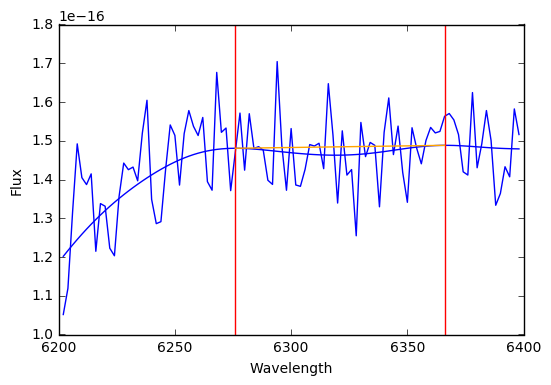

0.58494661732
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2005ki | A | 0.357222875262 | 0.68836252171 | 2.42231044039 | 1.73394791868 | 1.04558539697


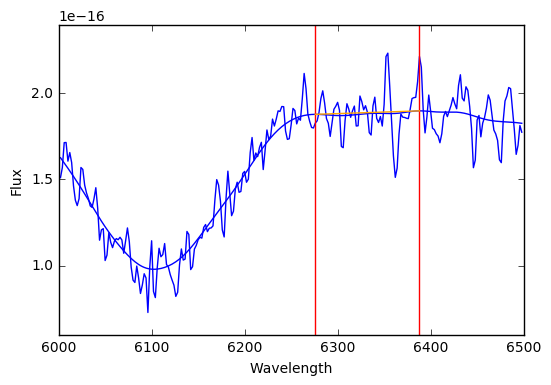

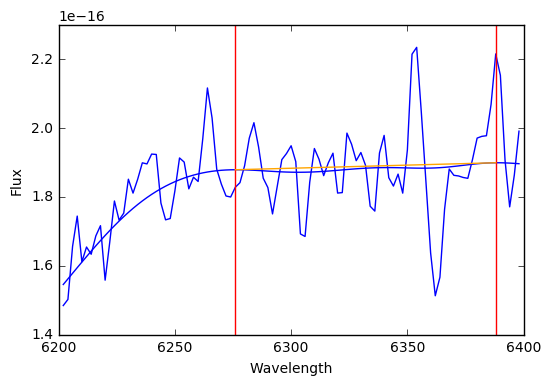

0.357222875262
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2005m | N | 0.150353124883 | 0.201737611196 | 0.755565958471 | 0.553828347275 | 0.352090736079


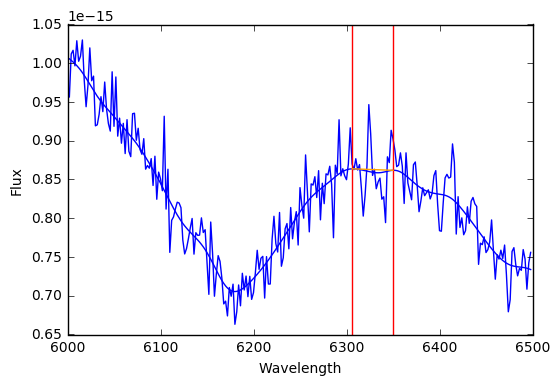

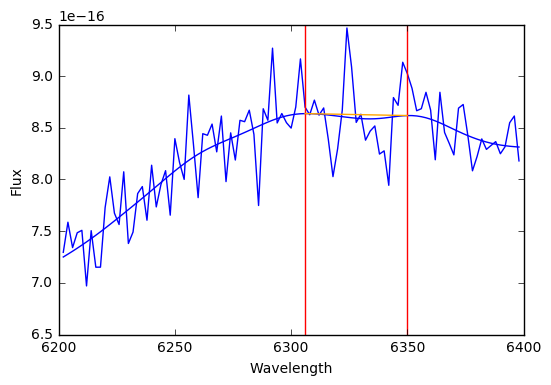

0.150353124883
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2006ax | F | 0.846009770934 | 0.208812276958 | 1.47244660181 | 1.26363432485 | 1.05482204789


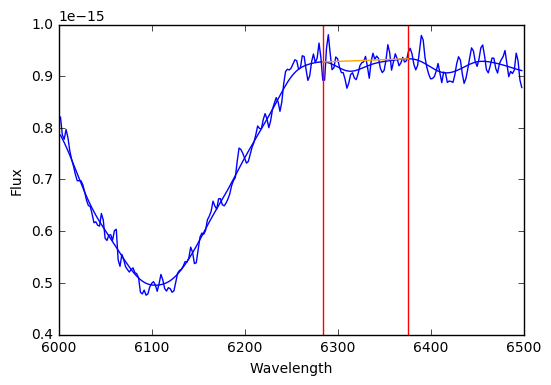

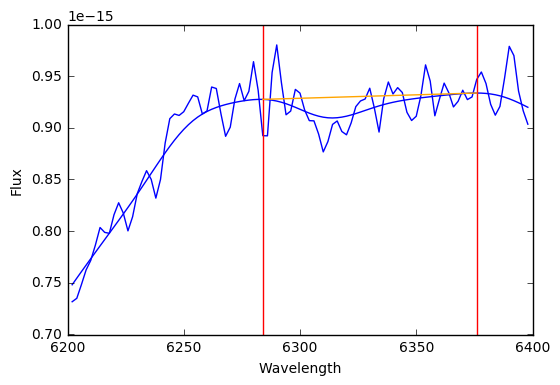

0.846009770934
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2006d | A | 5.53379396966 | 0.0772951345606 | 5.76567937334 | 5.68838423878 | 5.61108910422


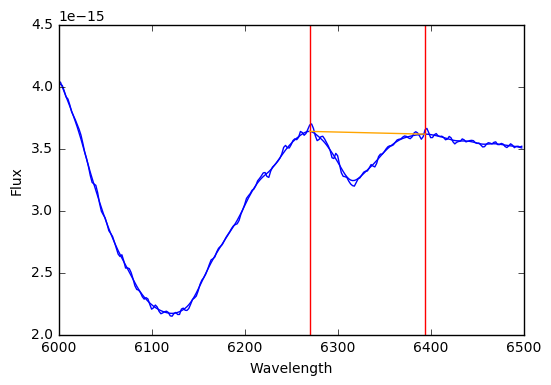

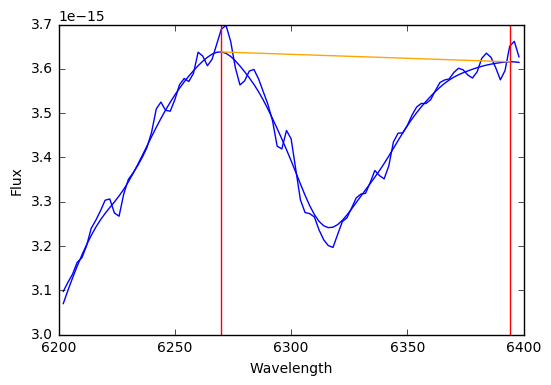

5.53379396966
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2006ef | N | 0.00646347726118 | 0.0185106013249 | 0.0619952812359 | 0.043484679911 | 0.0249740785861


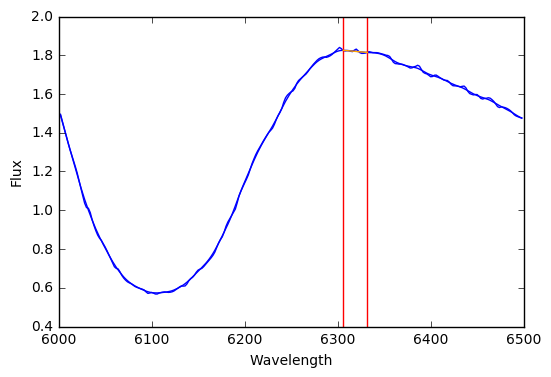

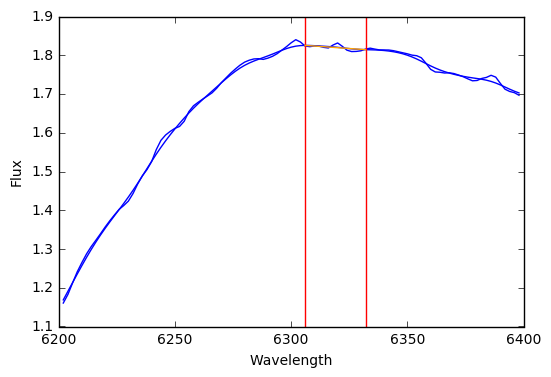

0.00646347726118
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2006et | N | 0.0367683598004 | 0.153444558983 | 0.49710203675 | 0.343657477767 | 0.190212918784


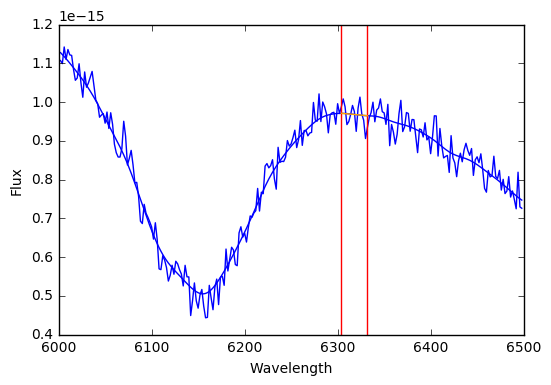

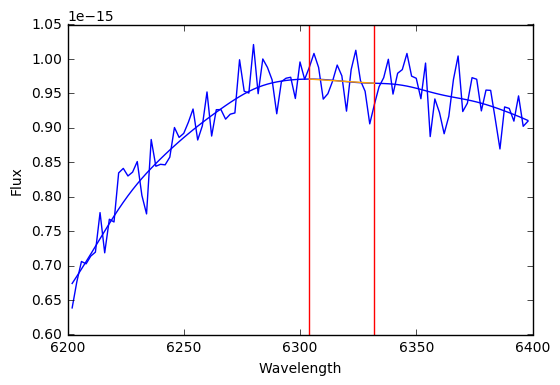

0.0367683598004
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2006kf | N | 0.899444315076 | 0.150191880612 | 1.35001995691 | 1.1998280763 | 1.04963619569


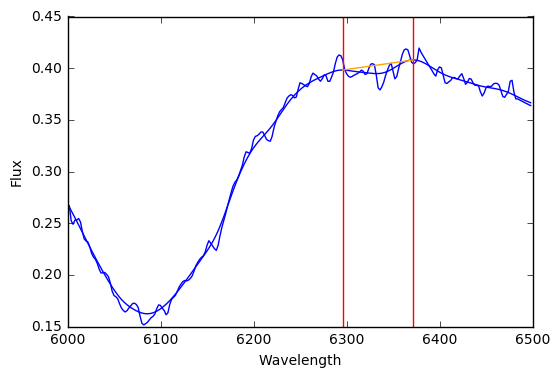

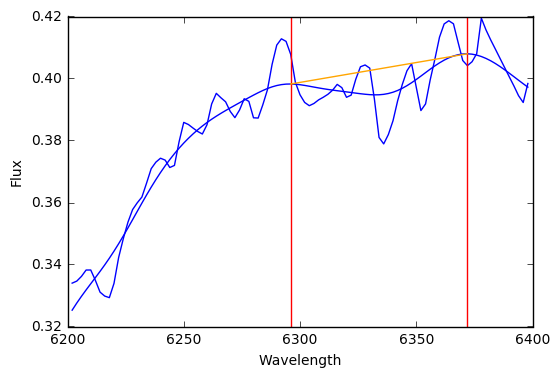

0.899444315076
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2006n | N | 0.295443282011 | 0.0973962475415 | 0.587632024635 | 0.490235777094 | 0.392839529552


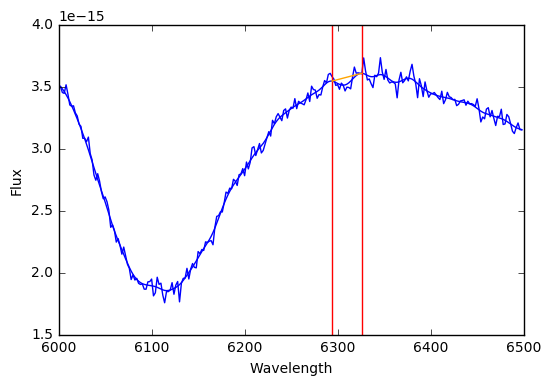

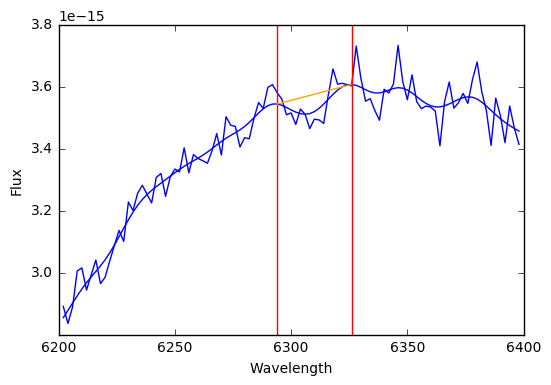

0.295443282011
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2006s | N | 0.0258673957919 | 0.386055138204 | 1.1840328104 | 0.797977672199 | 0.411922533996


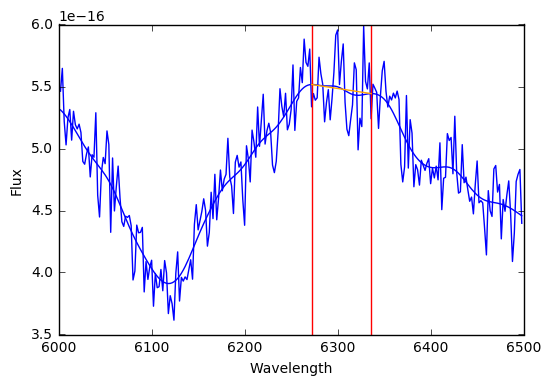

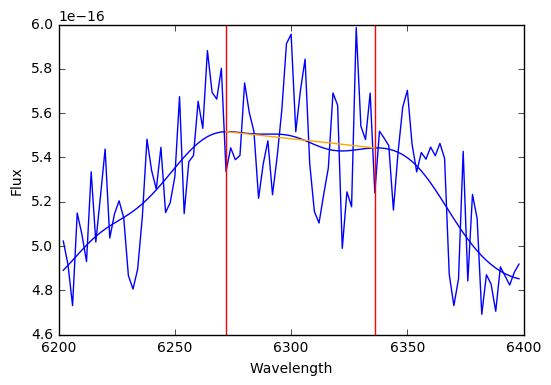

0.0258673957919
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2007bd | N | 0.112466937728 | 0.524144746395 | 1.68490117691 | 1.16075643052 | 0.636611684123


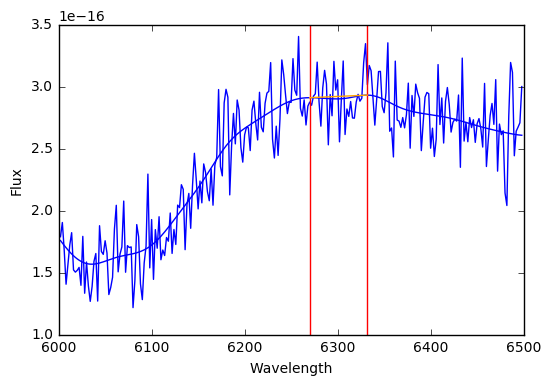

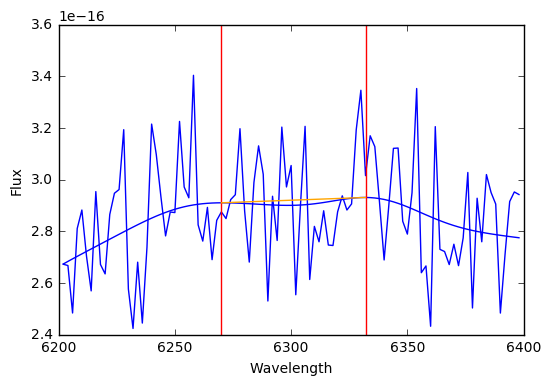

0.112466937728
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2007bm | A | 1.46870708823 | 0.26099974675 | 2.25170632848 | 1.99070658173 | 1.72970683498


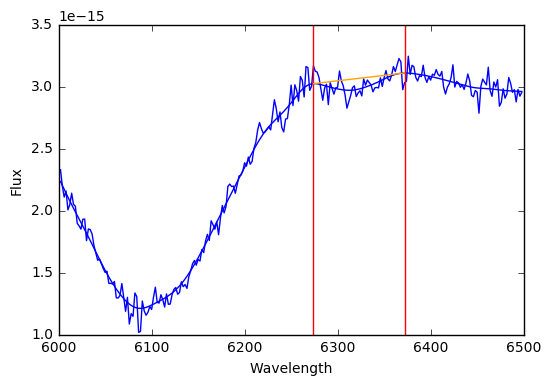

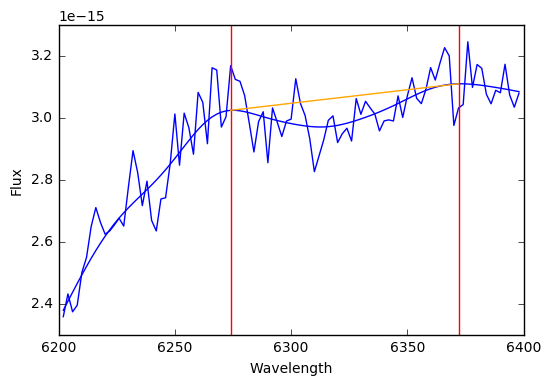

1.46870708823
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2007ca | N | 0.849504555979 | 0.153890744953 | 1.31117679084 | 1.15728604588 | 1.00339530093


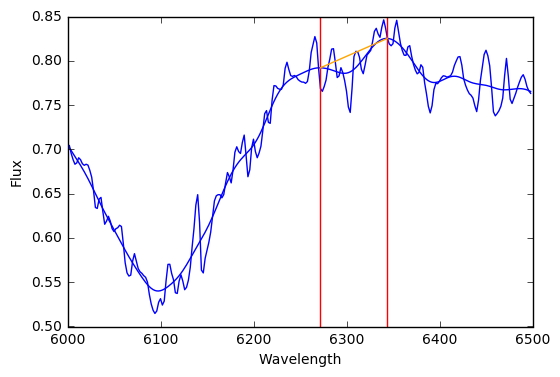

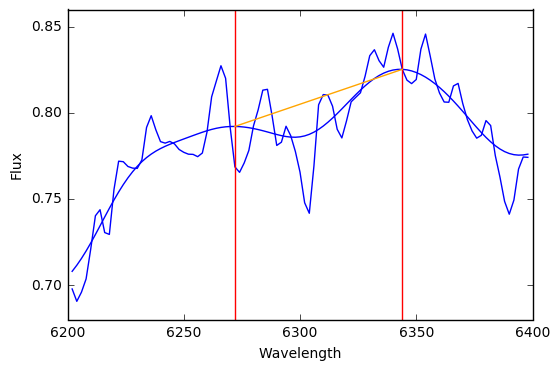

0.849504555979
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2007f | A | 0.979403580436 | 0.0724829213194 | 1.19685234439 | 1.12436942307 | 1.05188650176


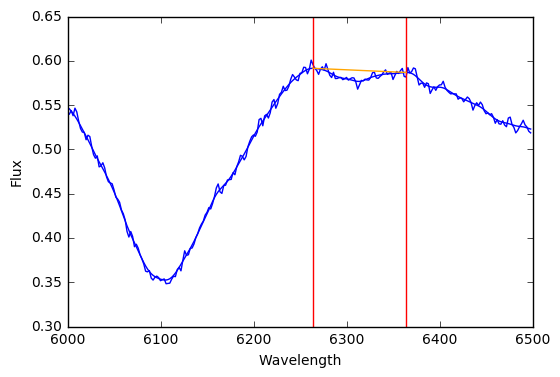

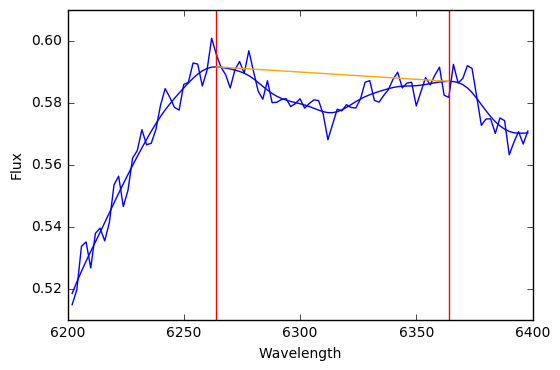

0.979403580436
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2007o | N | 0.00961367996531 | 0.0642661437326 | 0.202412111163 | 0.138145967431 | 0.0738798236979


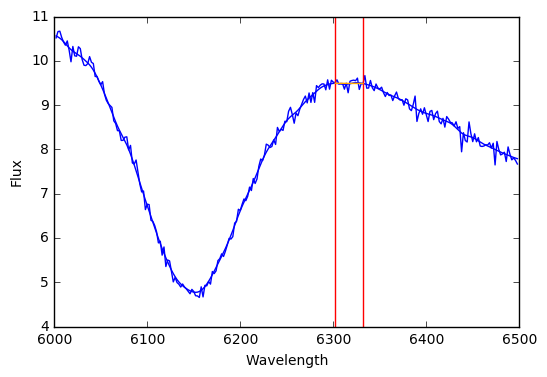

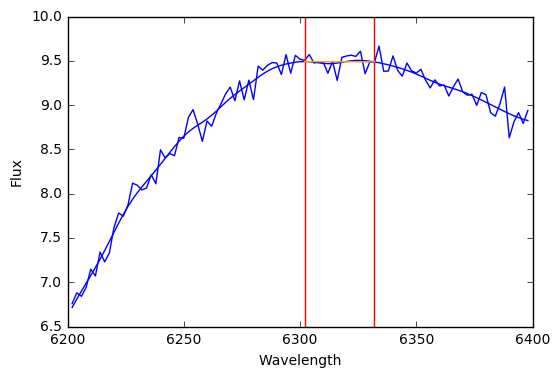

0.00961367996531
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2008bf | A | 2.22232363848 | 0.120165711824 | 2.58282077395 | 2.46265506213 | 2.3424893503


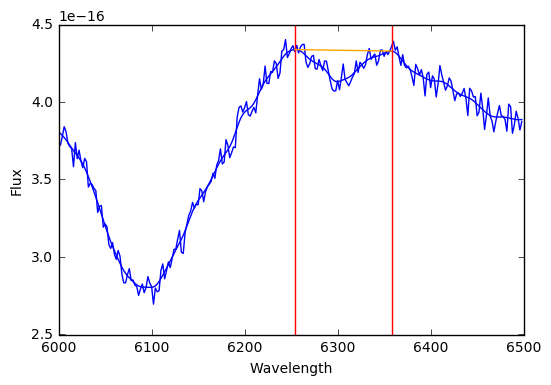

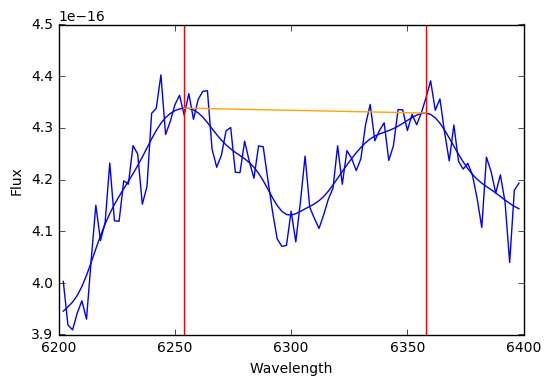

2.22232363848
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
1996x | F | 1.35570150029 | 0.0984372267796 | 1.65101318063 | 1.55257595385 | 1.45413872707


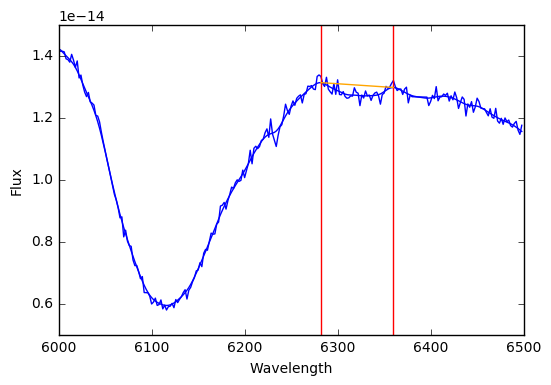

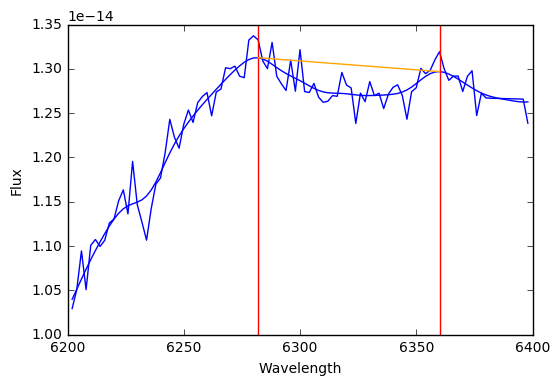

1.35570150029
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2003cg | F | 0.00344636127597 | 0.208697535758 | 0.62953896855 | 0.420841432792 | 0.212143897034


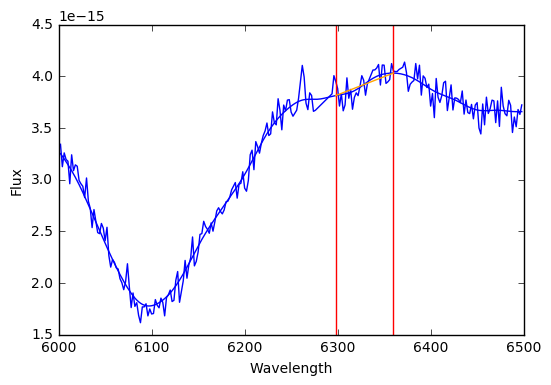

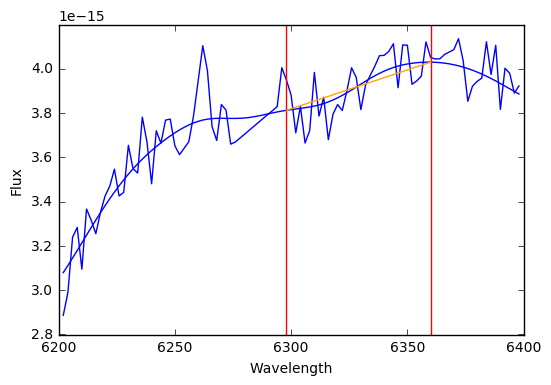

0.00344636127597
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2007jg | N | 0.217698952601 | 0.256735172998 | 0.987904471594 | 0.731169298597 | 0.474434125599


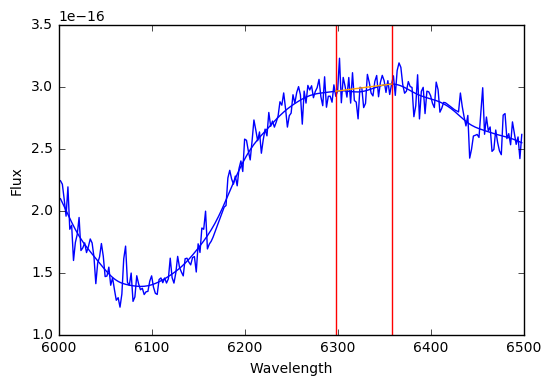

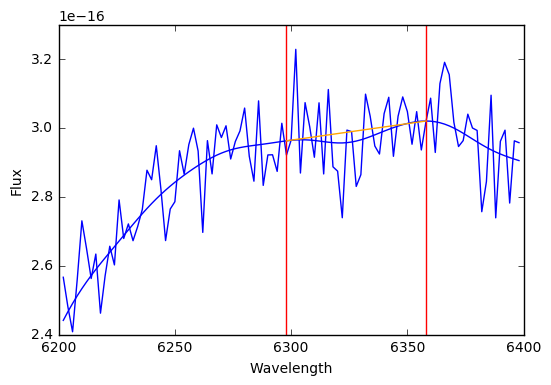

0.217698952601
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2006hx | N | 0.359412551343 | 0.210570593819 | 0.991124332801 | 0.780553738981 | 0.569983145162


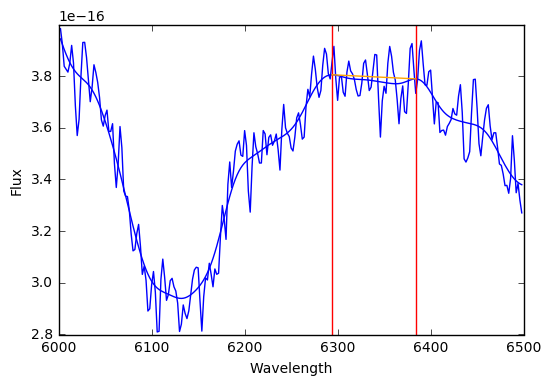

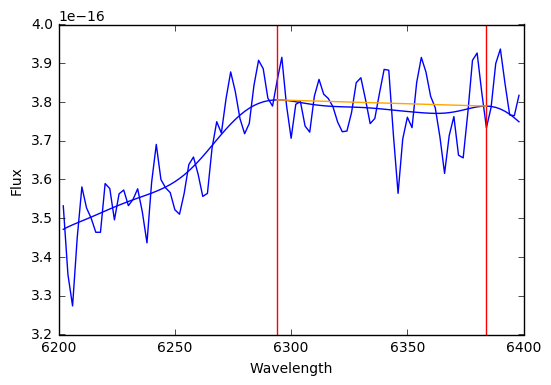

0.359412551343
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2007as | N | 0.0304733569039 | 0.0508682863126 | 0.183078215842 | 0.132209929529 | 0.0813416432166


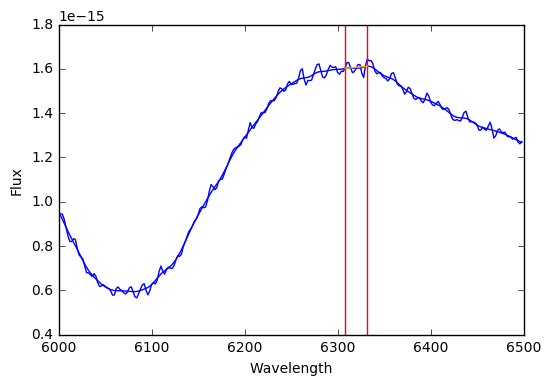

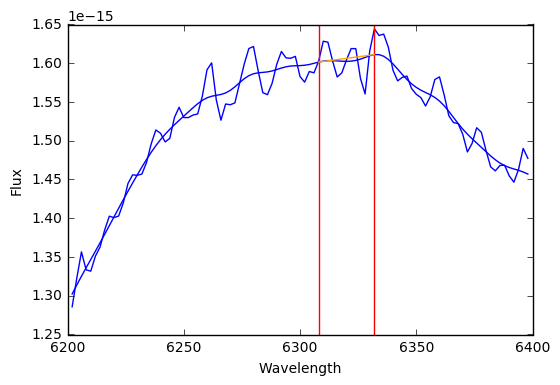

0.0304733569039
Name | Carbon |  EW         |     EW Error   |   3-Sigma     |   2-Sigma     |   1-Sigma 
2008fp | A | 0.891109102143 | 0.067026898416 | 1.09218979739 | 1.02516289898 | 0.958136000559


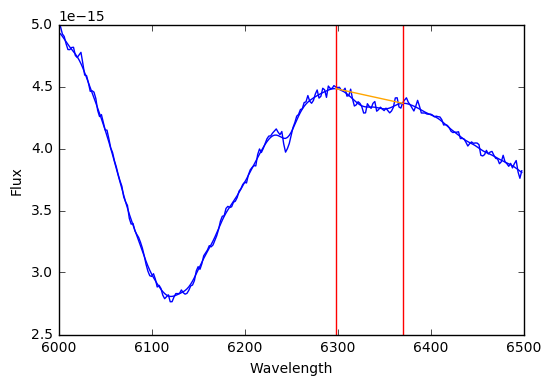

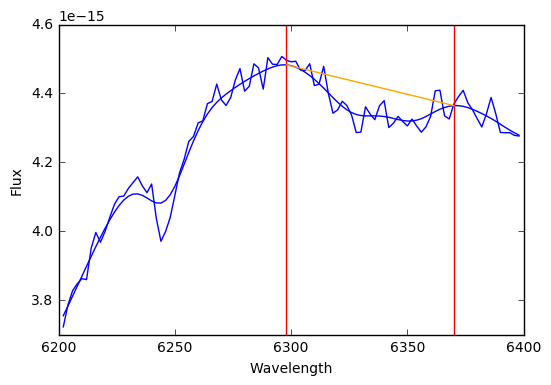

0.891109102143


In [19]:
for i in New_SN_Array:
    if i.ew_c > 0:
        print 'Name', '|', 'Carbon', '|', ' EW       ', ' | ', '   EW Error ', ' | ', ' 3-Sigma   ', ' | ', ' 2-Sigma   ', ' | ', ' 1-Sigma '
        print i.name, '|', i.carbon, '|', i.ew_c, '|', i.ew_c_error, '|', i.ew_c + 3*i.ew_c_error, '|', i.ew_c + 2*i.ew_c_error, '|', i.ew_c + i.ew_c_error
        print eq_width(i,6200,6300,6400, plot=True)

# Checking Code

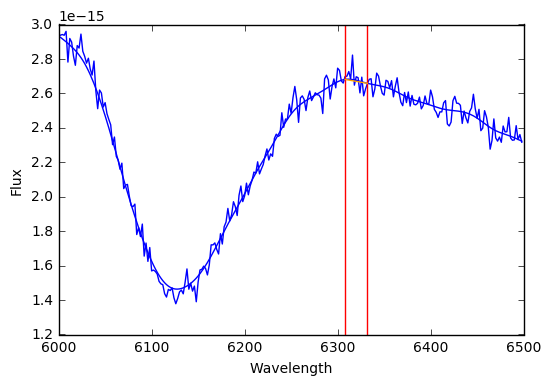

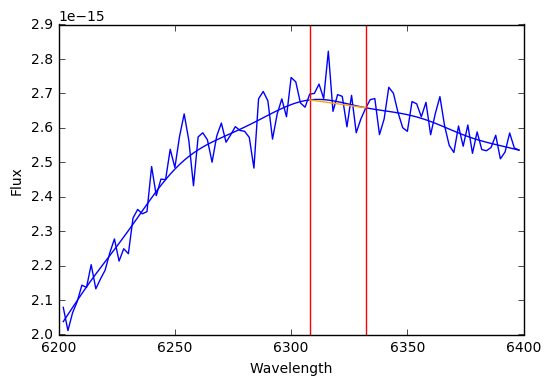

-0.0885702687697


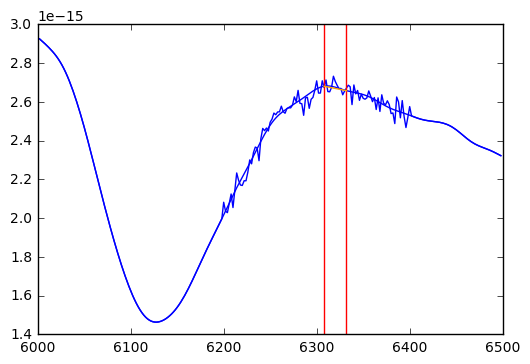

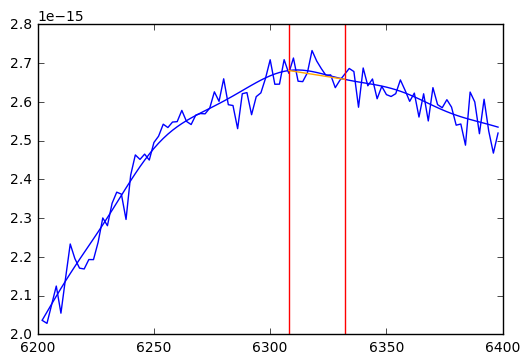

-0.0641386106353


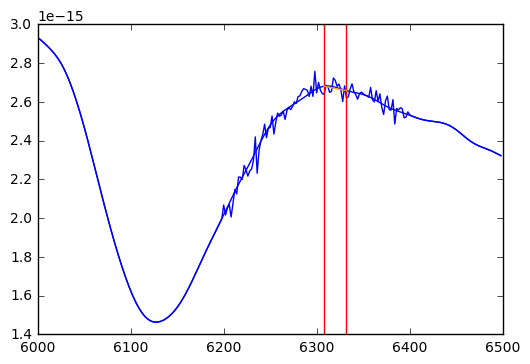

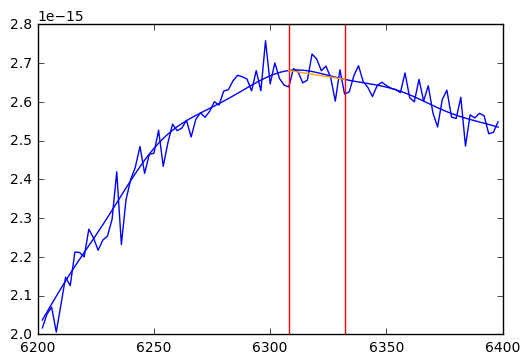

-0.0131891857449


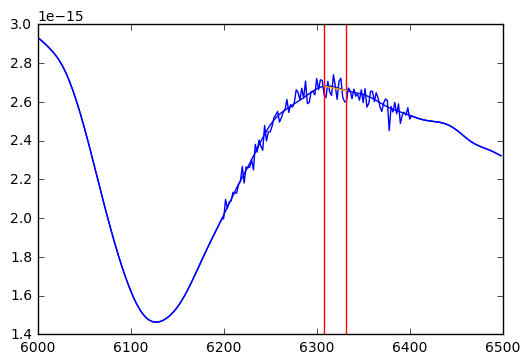

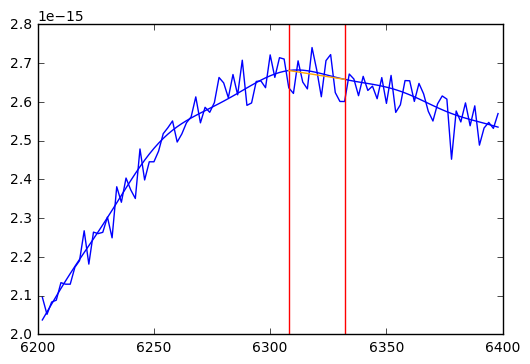

0.085609517065


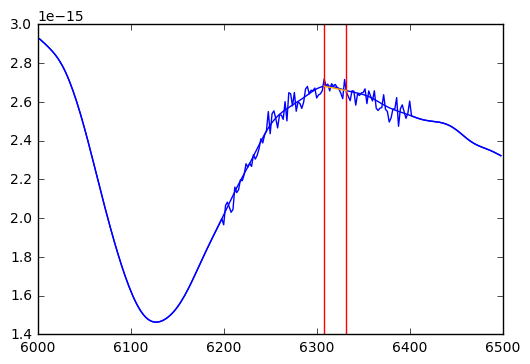

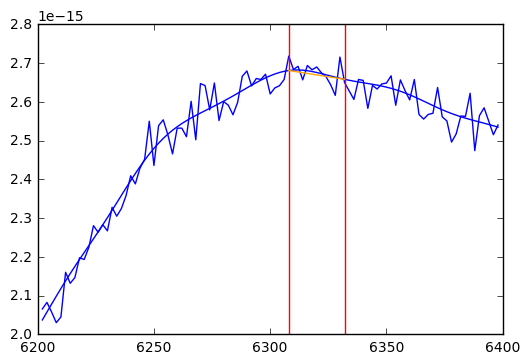

-0.0487054266599


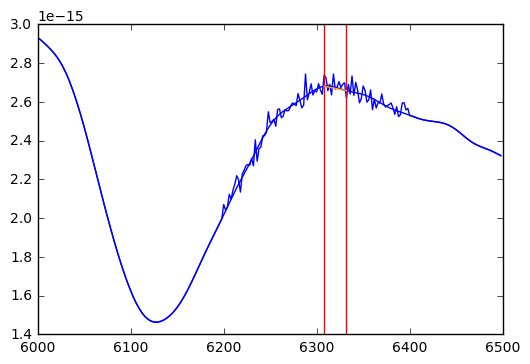

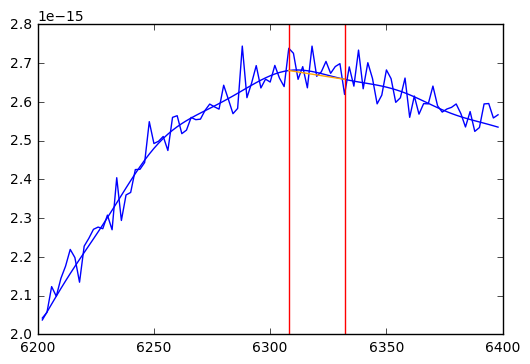

-0.157322392713


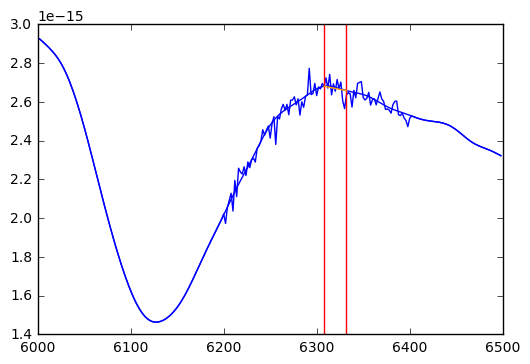

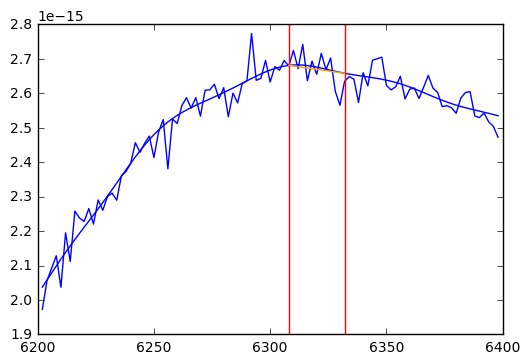

-0.00128843497137


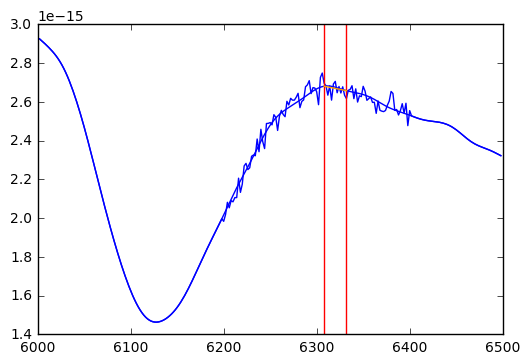

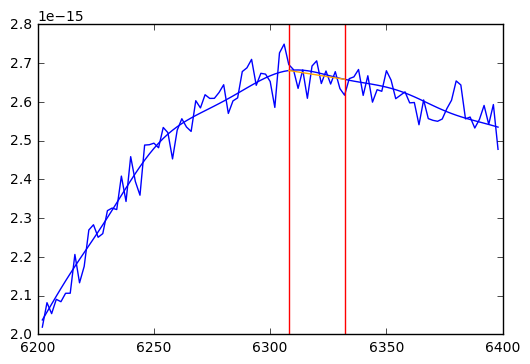

0.0632835649986


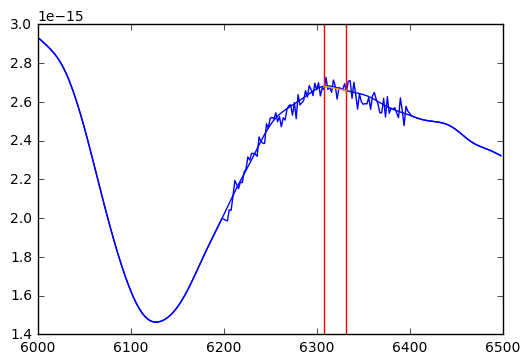

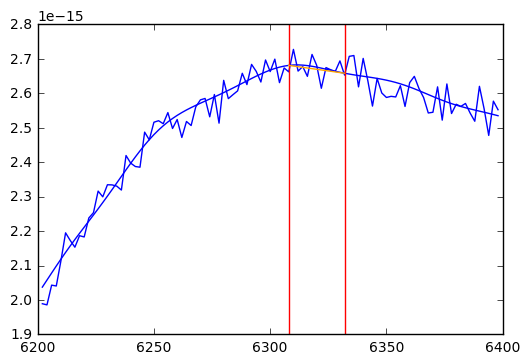

-0.0373645690815


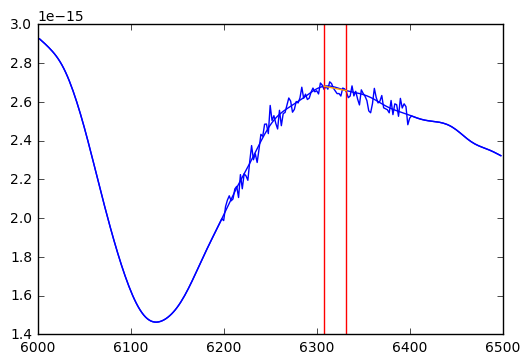

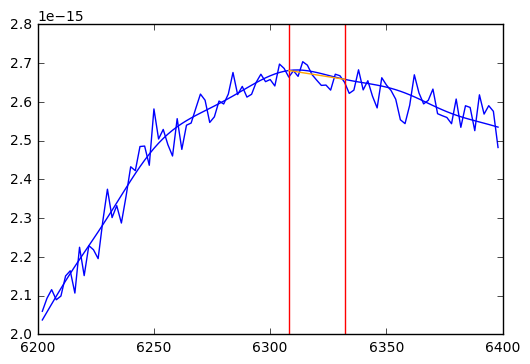

0.0388406122204


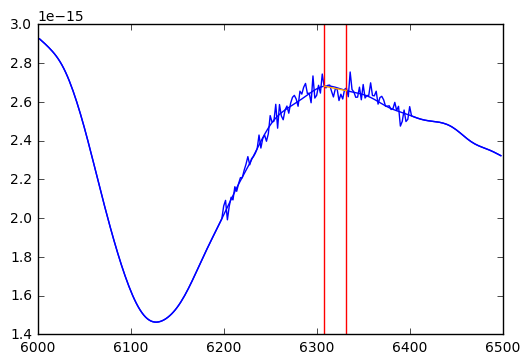

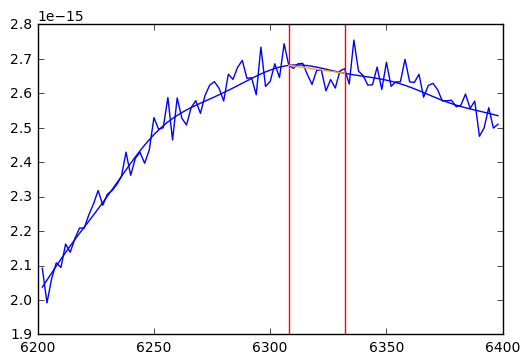

0.130153205364


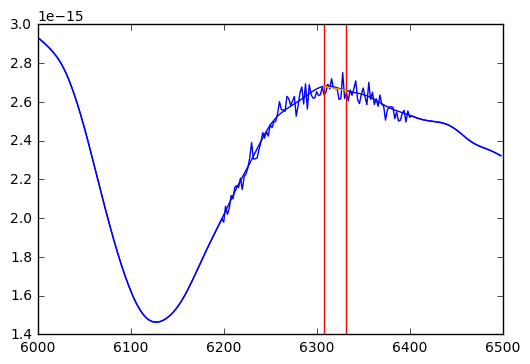

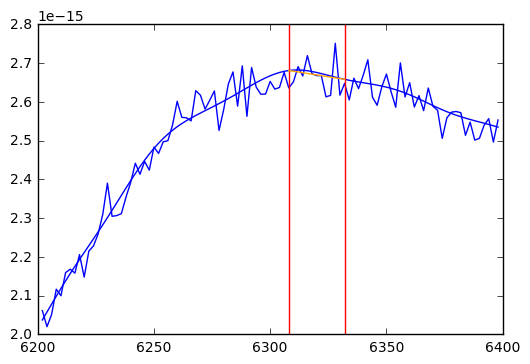

0.0432807879346


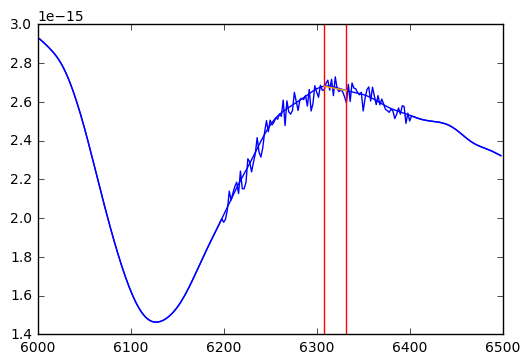

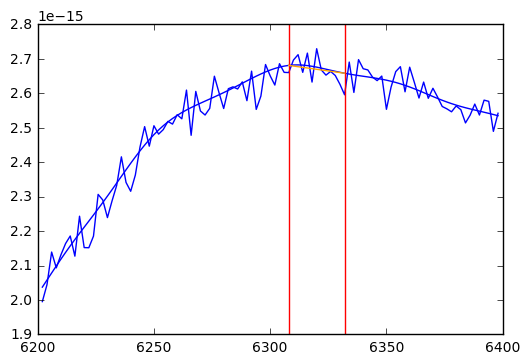

-0.00131767155596


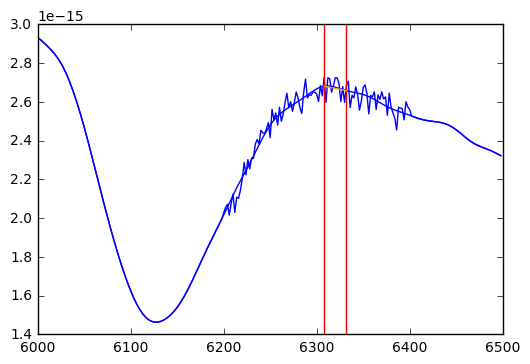

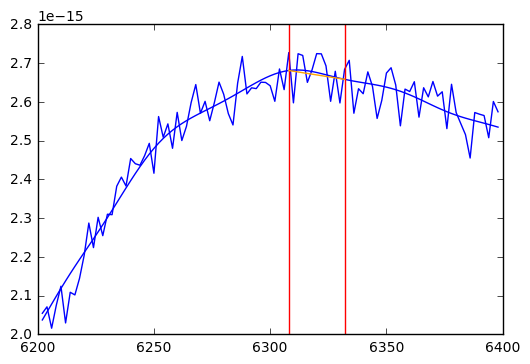

-0.047728187708


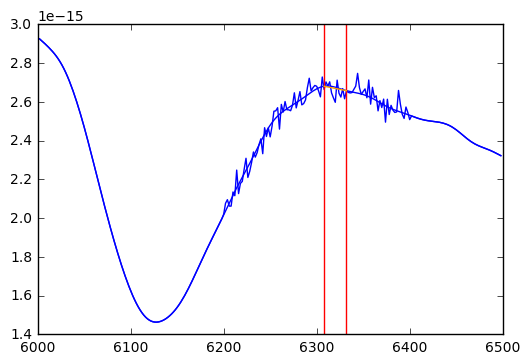

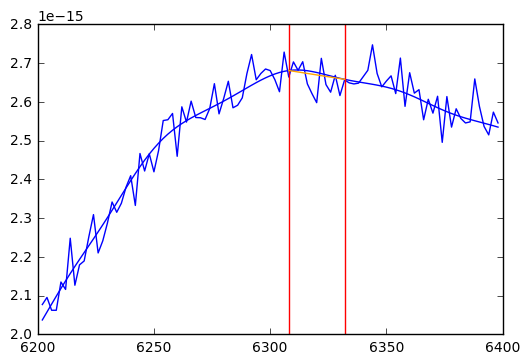

0.115685699093


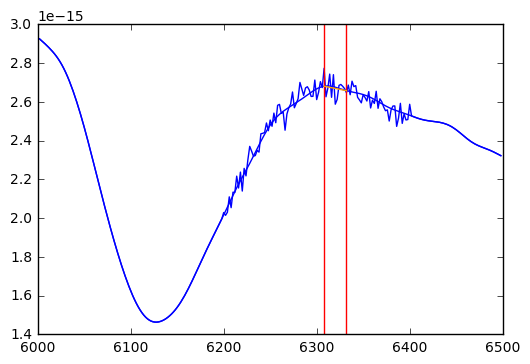

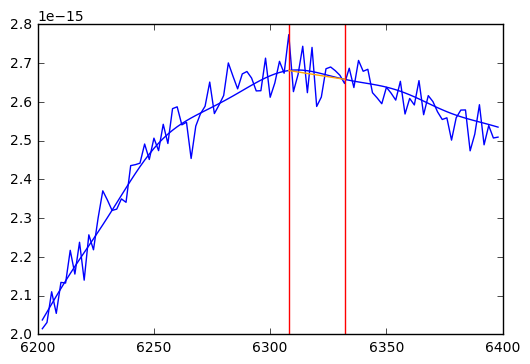

-0.00442778420501
0.0727832147867


In [20]:
a=3

print eq_width(New_SN_Array[a],6200,6300,6400, plot=True) 

print ew_error(New_SN_Array[a], 15, plot=True)

In [21]:
print eq_width(New_SN_Array[a],6200,6300,6400), ew_error(New_SN_Array[a],100)

-0.0885702687697 0.0982242478847


2 1994d A

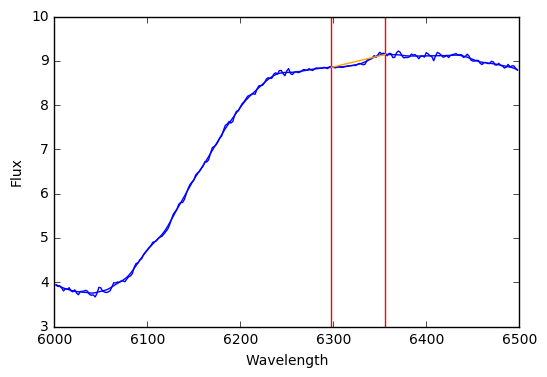

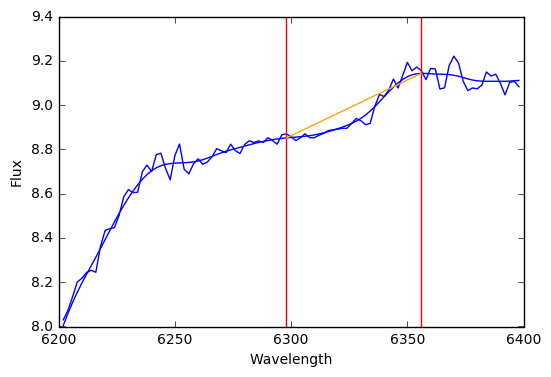

 0.220862651182
14 1998dm A

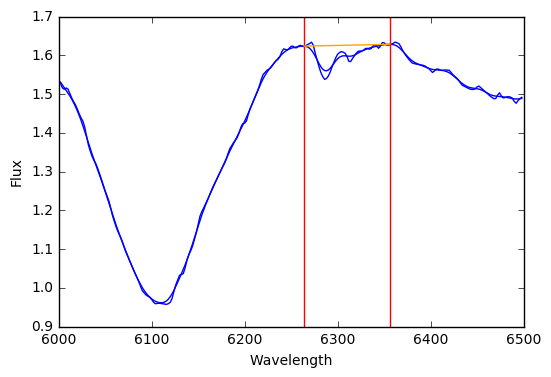

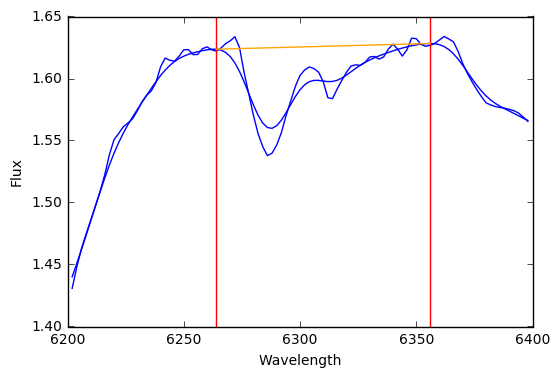

 1.35235711916
38 2002cr A

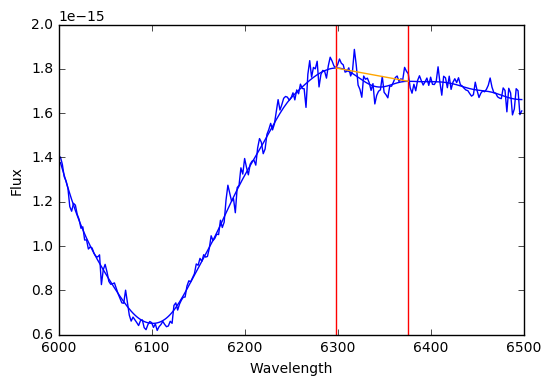

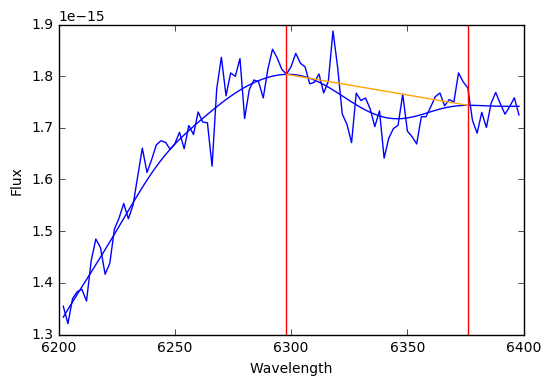

 0.892994485528
46 2002hw A

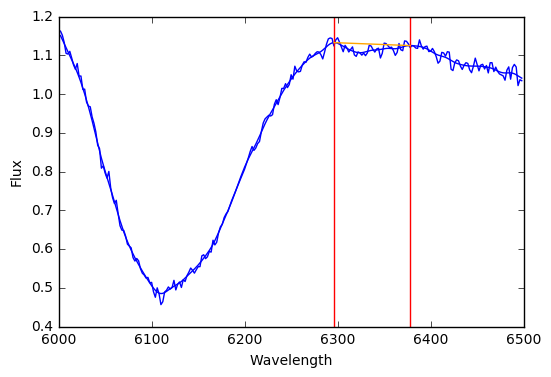

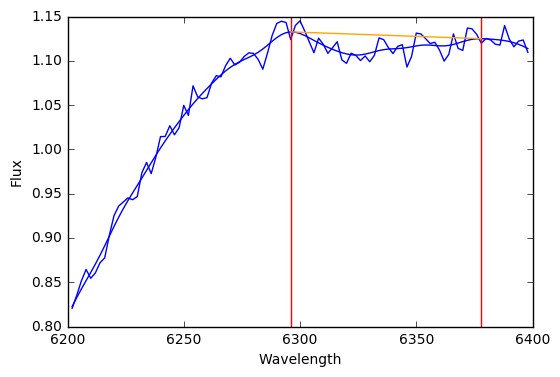

 0.862371345229
50 2003kf A

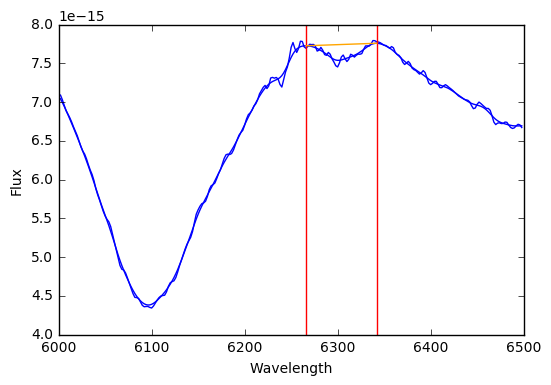

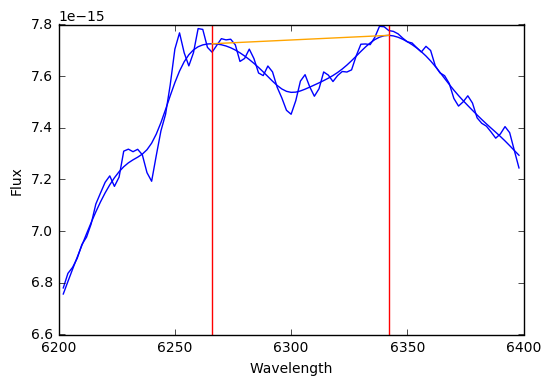

 0.995306569744
57 2004ey A

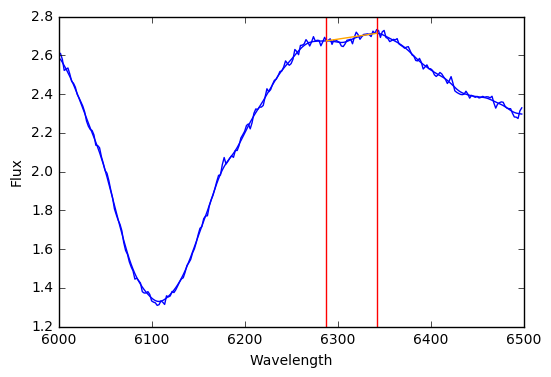

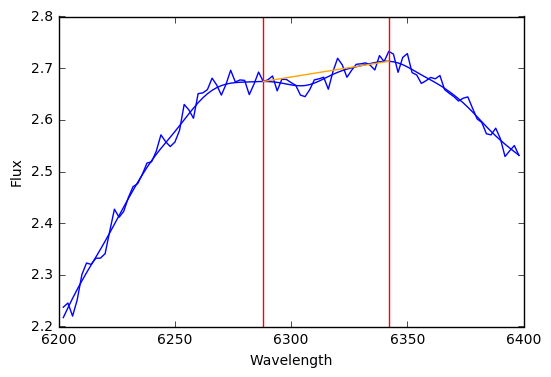

 0.151075944435
64 2005cf A

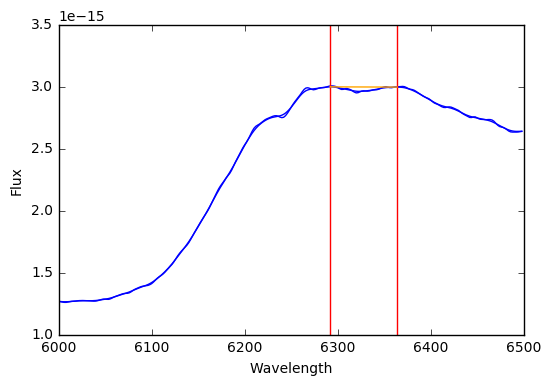

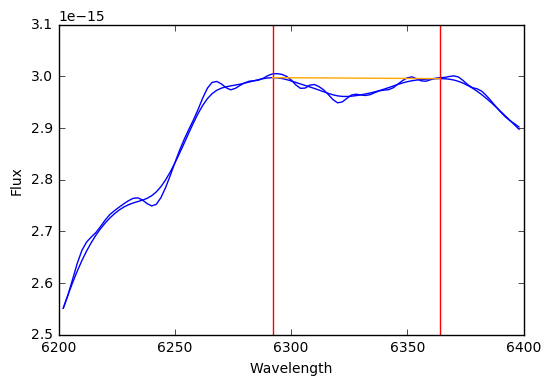

 0.407051902723
65 2005el A

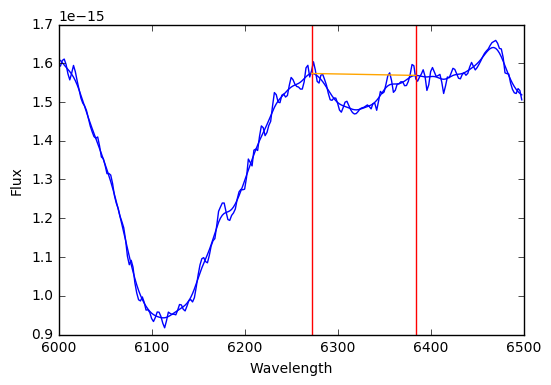

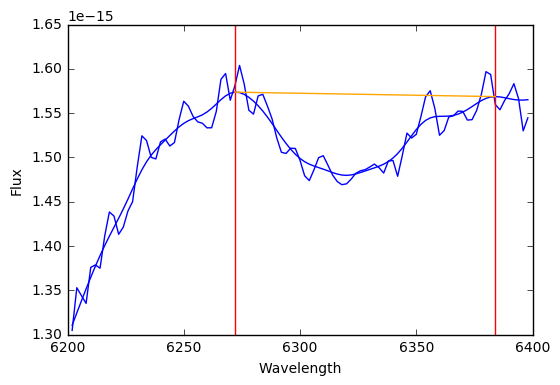

 3.41634713084
67 2005eu A

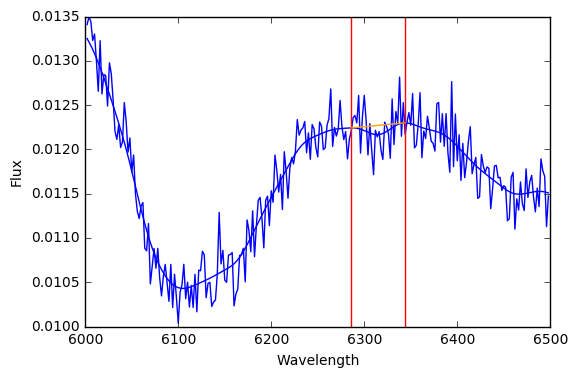

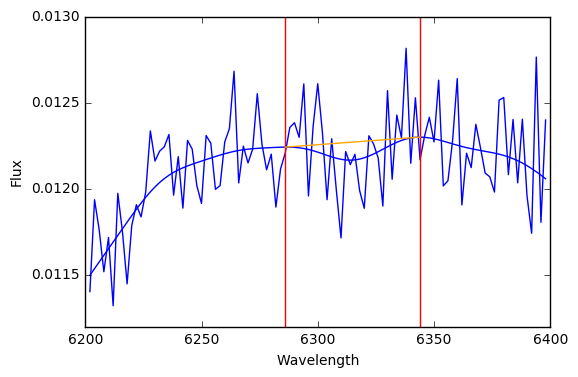

 0.148582880678
69 2005iq A

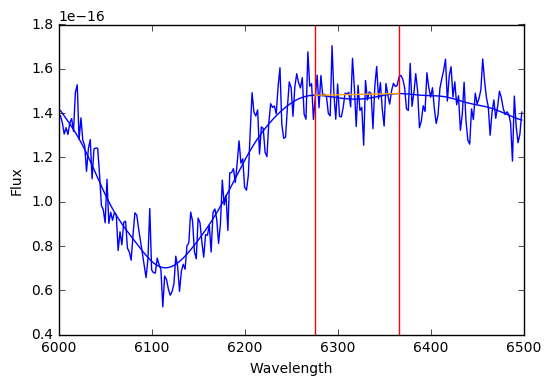

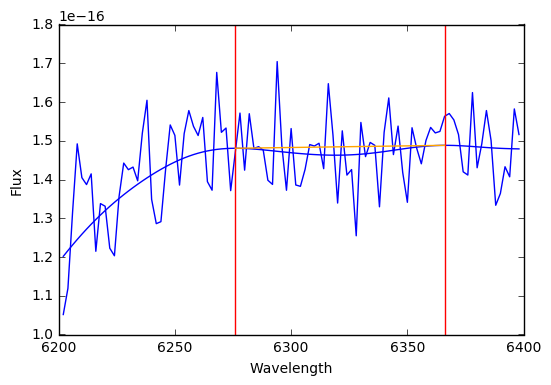

 0.58494661732
71 2005ki A

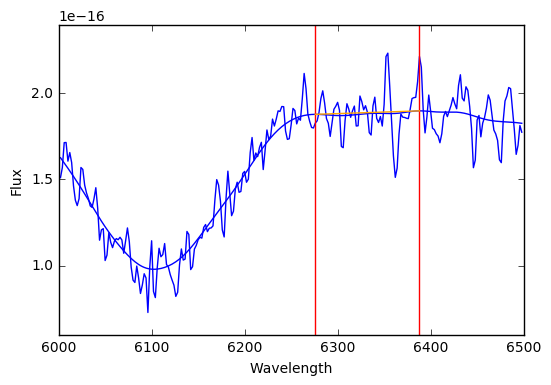

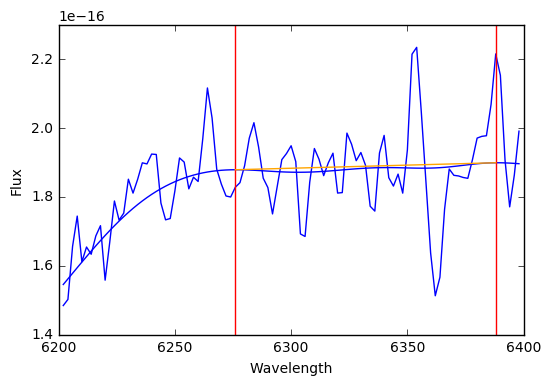

 0.357222875262
82 2006d A

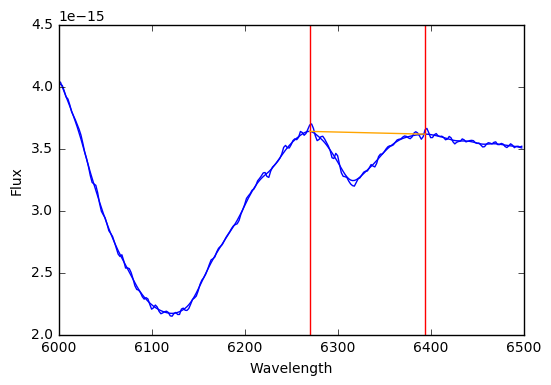

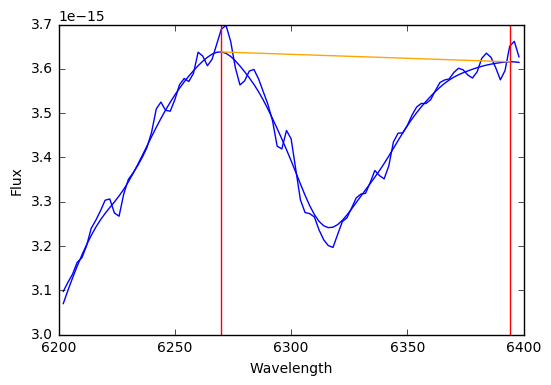

 5.53379396966
98 2007bm A

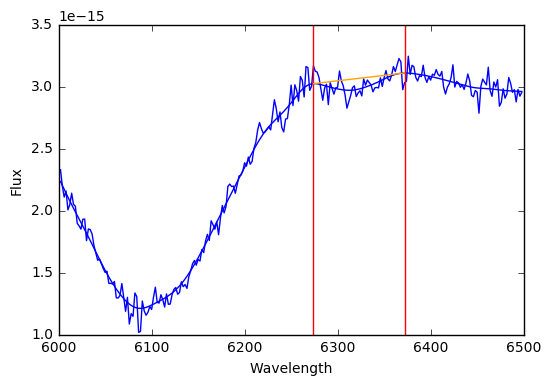

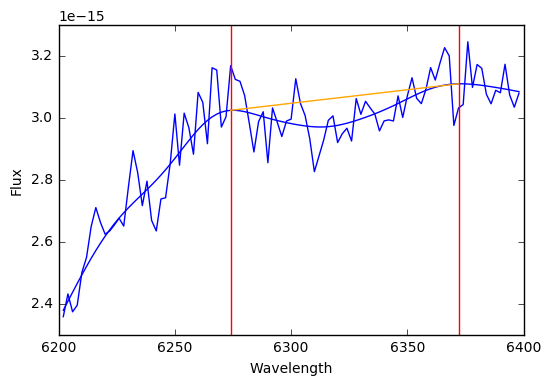

 1.46870708823
103 2007cq A

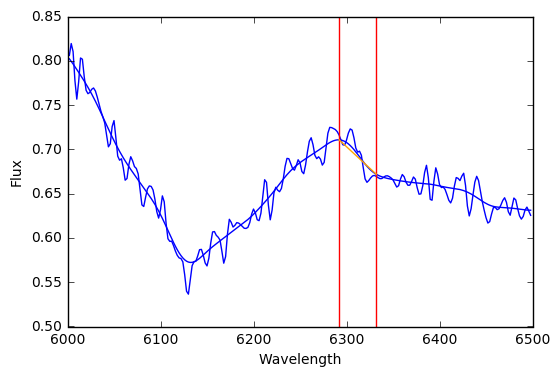

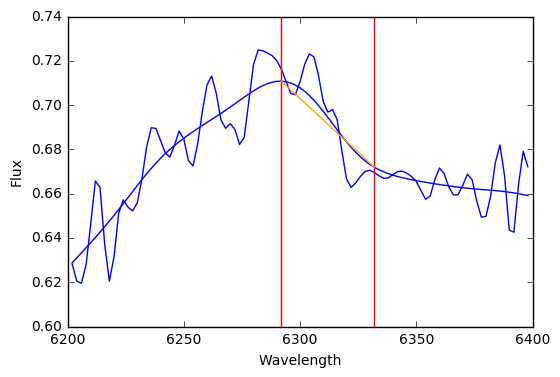

 -0.124337610582
104 2007f A

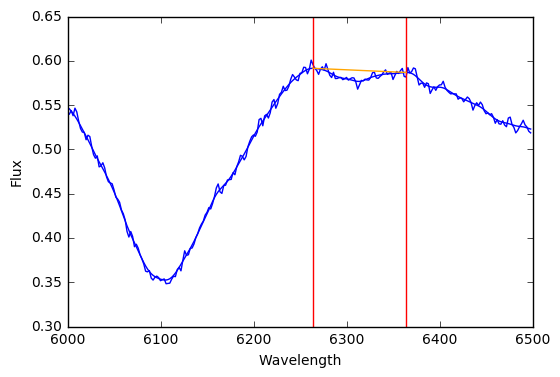

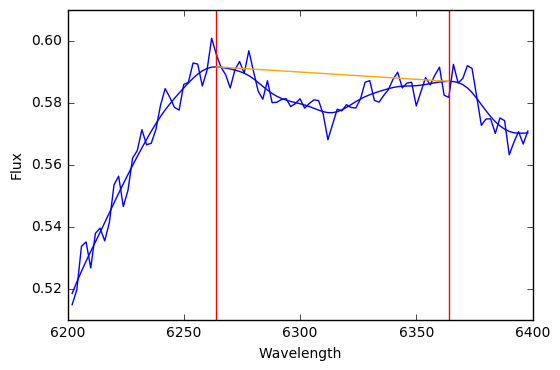

 0.979403580436
110 2008bf A

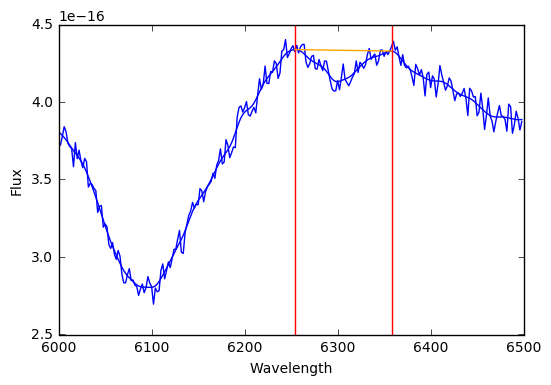

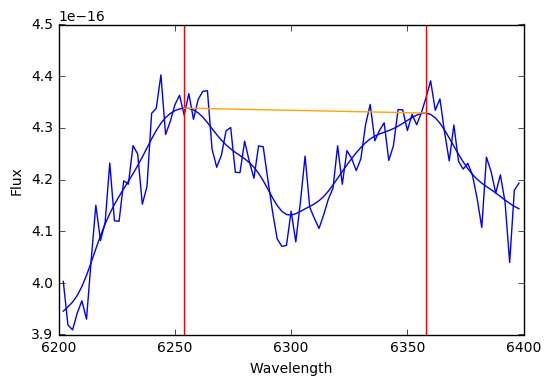

 2.22232363848
122 2008fp A

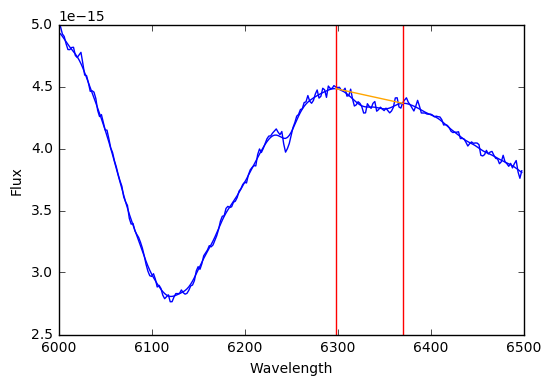

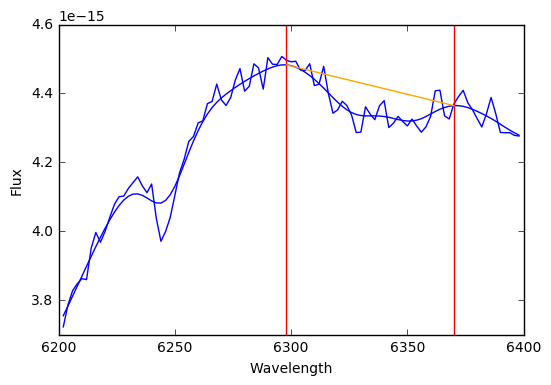

 0.891109102143
1 1991t F

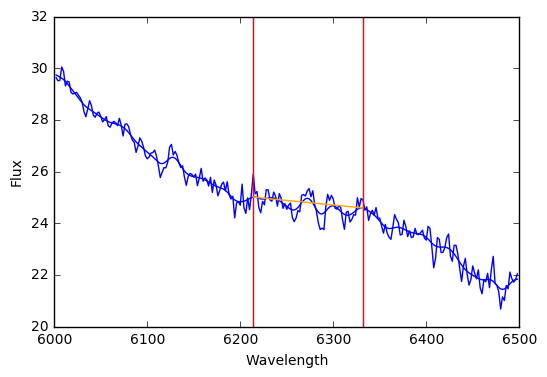

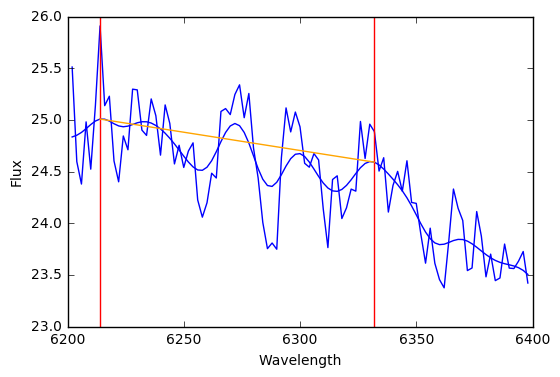

 0.558816847604
4 1995e F

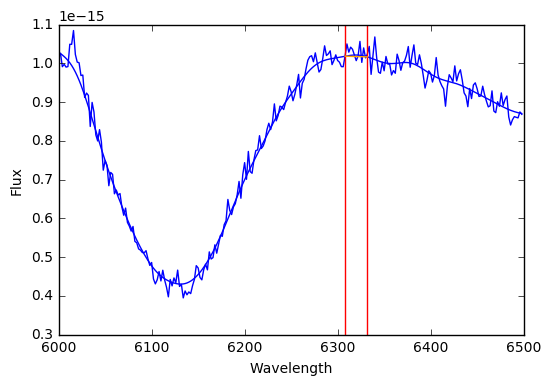

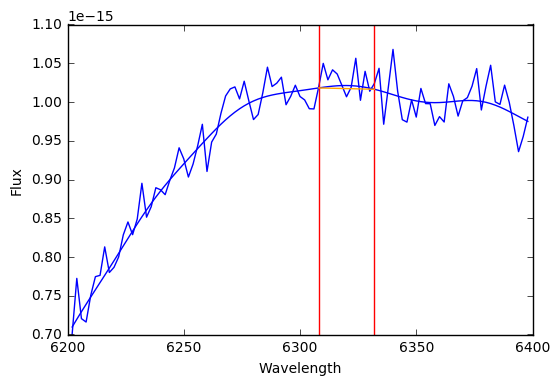

 -0.254345529203
8 1998aq F

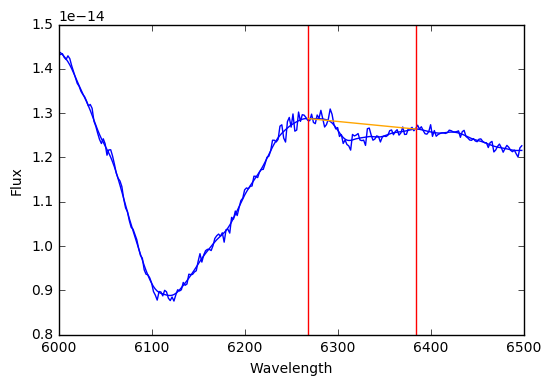

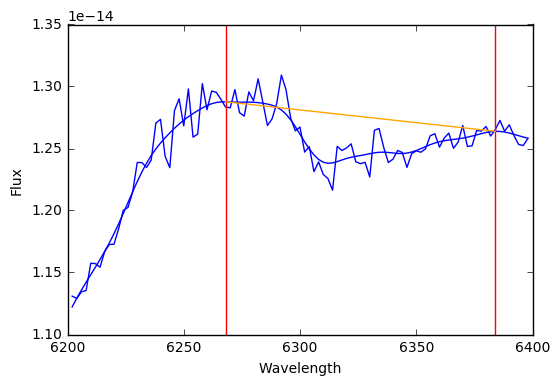

 1.51816918444
10 1998bu F

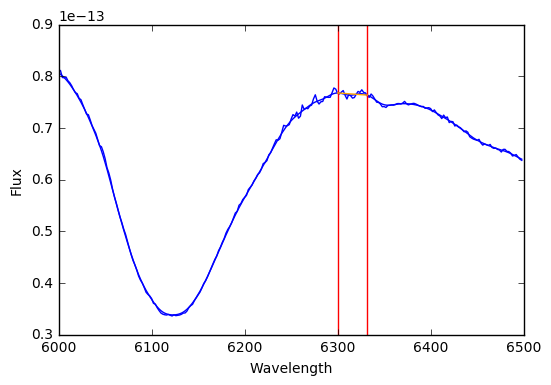

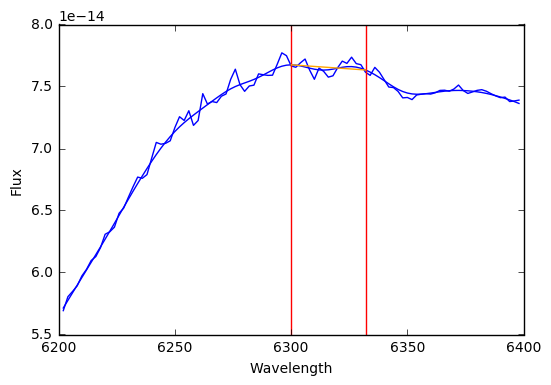

 -0.00119556992096
13 1998dk F

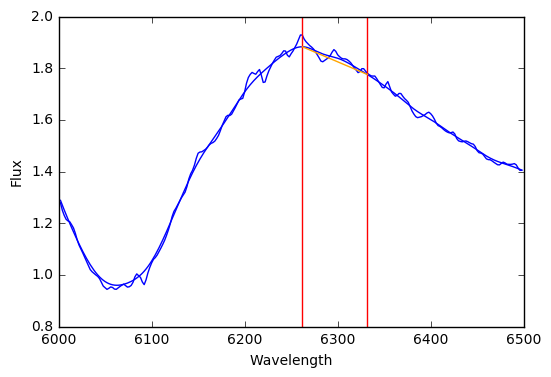

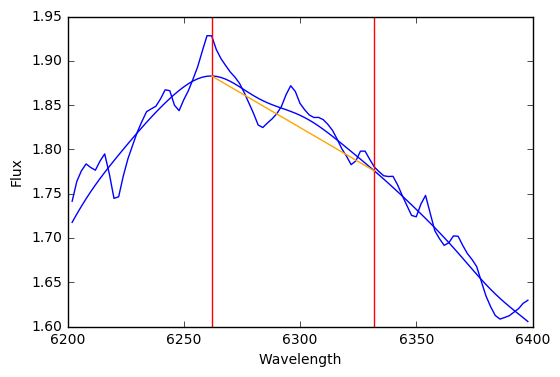

 -0.430663438955
19 1999ac F

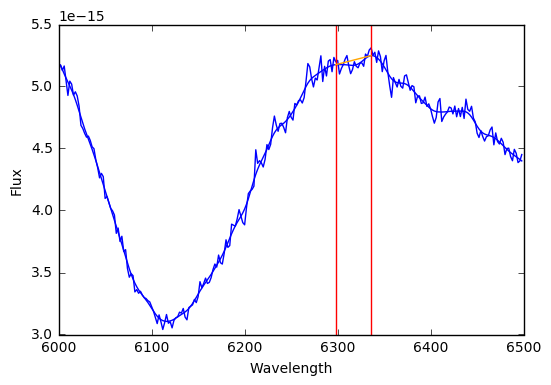

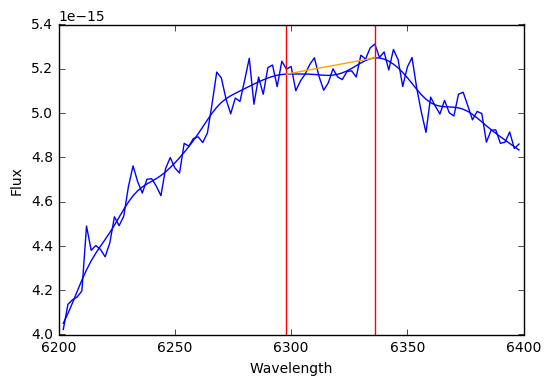

 0.162862586817
20 1999by F

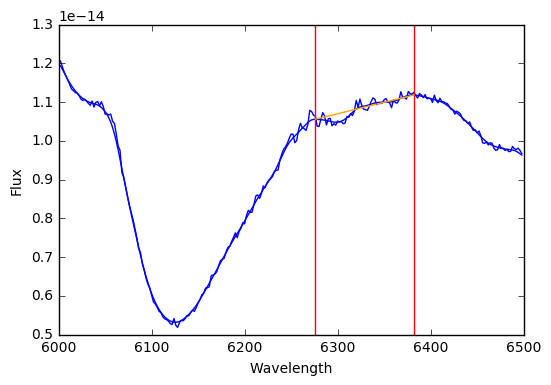

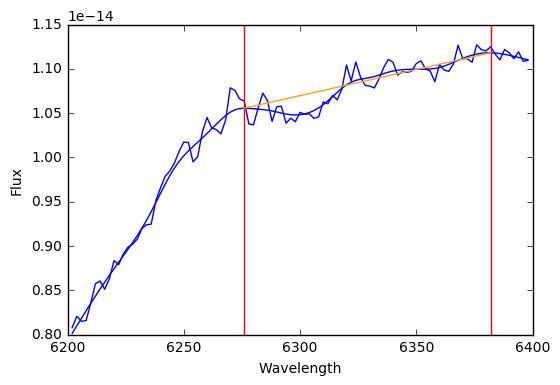

 0.447708005272
23 1999dk F

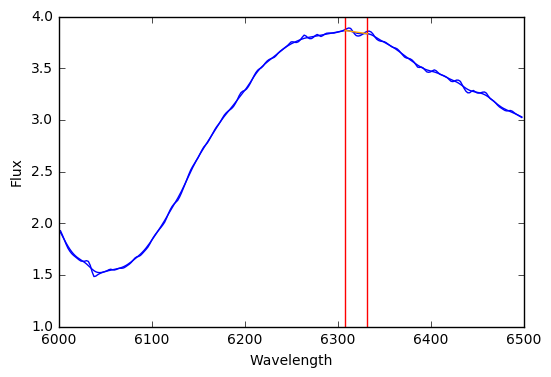

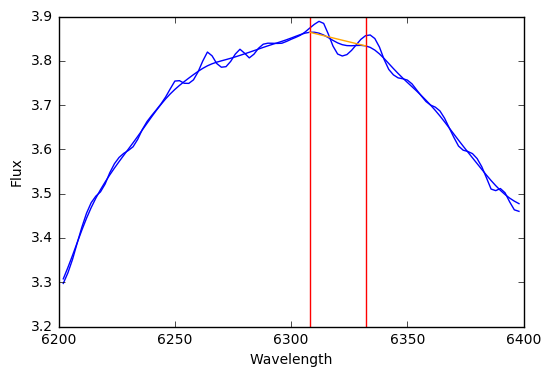

 0.013665547195
27 2001az F

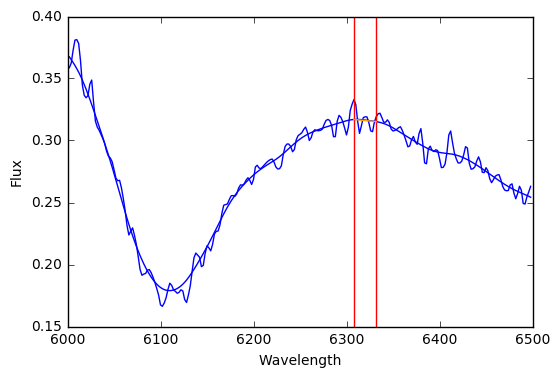

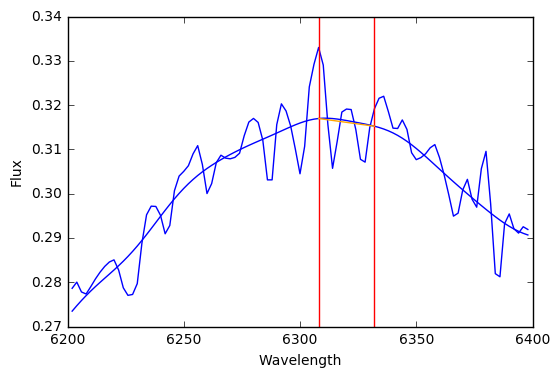

 0.0268348478849
29 2001cp F

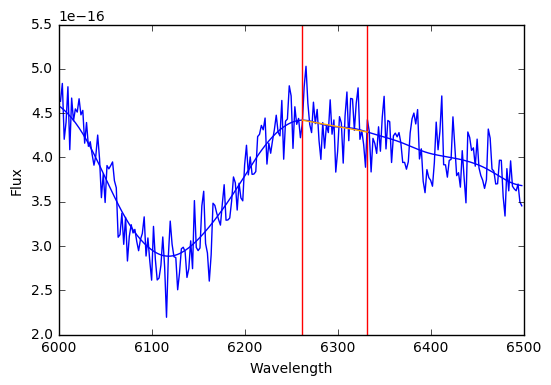

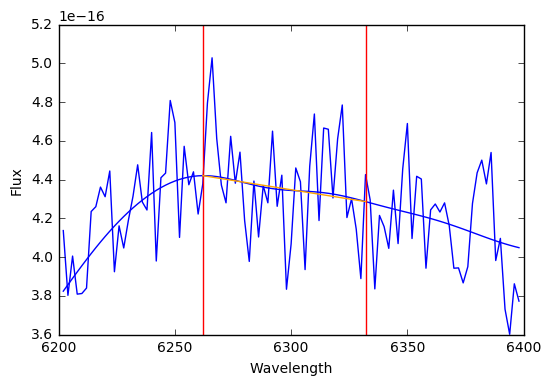

 -0.437701095877
33 2001fe F

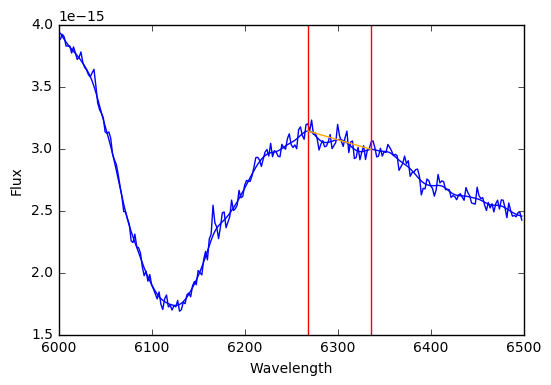

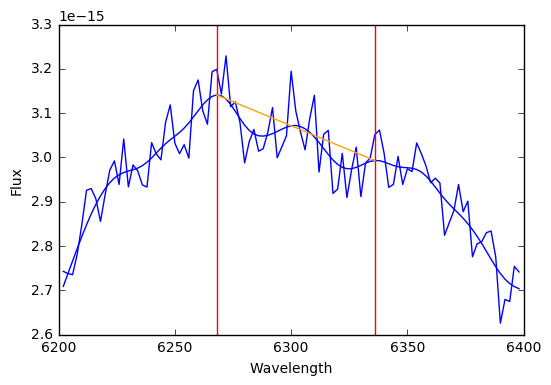

 0.496736051495
34 2001v F

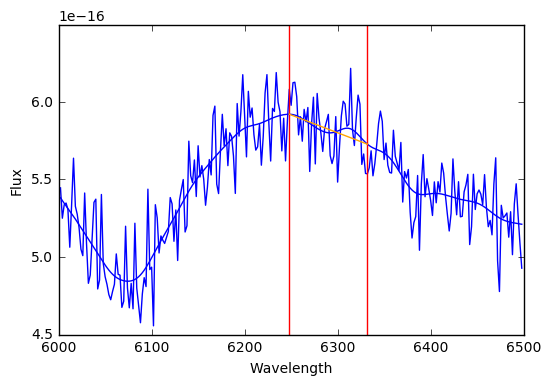

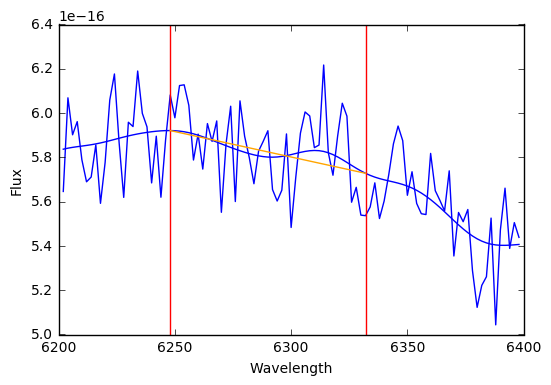

 -0.295913958937
37 2002ck F

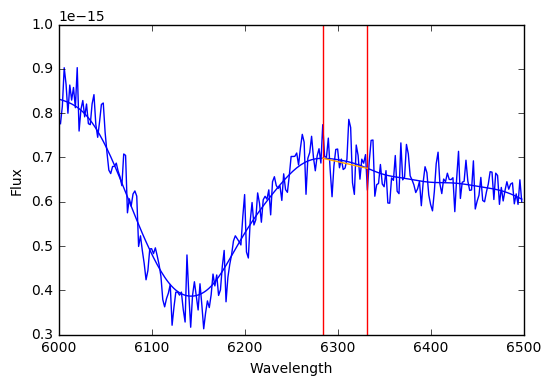

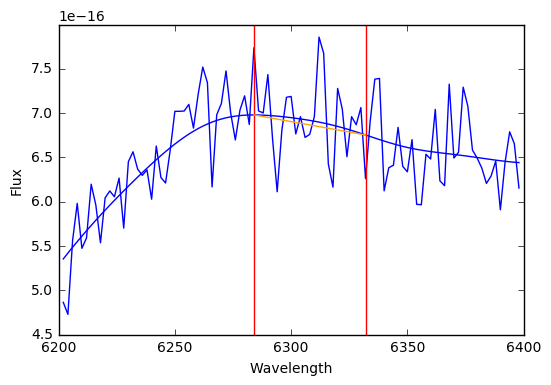

 -0.489942645045
40 2002er F

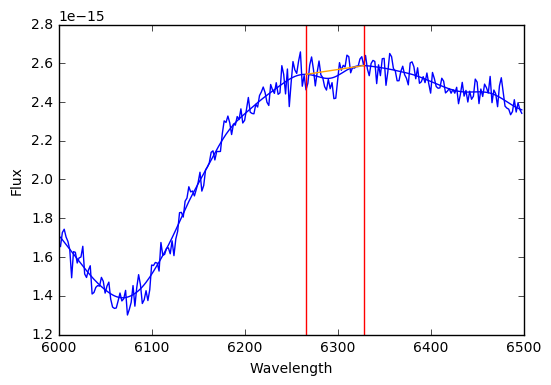

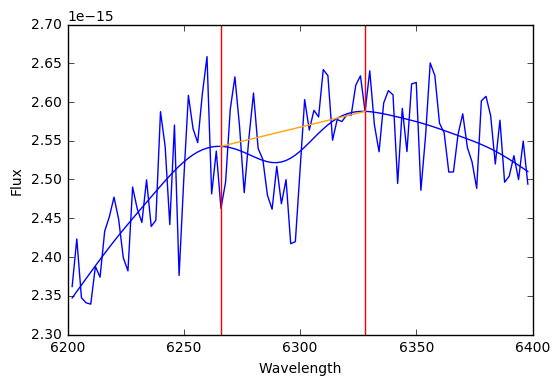

 0.381816179469
48 2003du F

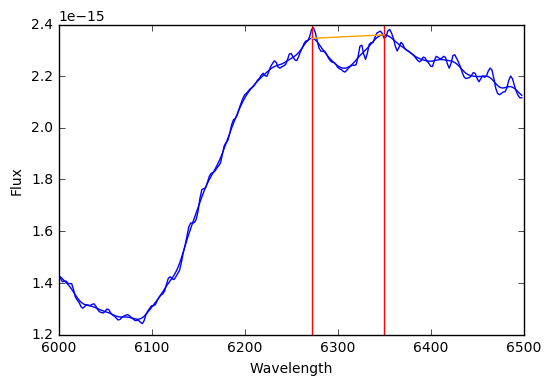

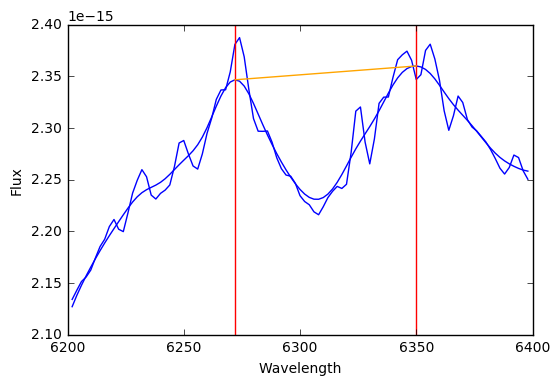

 2.0717242337
51 2003u F

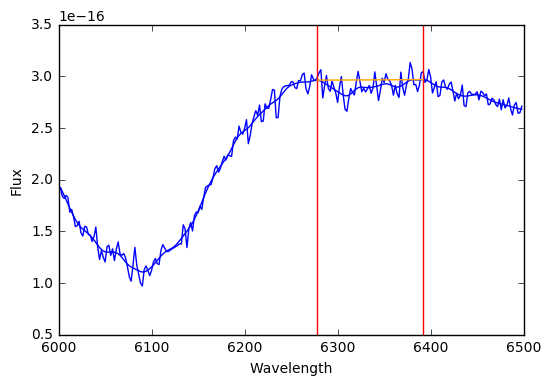

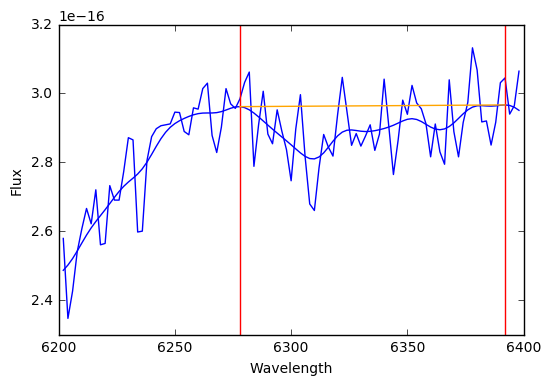

 2.30048140566
62 2005bl F

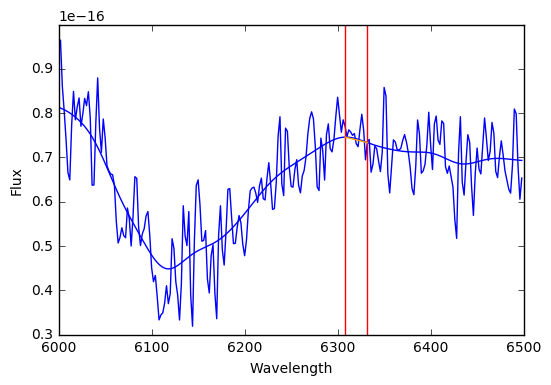

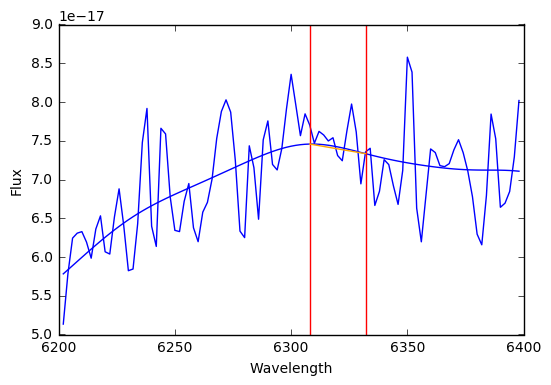

 -0.322403772472
75 2005na F

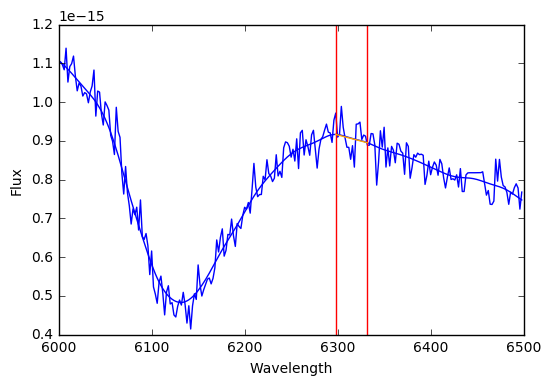

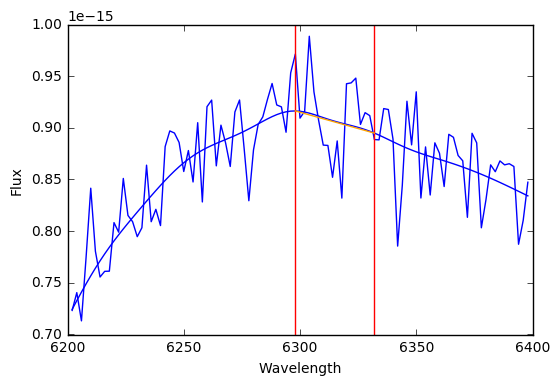

 -0.204082133097
77 2006ax F

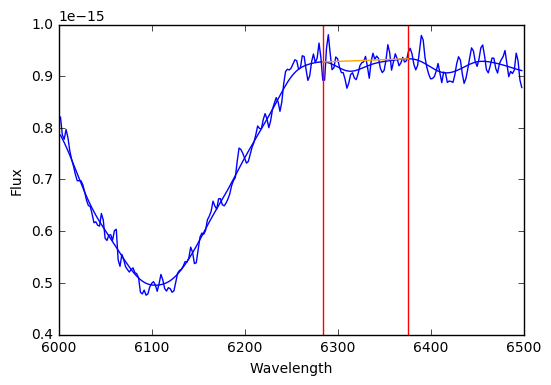

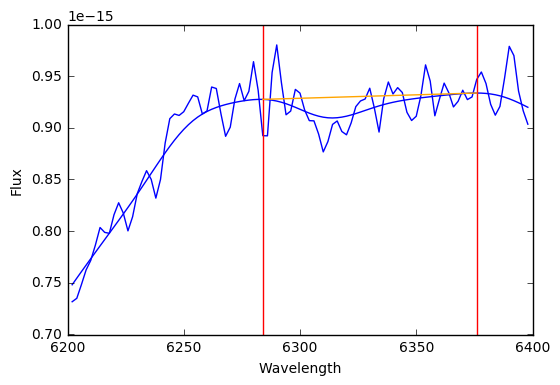

 0.846009770934
78 2006bt F

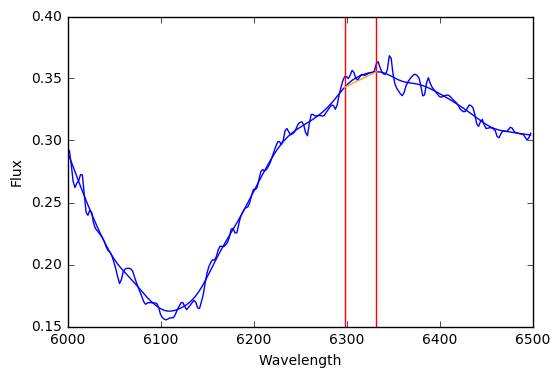

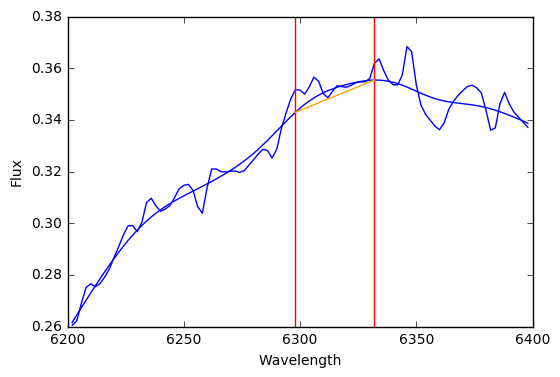

 -0.394704467891
81 2006cs F

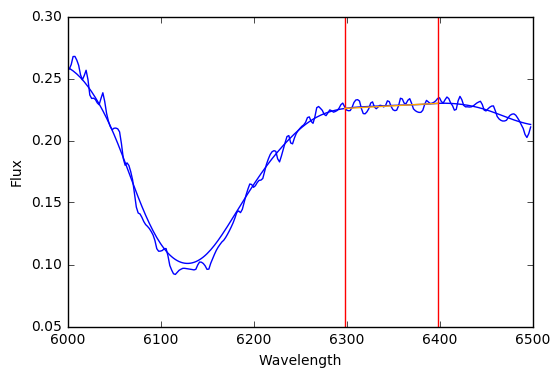

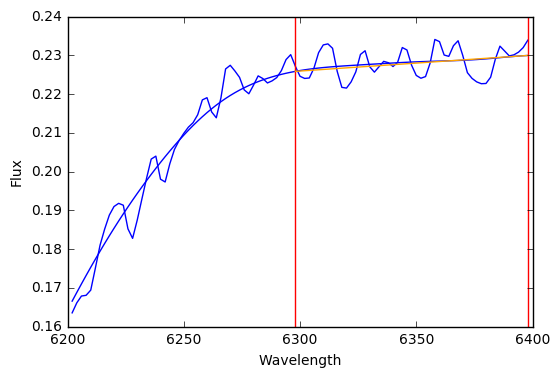

 -0.0649711378026
94 2007a F

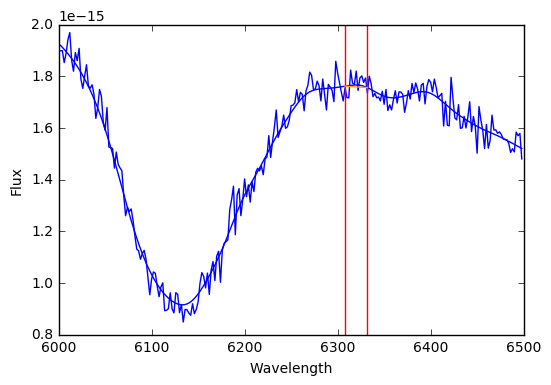

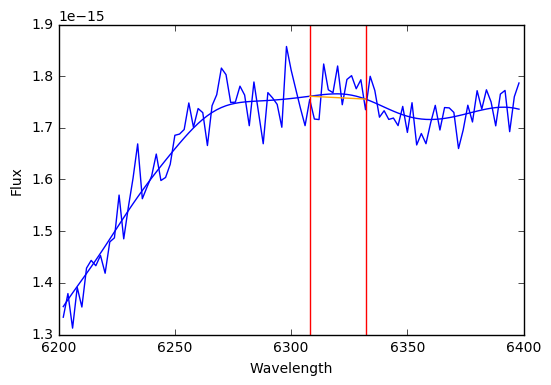

 -0.193713212816
96 2007bc F

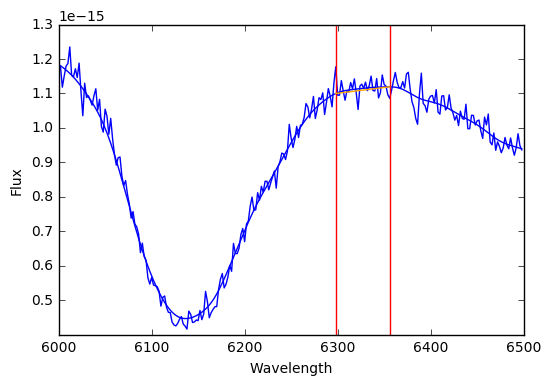

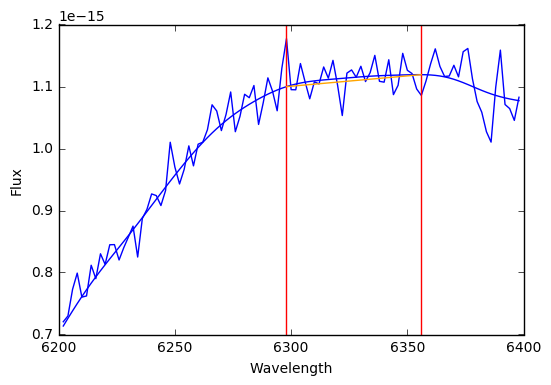

 -0.26409628589
108 2007on F

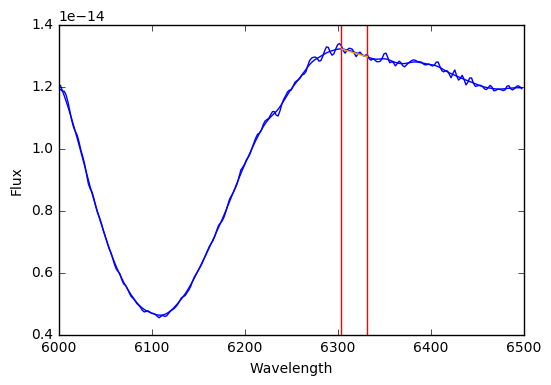

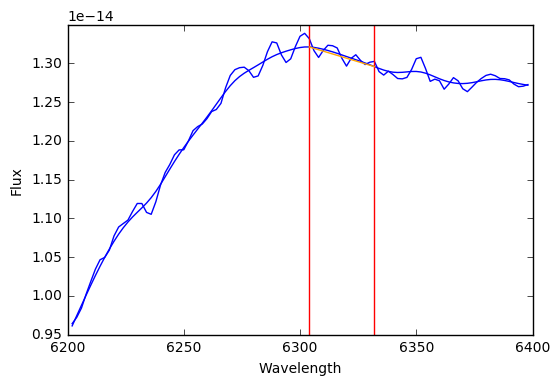

 -0.0450202179963
111 1996x F

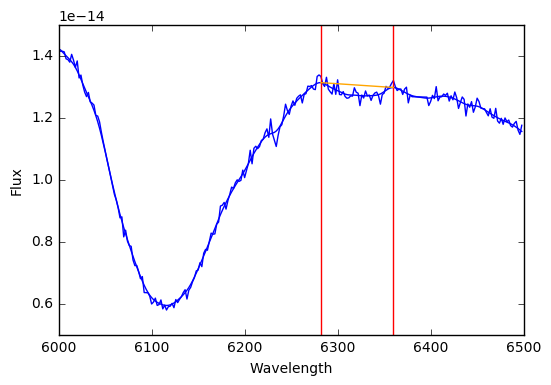

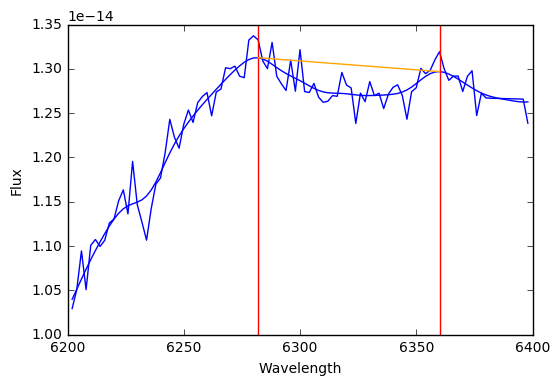

 1.35570150029
116 2003cg F

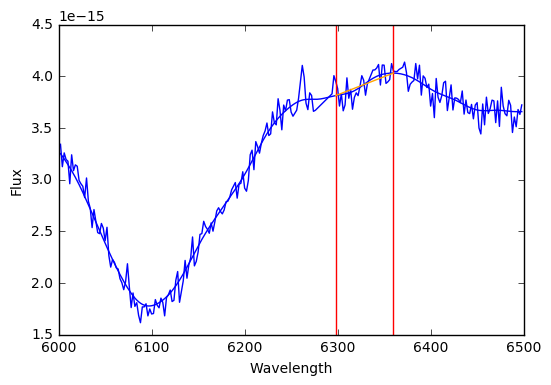

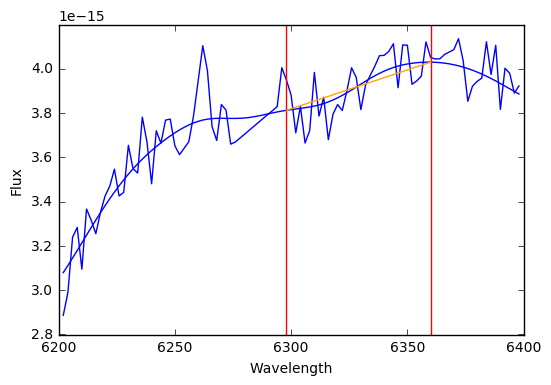

 0.00344636127597
0 1991bg N

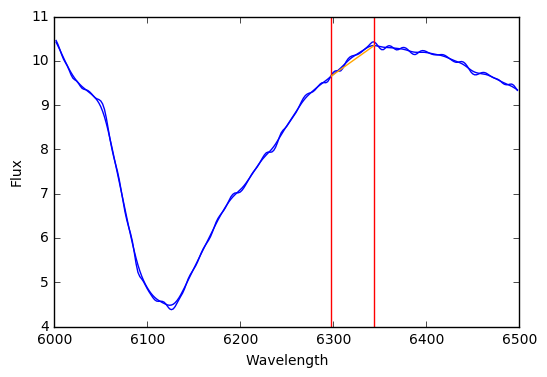

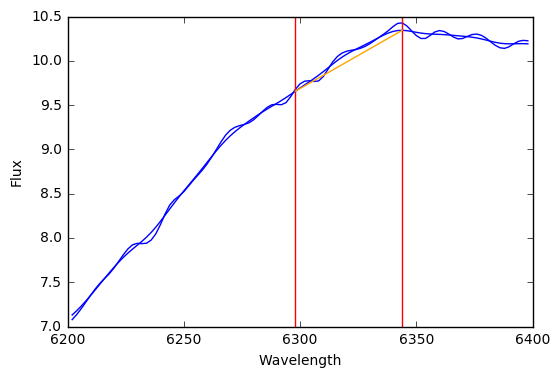

 -0.298984297448
3 1994s N

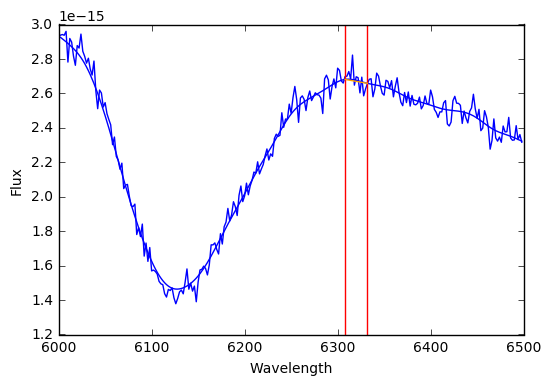

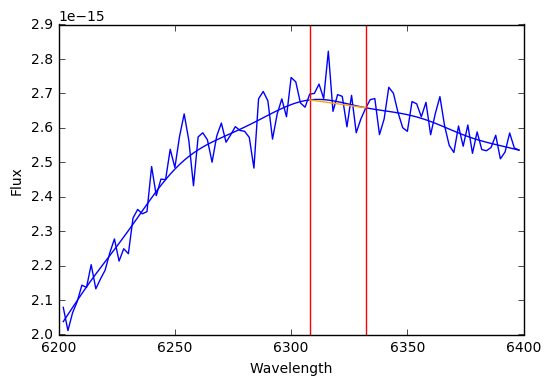

 -0.0885702687697
5 1997br N

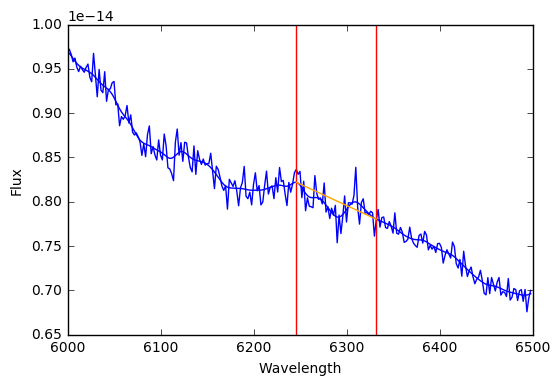

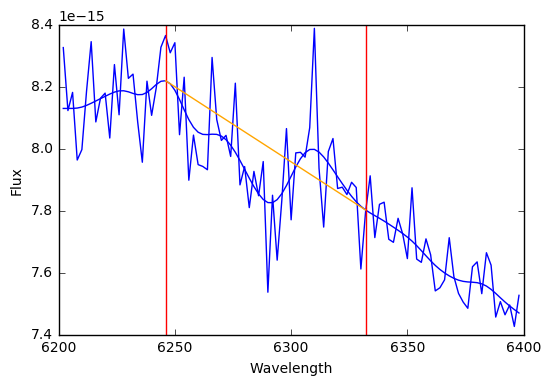

 0.467376428926
6 1997do N

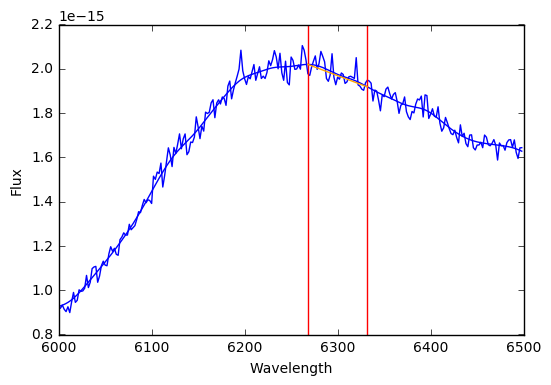

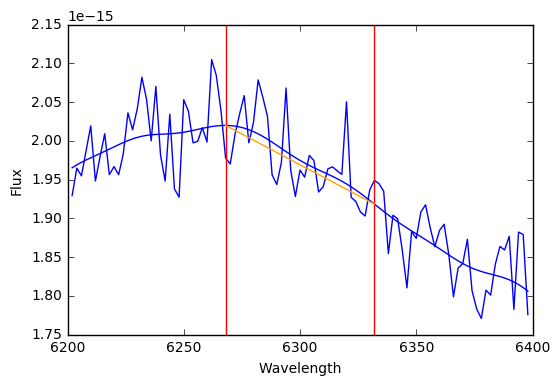

 -0.285730922389
7 1997y N

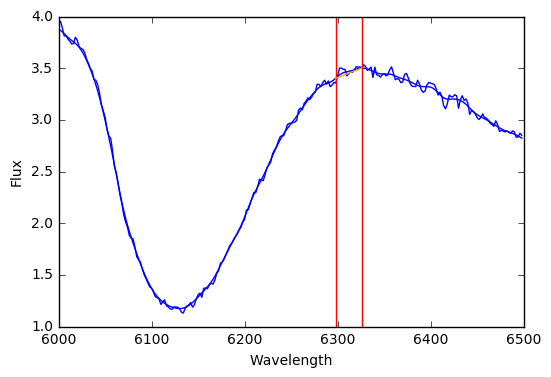

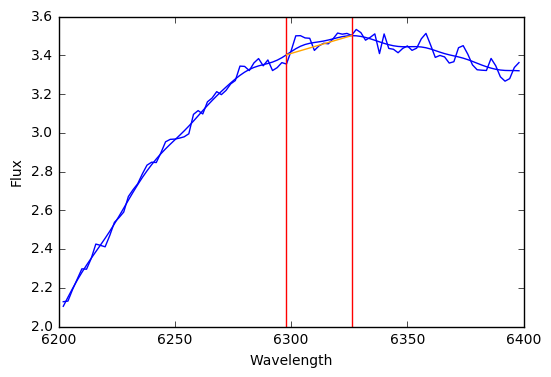

 -0.185798981807
9 1998bp N

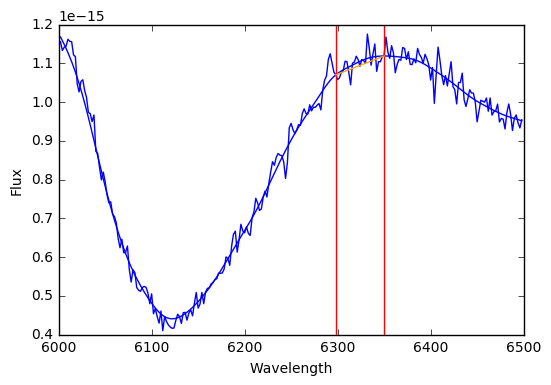

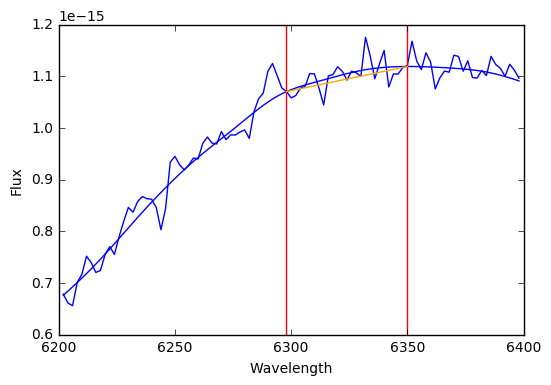

 -0.320113672877
11 1998de N

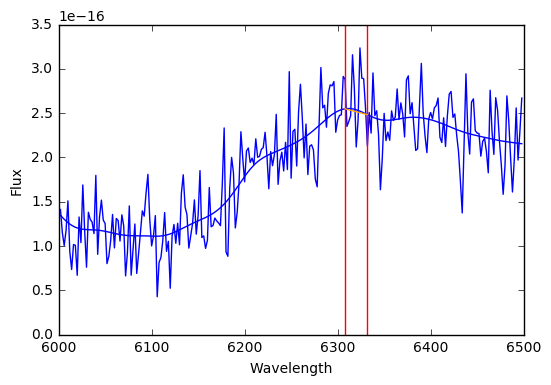

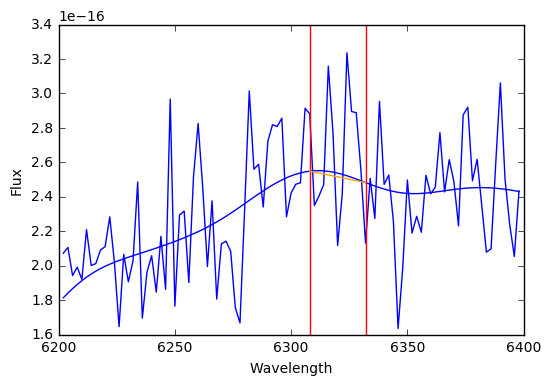

 -1.26631711446
12 1998dh N

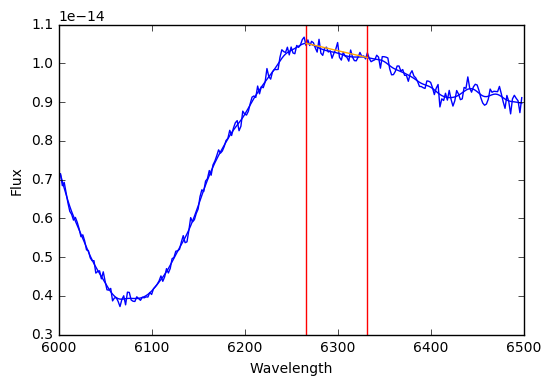

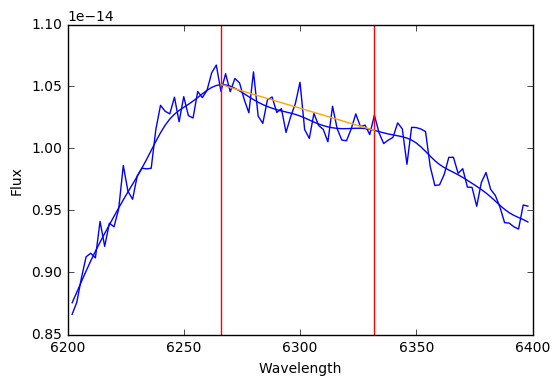

 0.28435931569
15 1998ec N

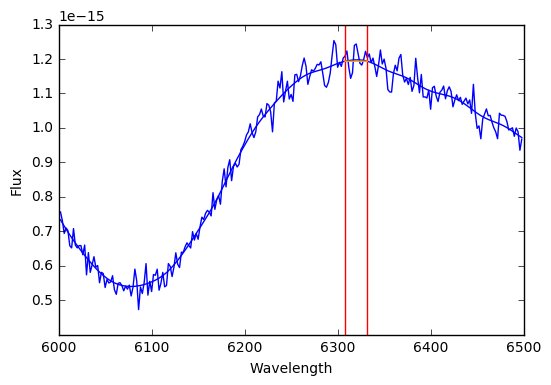

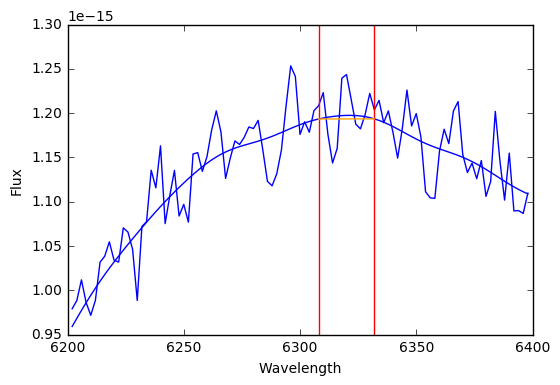

 -0.128606235628
16 1998ef N

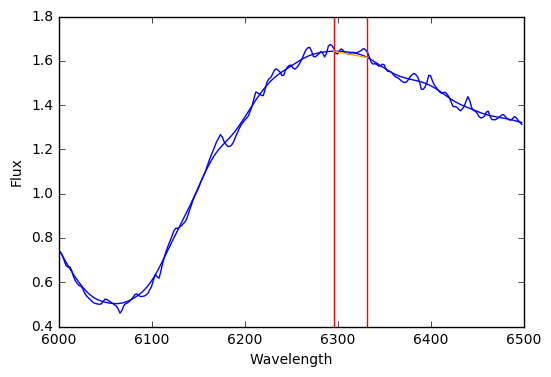

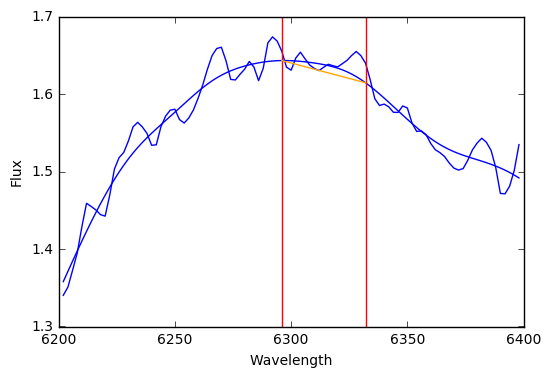

 -0.271706717909
17 1998es N

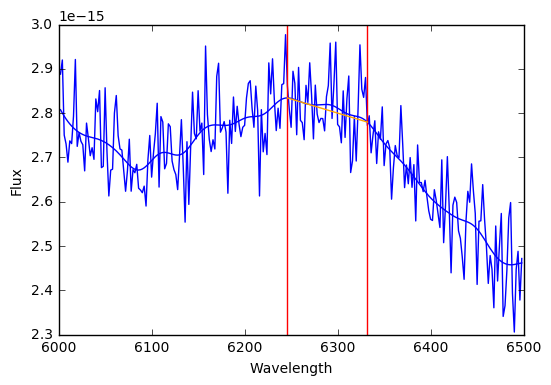

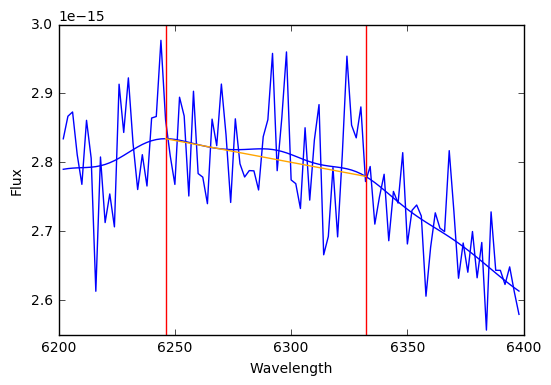

 -0.289658536527
18 1999aa N

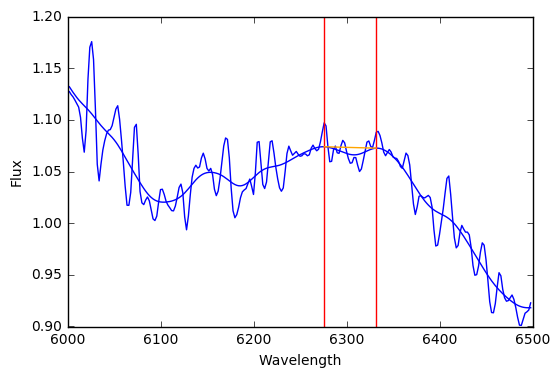

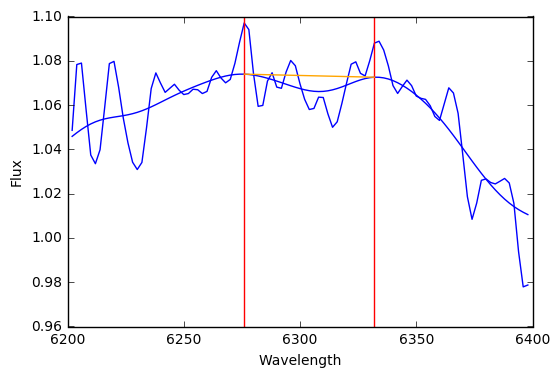

 0.200395195561
21 1999cl N

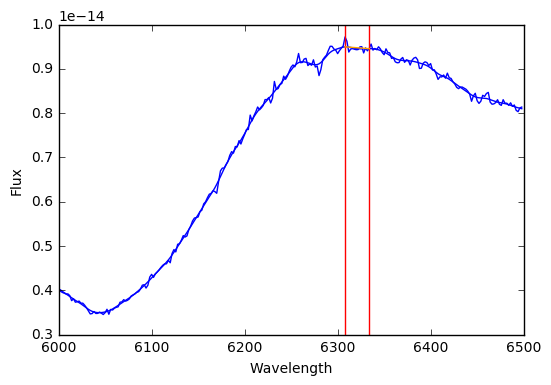

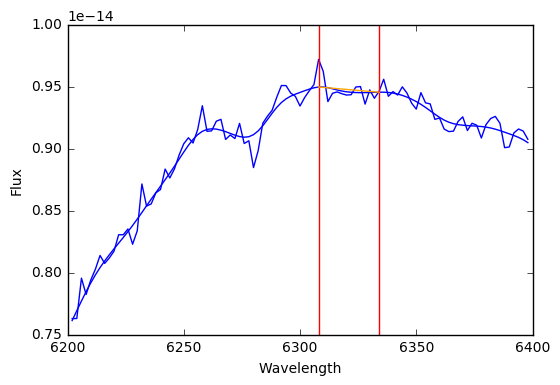

 0.0307451621551
22 1999da N

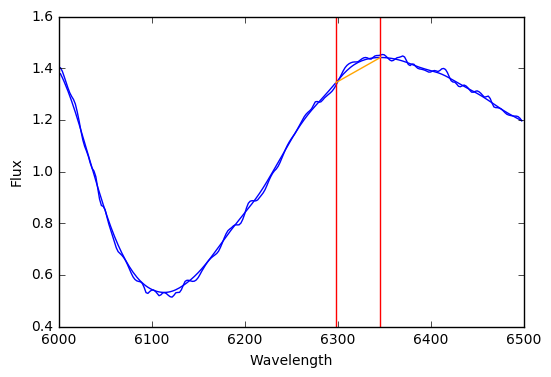

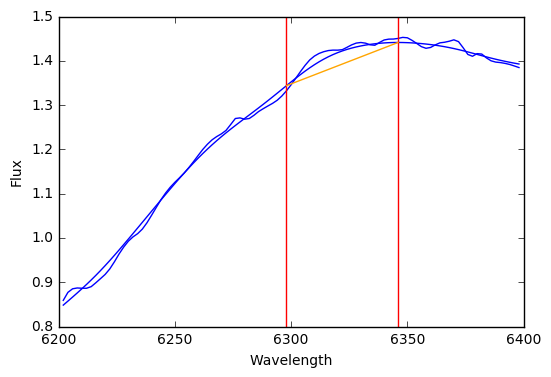

 -0.90808608672
24 1999dq N

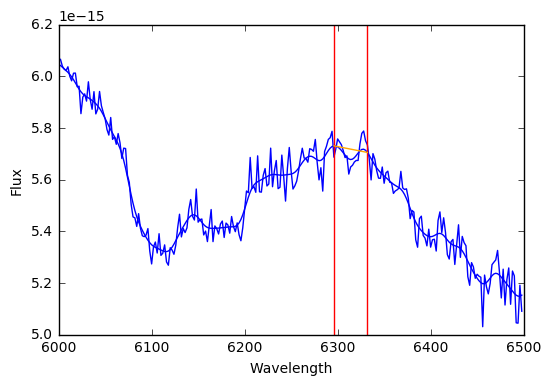

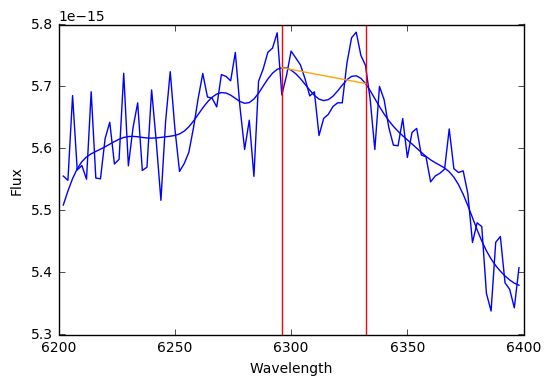

 0.0586153150475
25 1999gd N

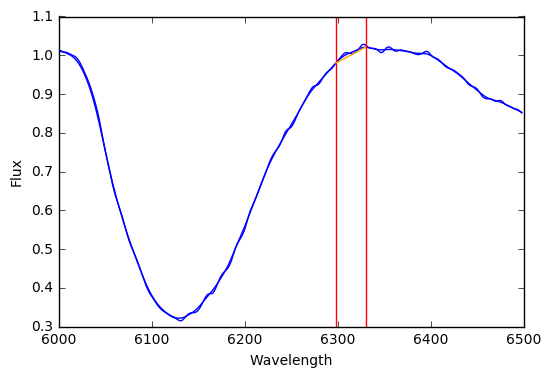

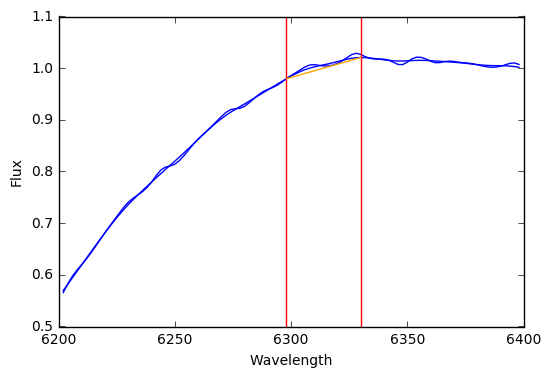

 -0.219167516231
26 2000dk N

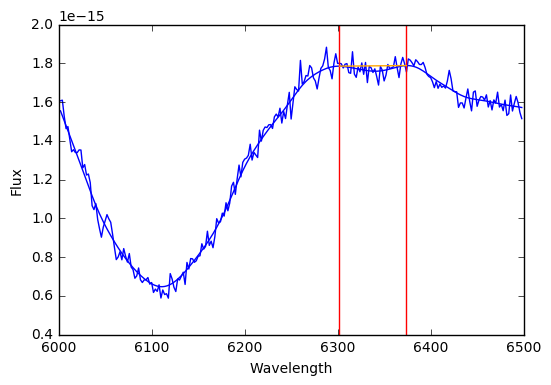

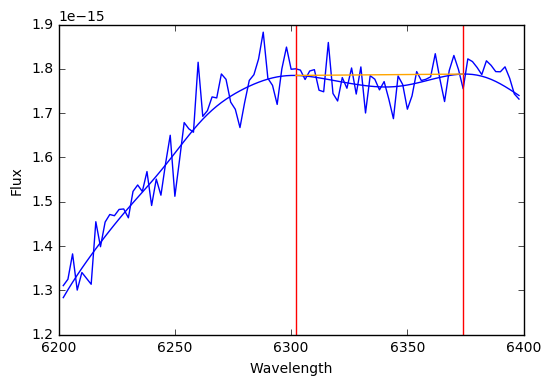

 0.638119795001
28 2001bf N

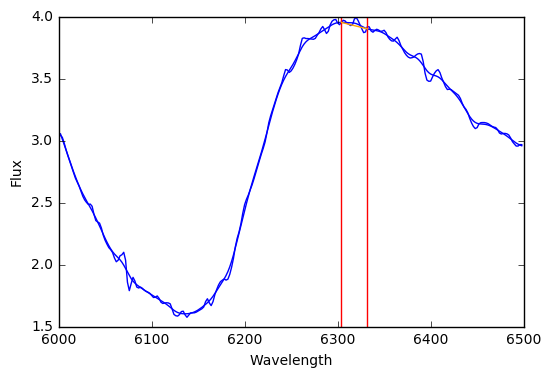

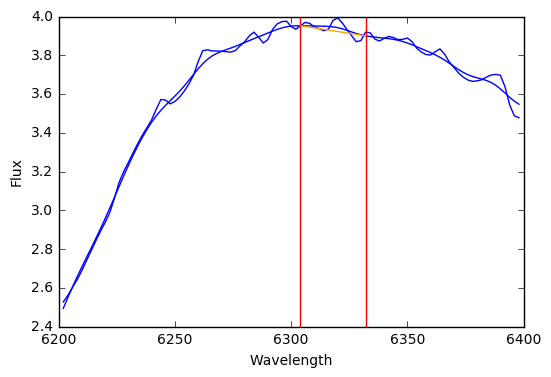

 -0.0826312480436
30 2001da N

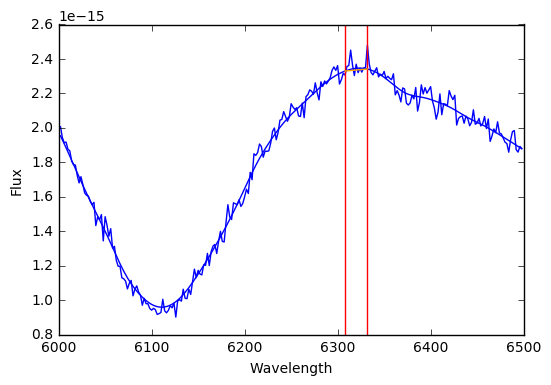

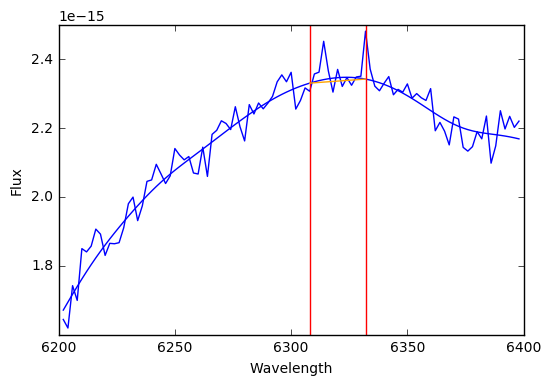

 -0.223060012261
31 2001eh N

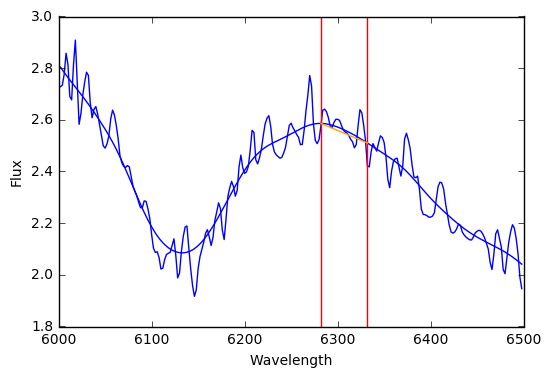

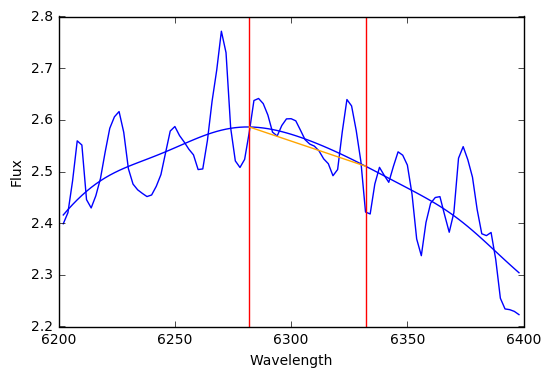

 -0.477194766277
32 2001ep N

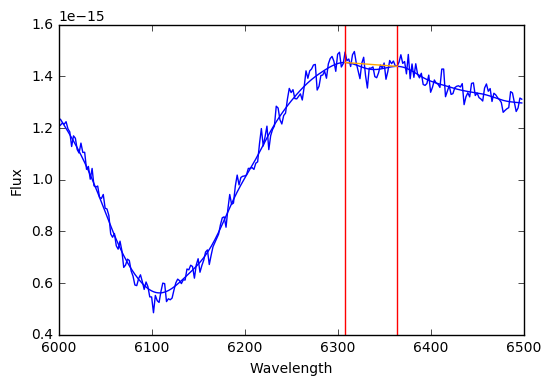

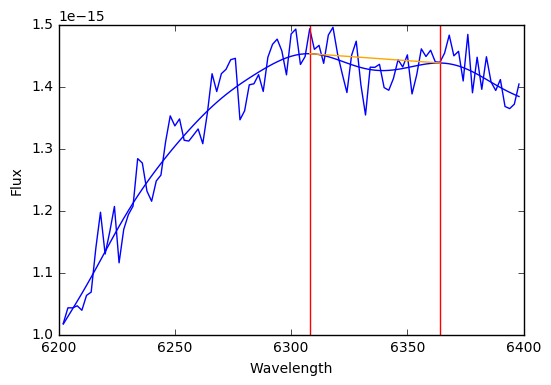

 0.386015155772
35 2002bo N

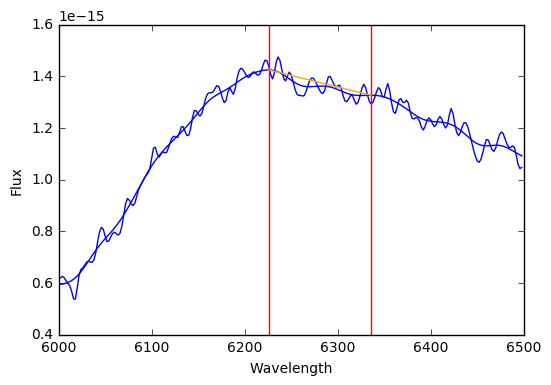

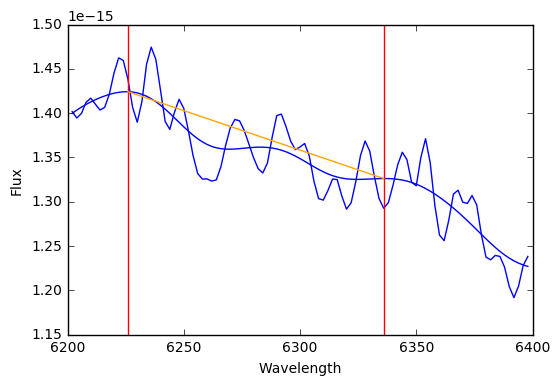

 1.06094470756
36 2002bo N

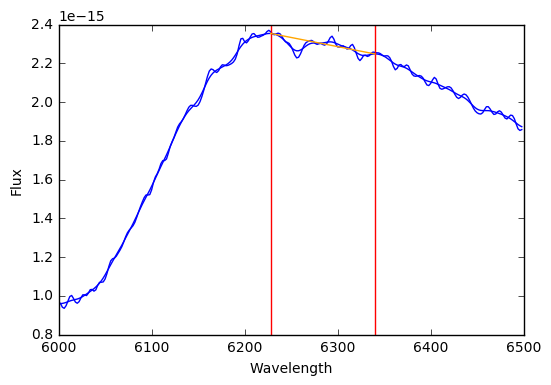

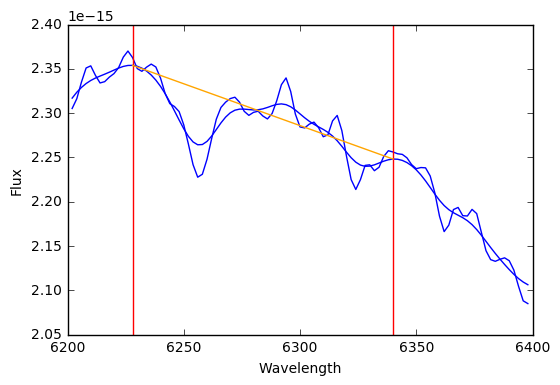

 0.561857458559
39 2002dj N

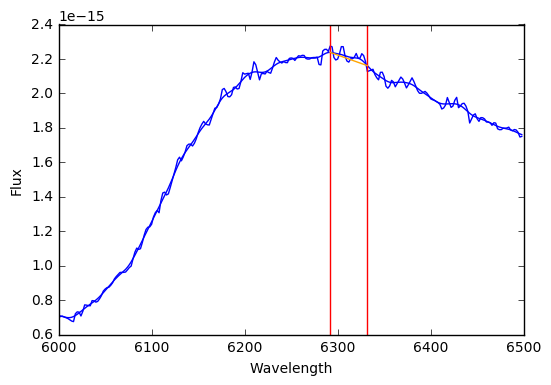

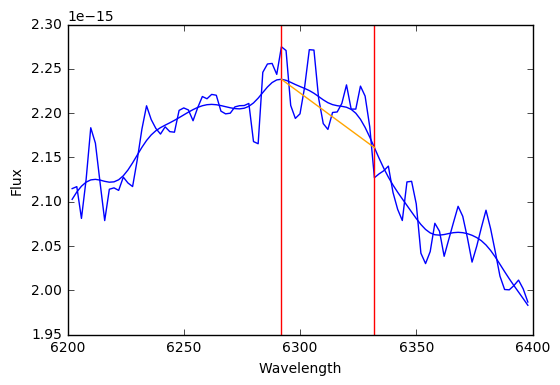

 -0.300217269506
41 2002eu N

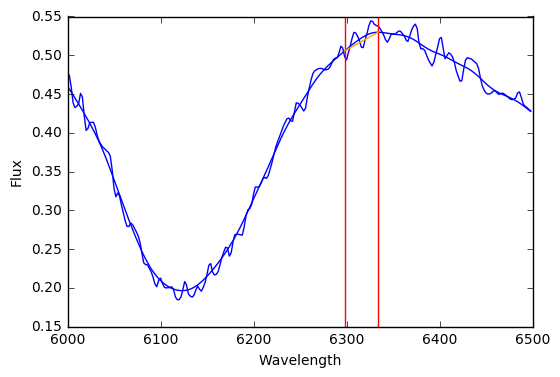

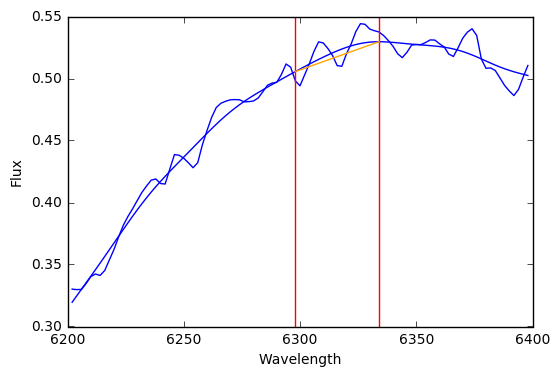

 -0.398944037375
42 2002fb N

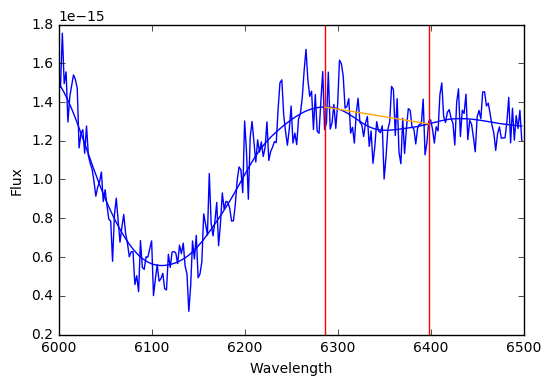

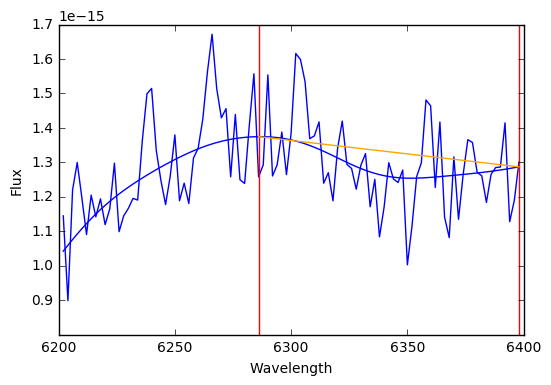

 3.131986135
43 2002ha N

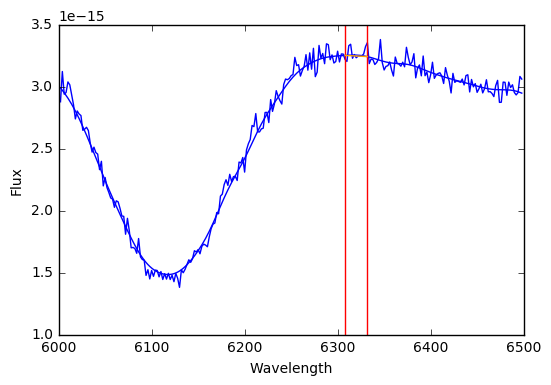

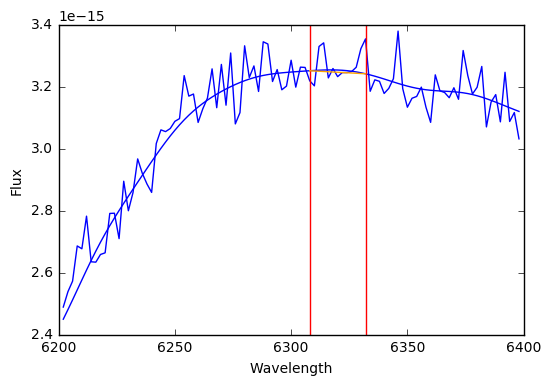

 -0.151672609588
44 2002he N

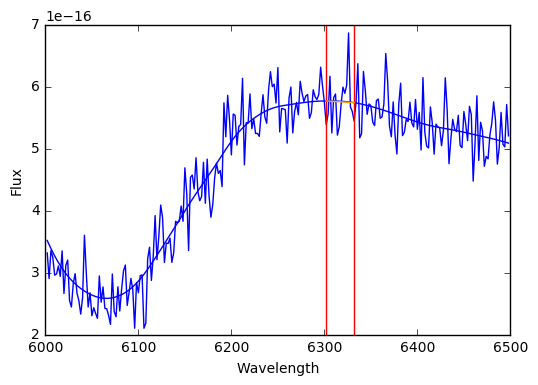

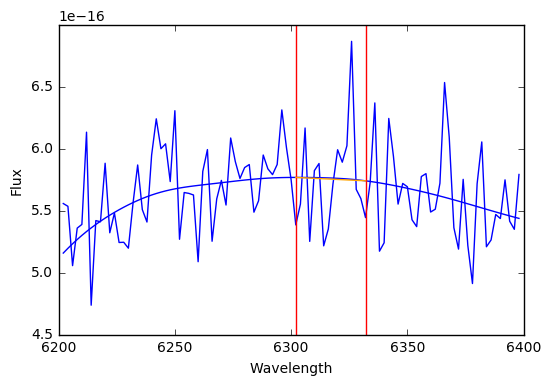

 -0.0353251053707
45 2002hu N

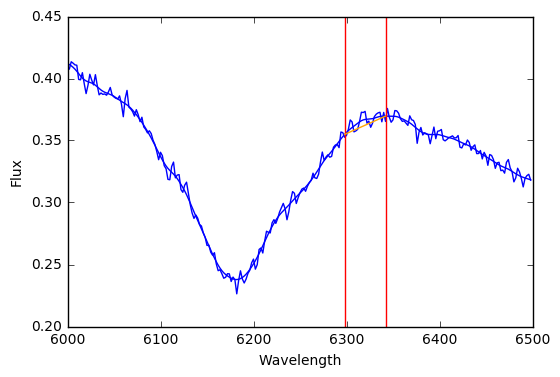

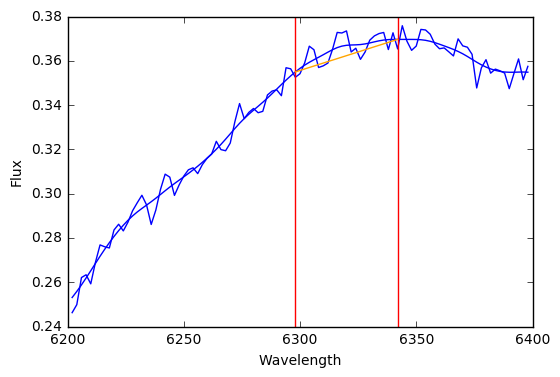

 -0.376168429959
47 2003cq N

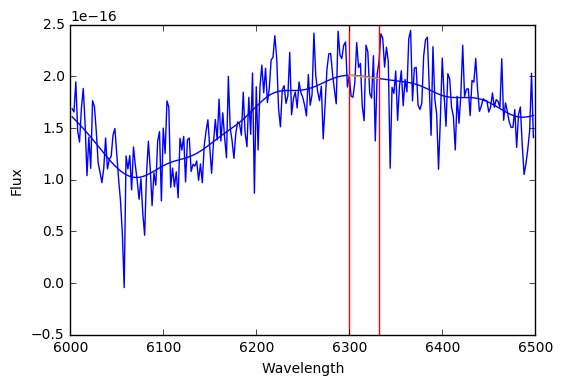

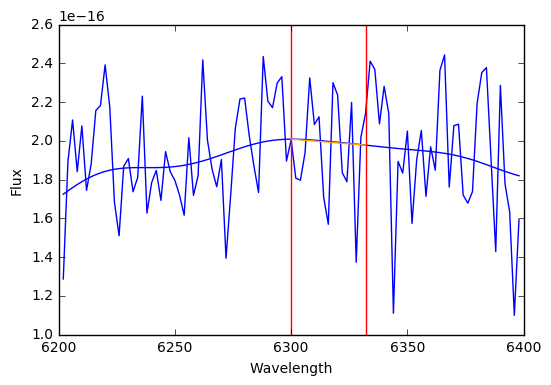

 0.71522911148
49 2003iv N

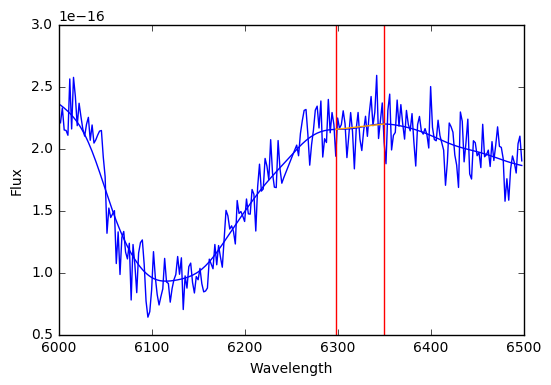

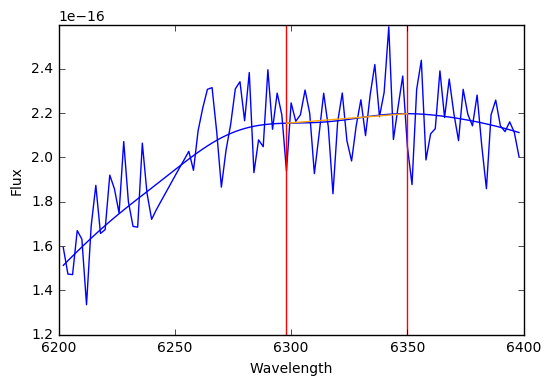

 -0.243464831145
52 2003w N

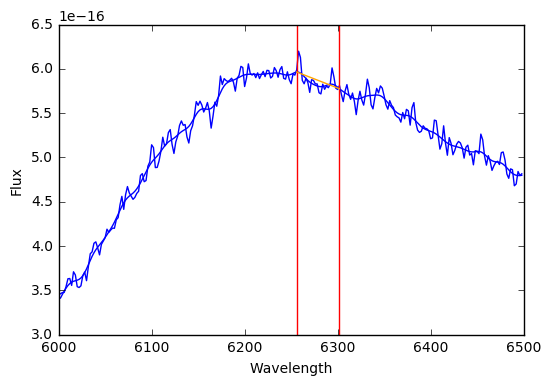

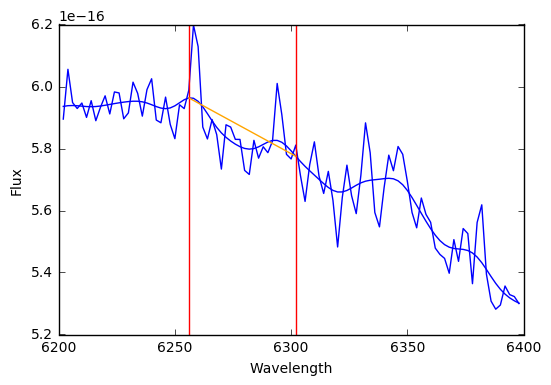

 0.0900221189673
53 2004as N

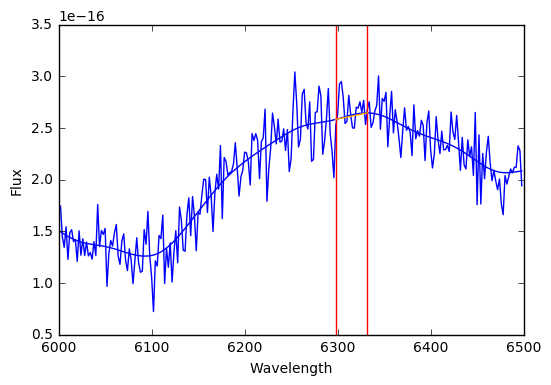

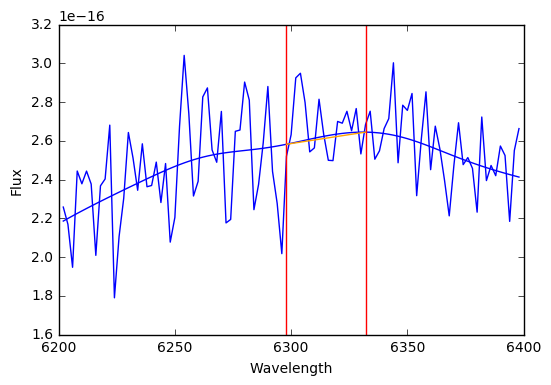

 -0.86292976287
54 2004dt N

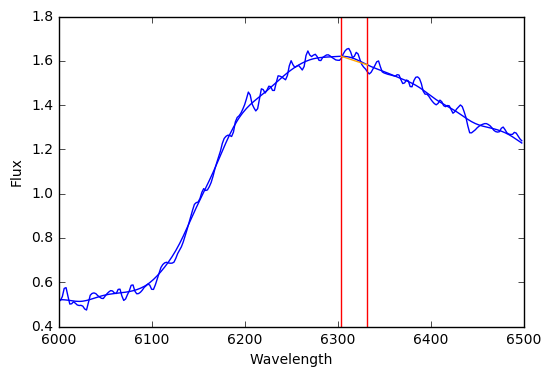

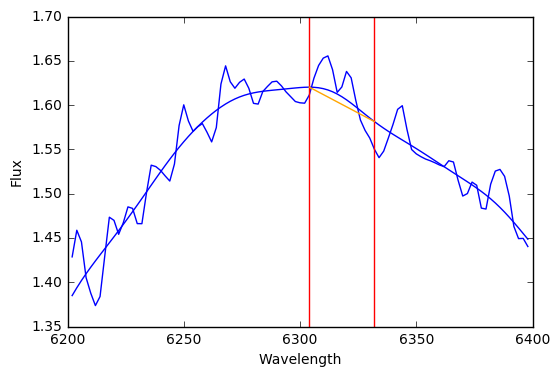

 -0.271981097725
55 2004ef N

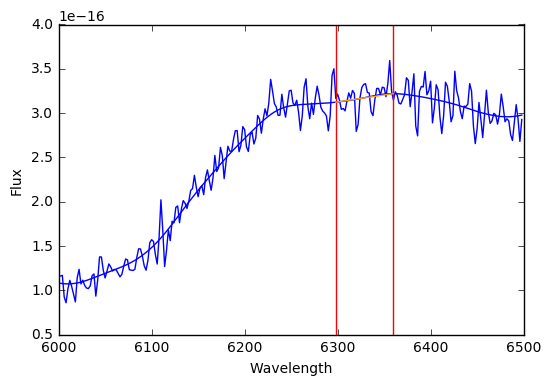

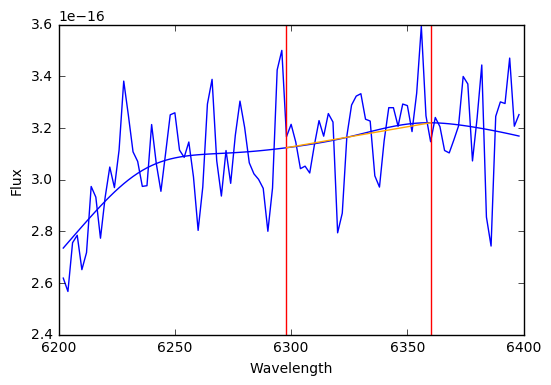

 -0.244967699336
56 2004eo N

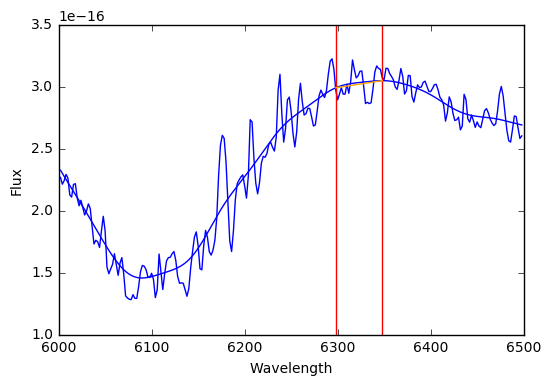

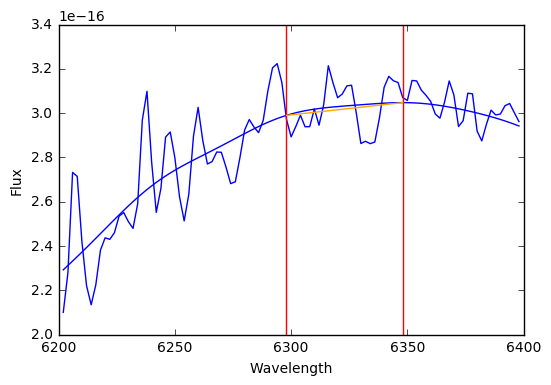

 -0.0171842695514
58 2004fu N

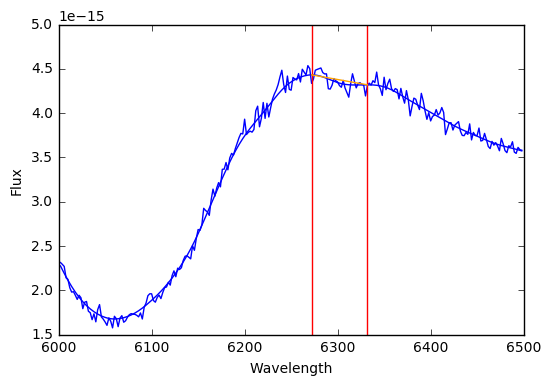

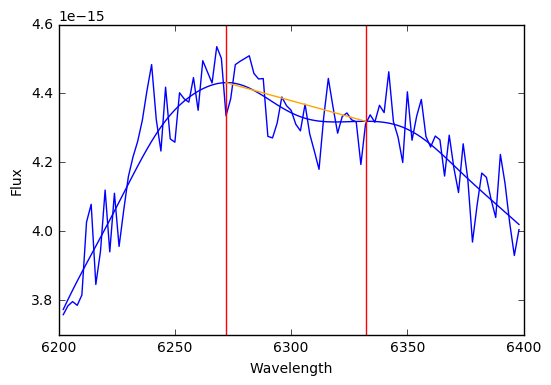

 0.303893843804
59 2004gs N

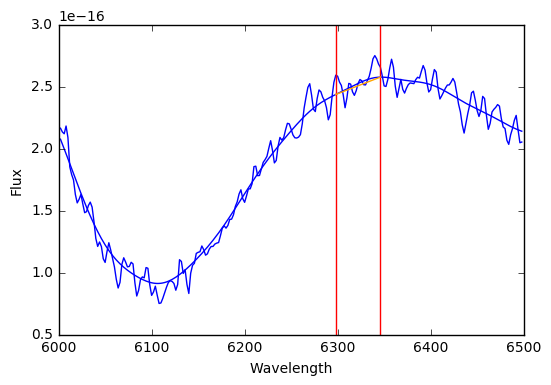

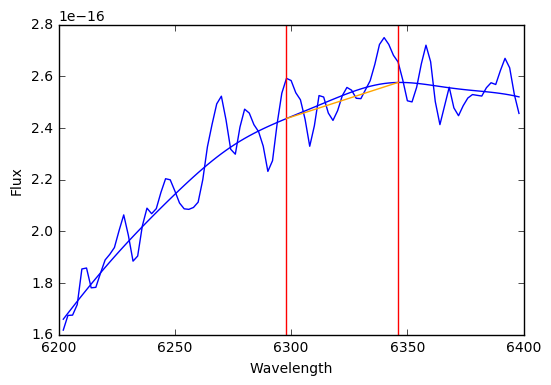

 -0.775968459388
60 2004gu N

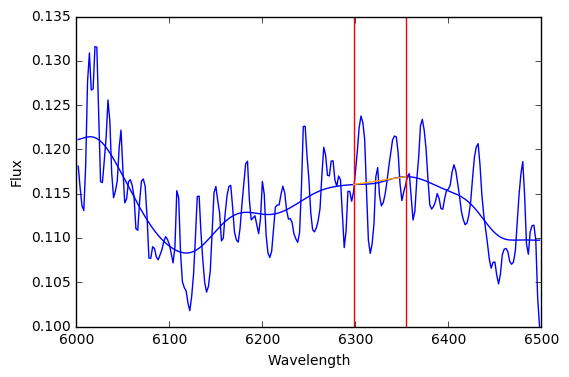

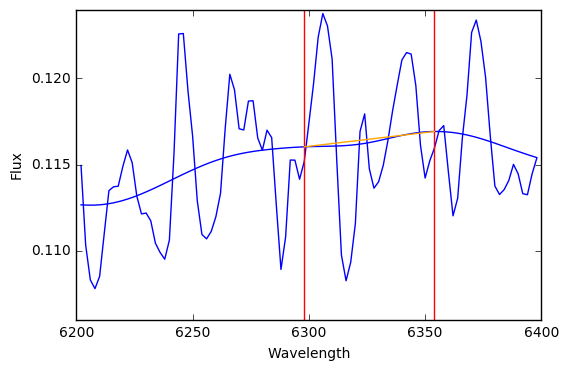

 -0.194232430697
61 2005ag N

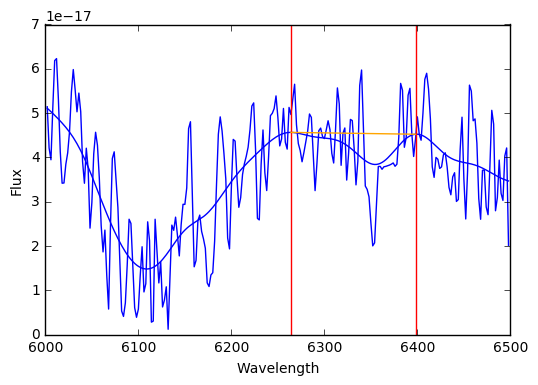

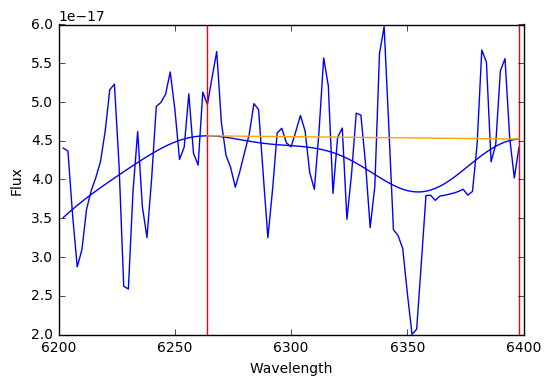

 8.30944820511
63 2005bo N

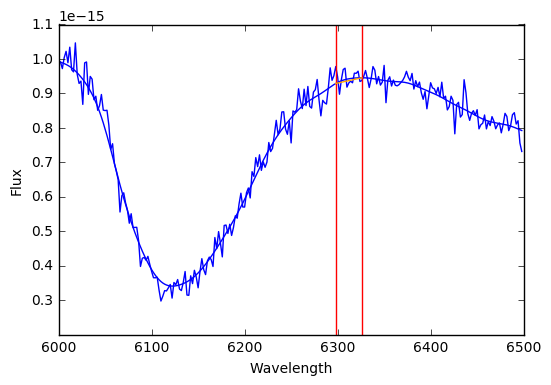

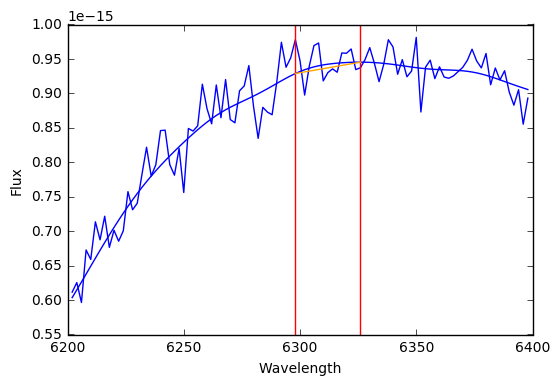

 -0.207113489067
66 2005eq N

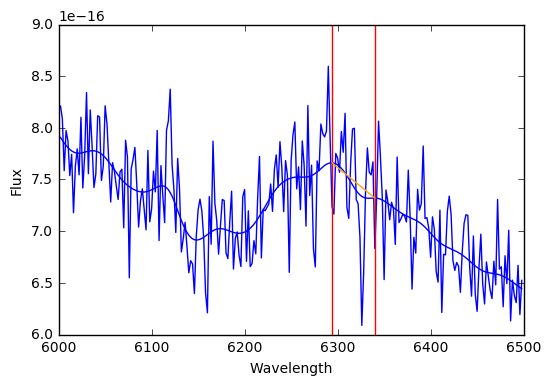

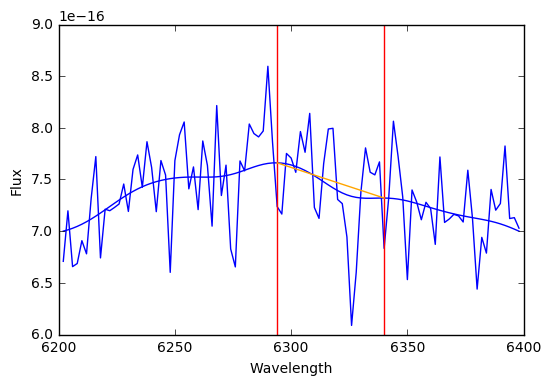

 0.276550548624
68 2005hc N

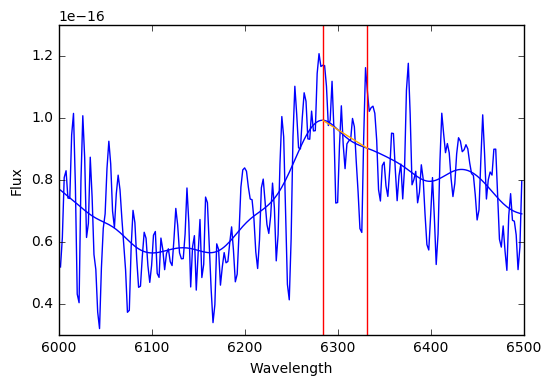

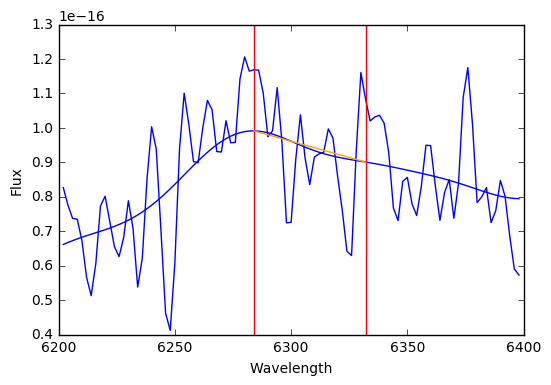

 0.887399281824
70 2005ke N

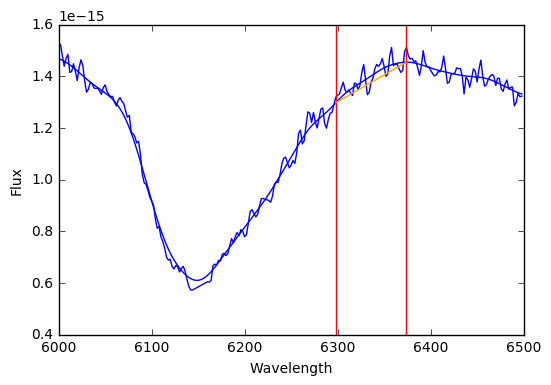

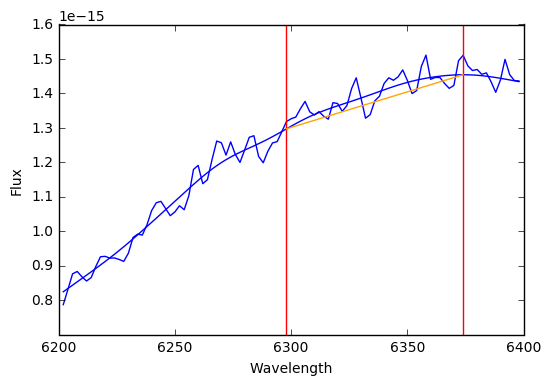

 -1.33976600229
72 2005lz N

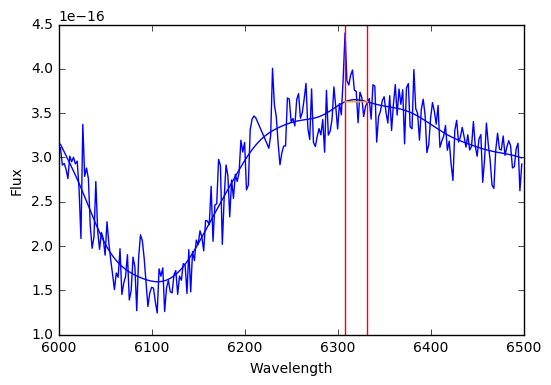

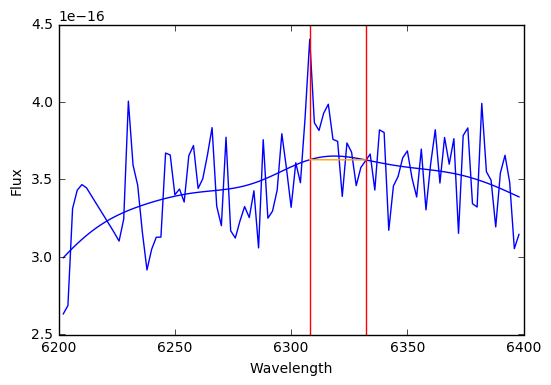

 -0.788284685919
73 2005m N

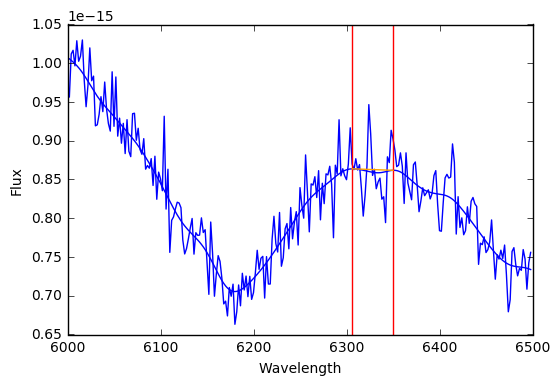

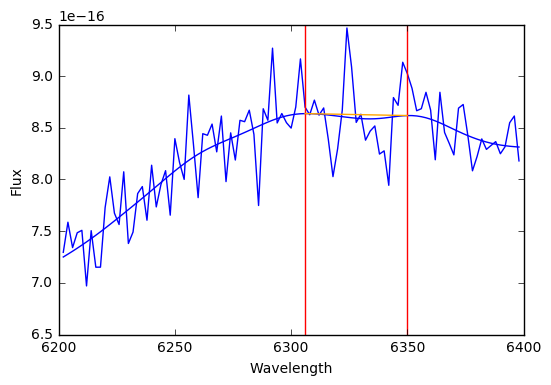

 0.150353124883
74 2005ms N

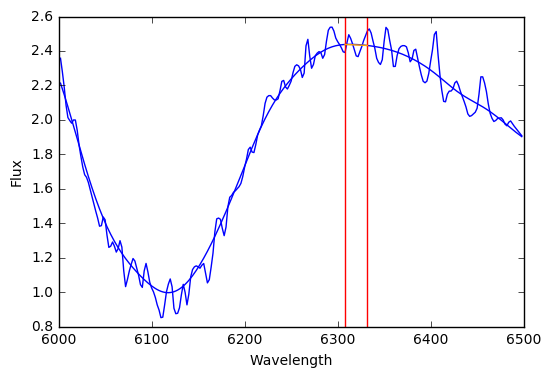

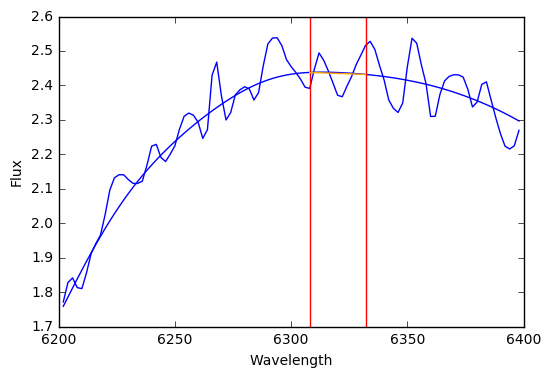

 -0.00854397880199
76 2005w N

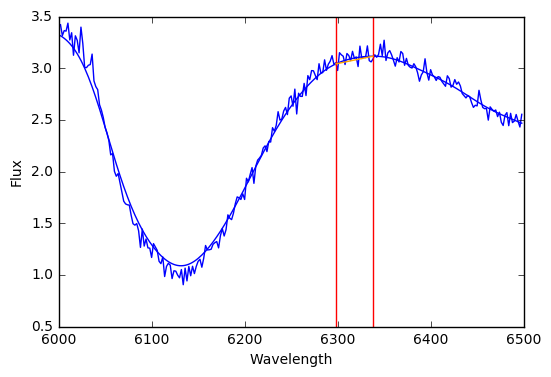

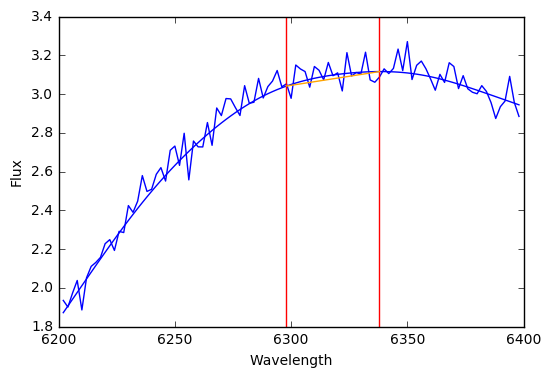

 -0.324862634064
79 2006cp N

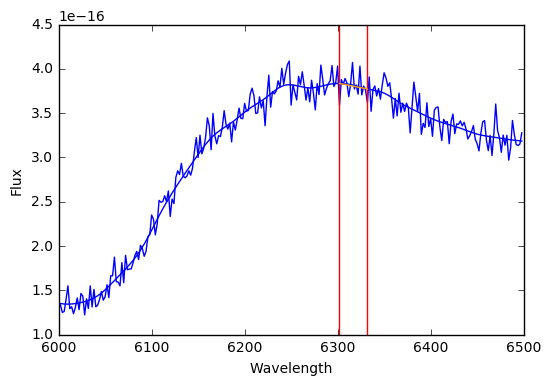

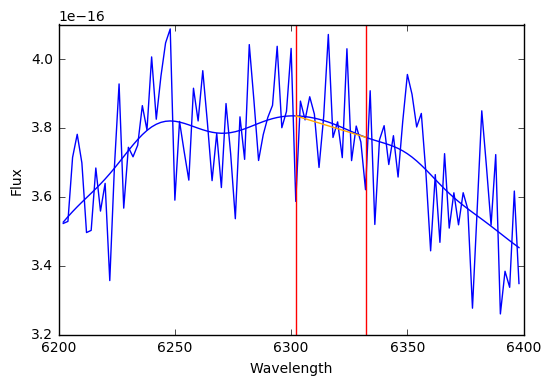

 -0.0880672871154
80 2006cq N

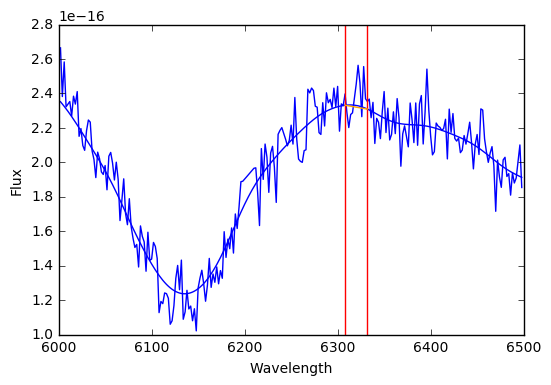

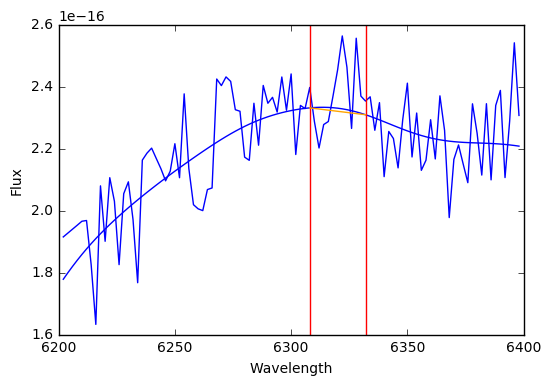

 -0.541228089369
83 2006ef N

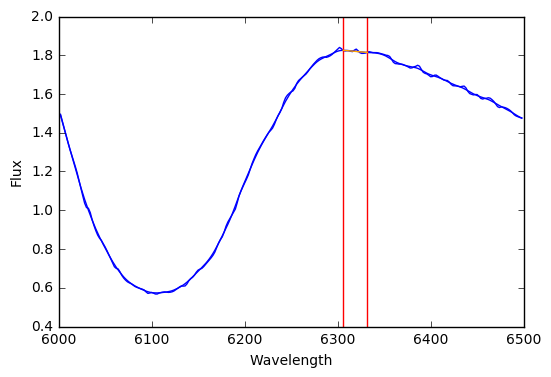

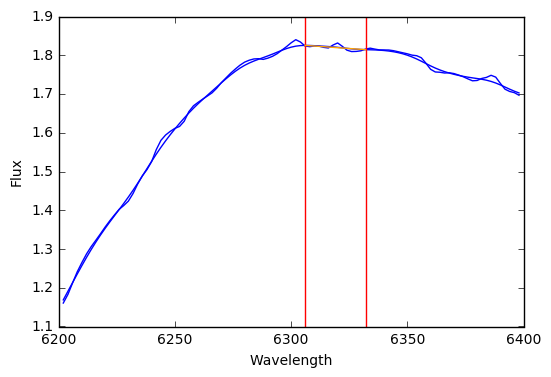

 0.00646347726118
84 2006ej N

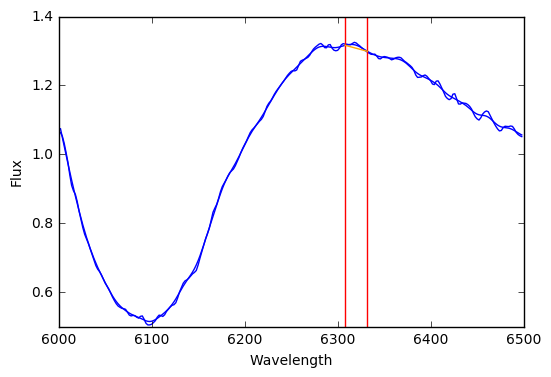

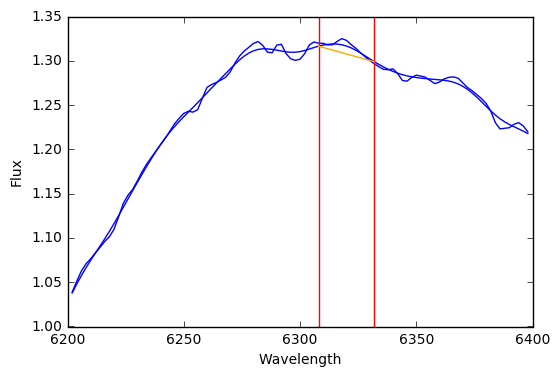

 -0.13443981368
85 2006et N

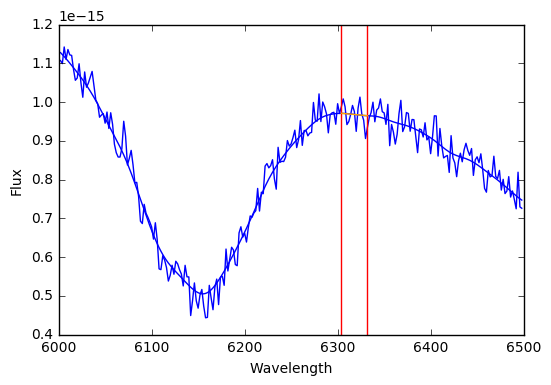

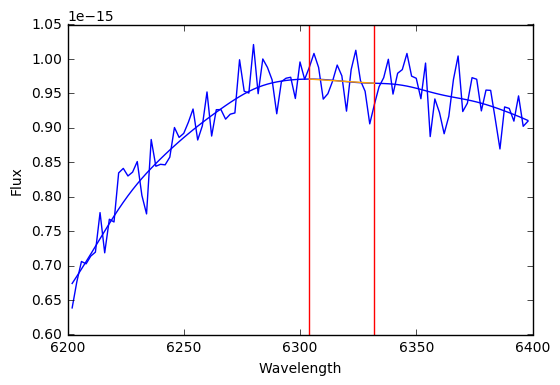

 0.0367683598004
86 2006gt N

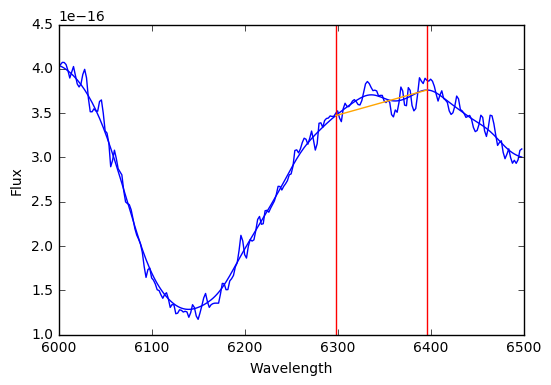

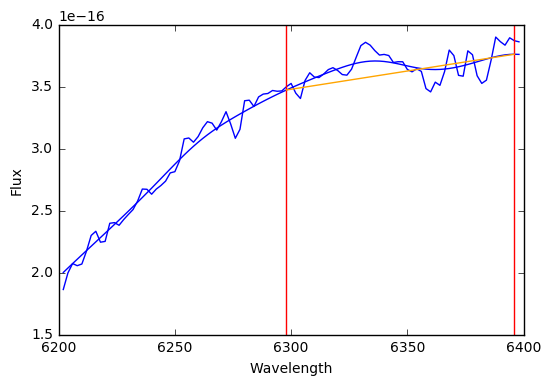

 -1.22296280781
87 2006kf N

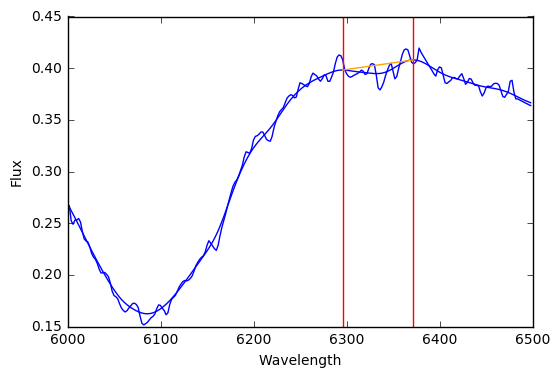

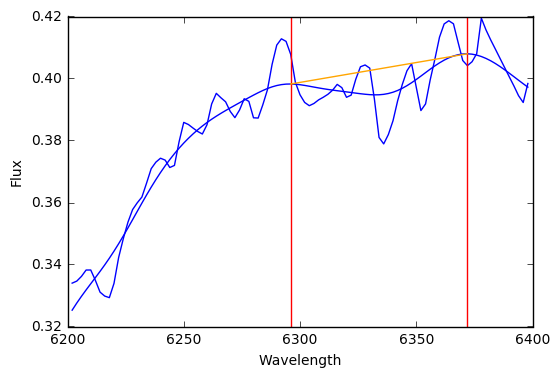

 0.899444315076
88 2006le N

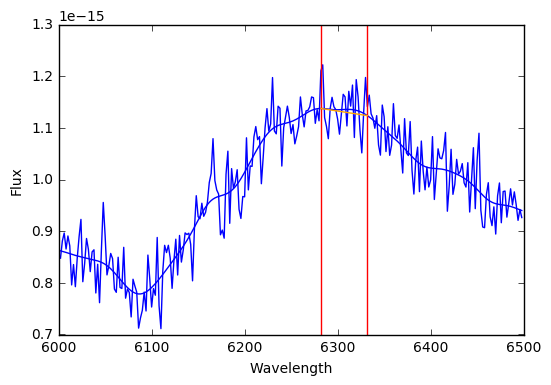

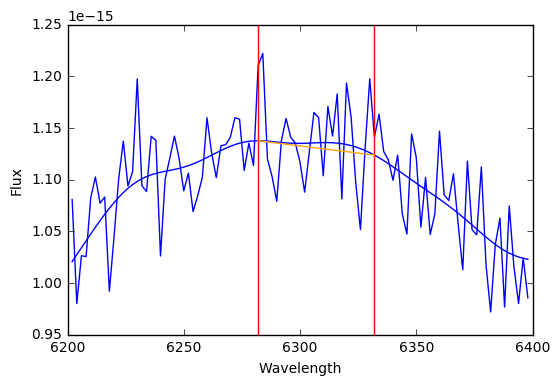

 -0.306085160173
89 2006n N

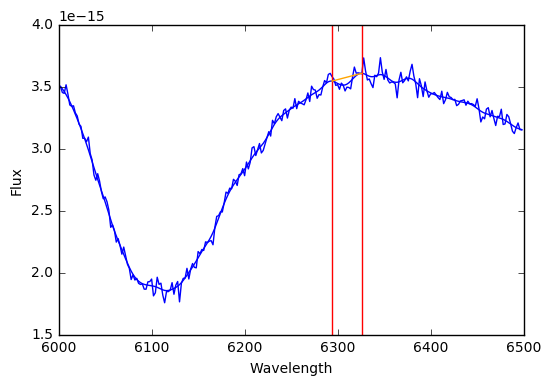

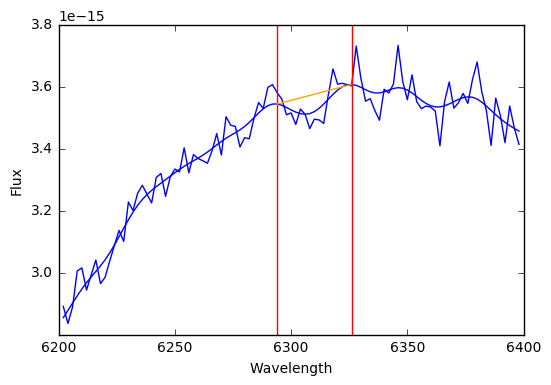

 0.295443282011
90 2006or N

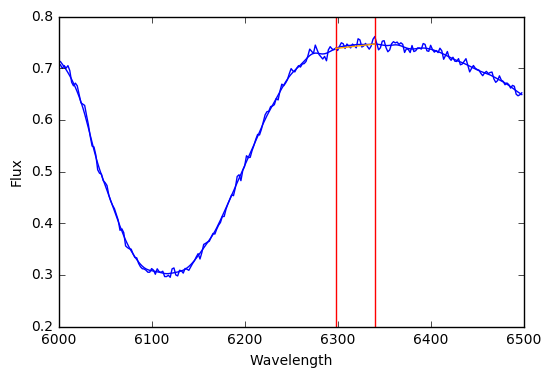

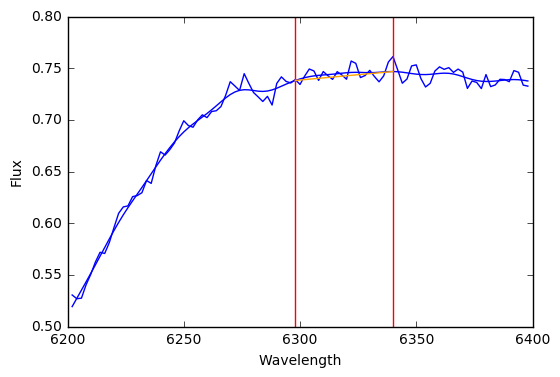

 -0.131341180345
91 2006os N

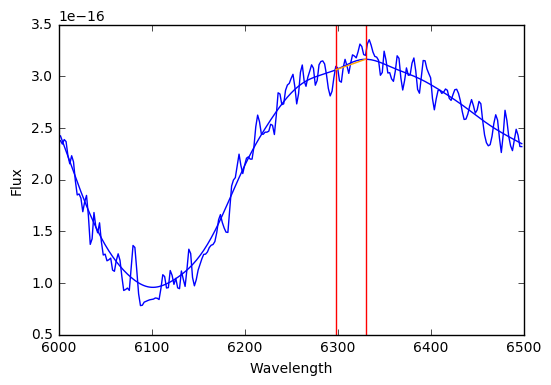

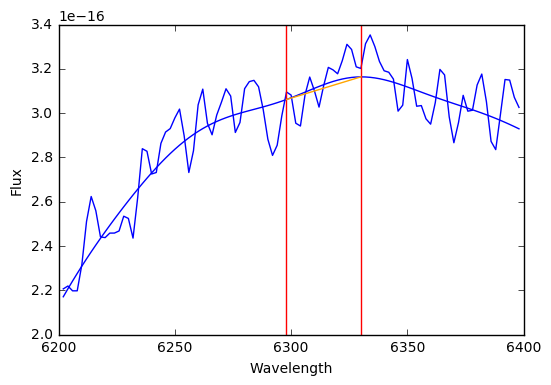

 -0.28226767835
92 2006s N

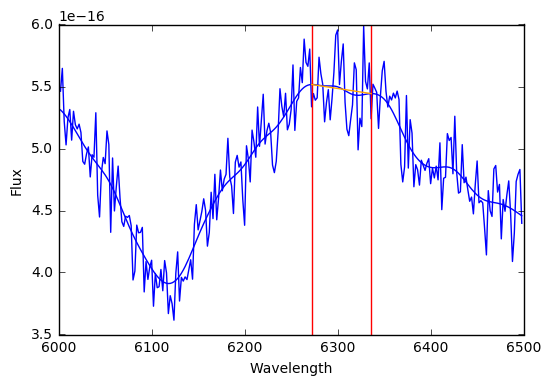

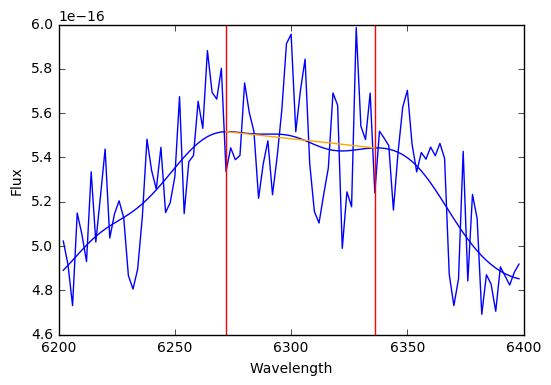

 0.0258673957919
93 2006sr N

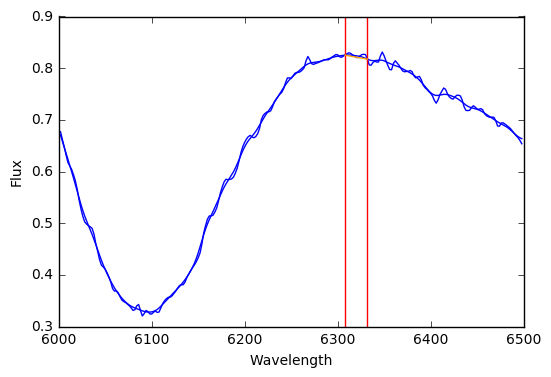

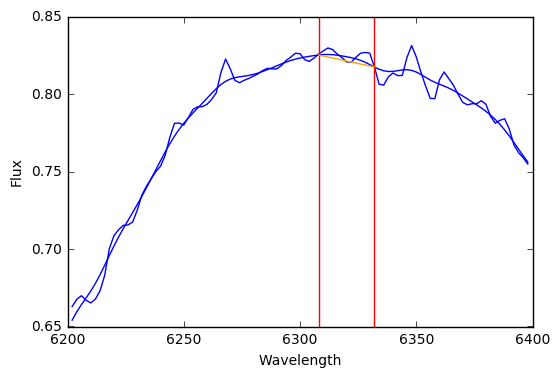

 -0.112239168098
95 2007ax N

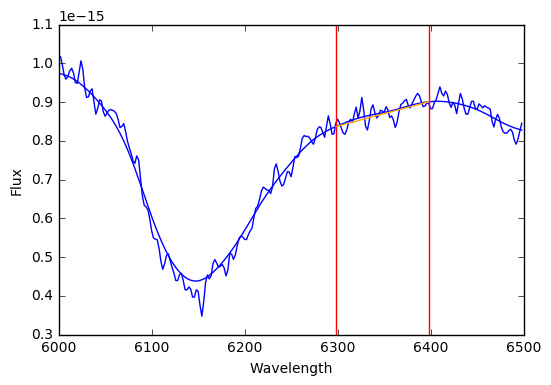

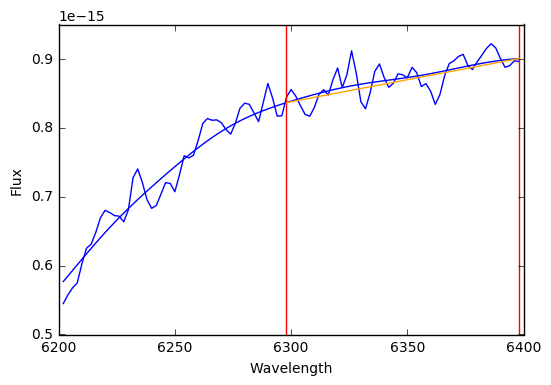

 -0.462690909919
97 2007bd N

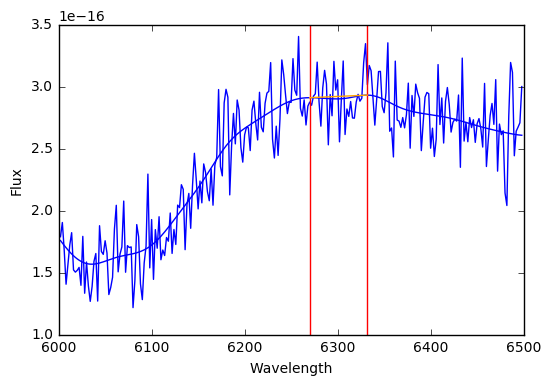

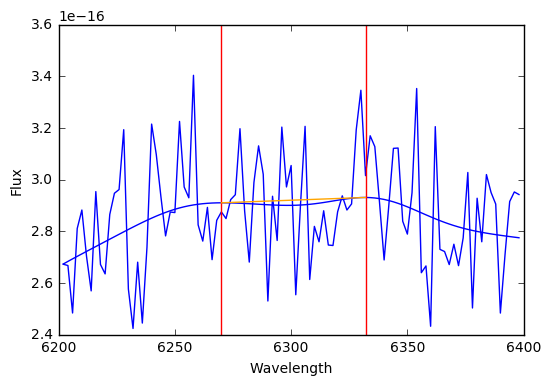

 0.112466937728
99 2007bz N

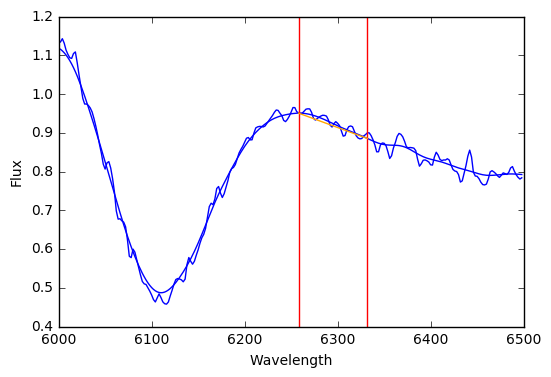

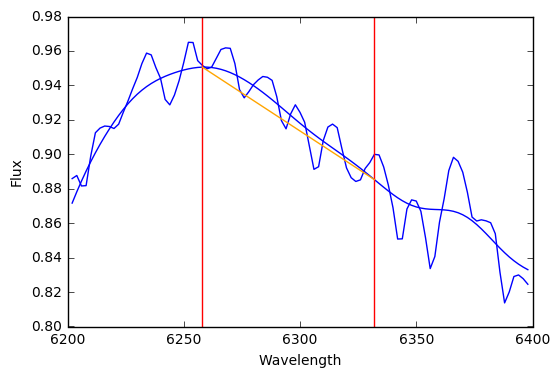

 -0.483560542569
100 2007ca N

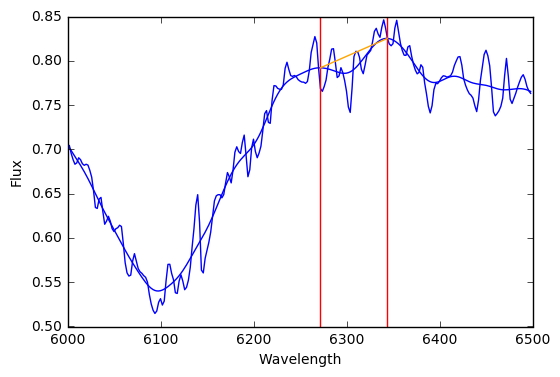

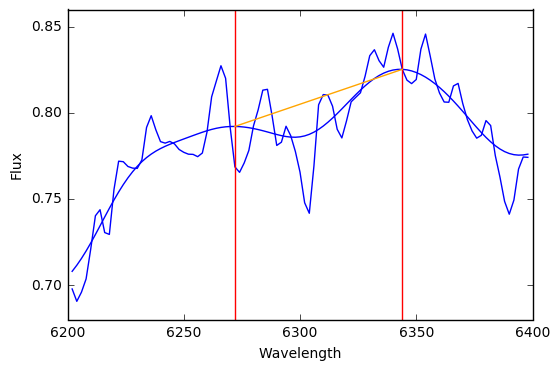

 0.849504555979
101 2007ci N

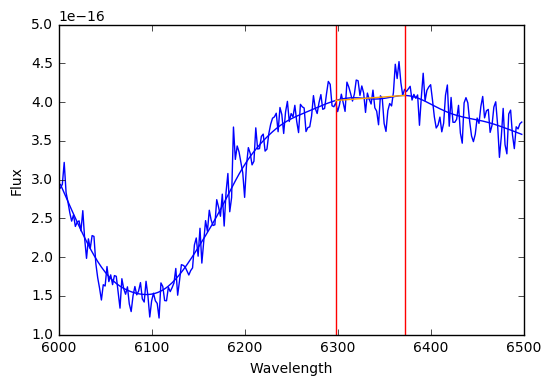

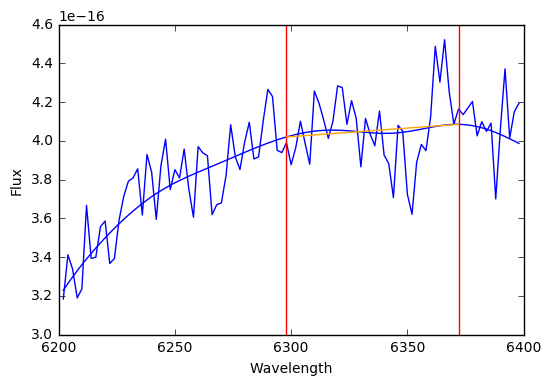

 -0.152468112384
102 2007co N

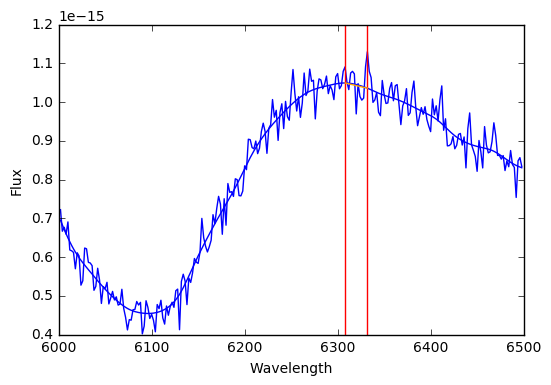

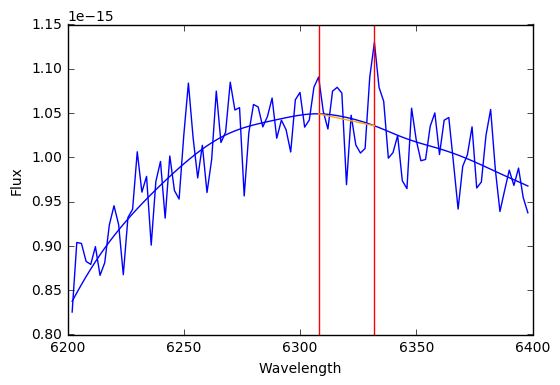

 -0.0920190204903
105 2007le N

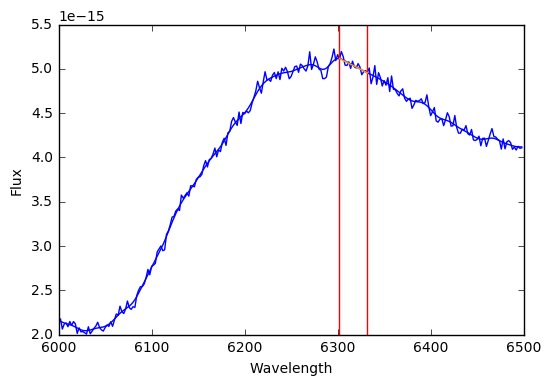

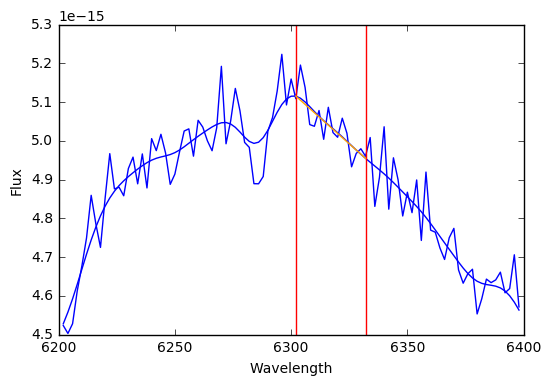

 -0.0301979635098
106 2007n N

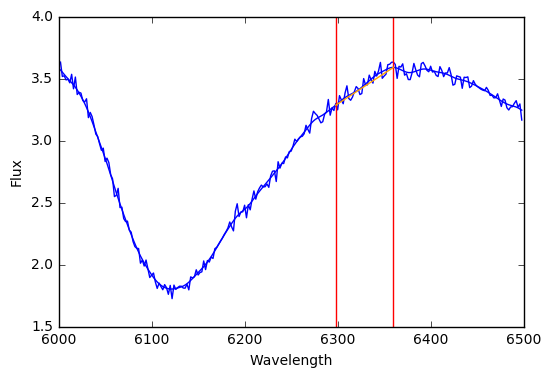

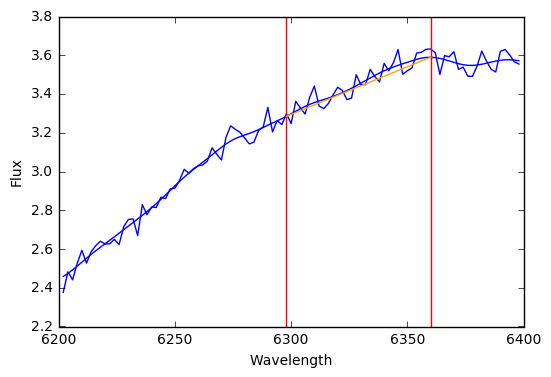

 -0.309675685695
107 2007o N

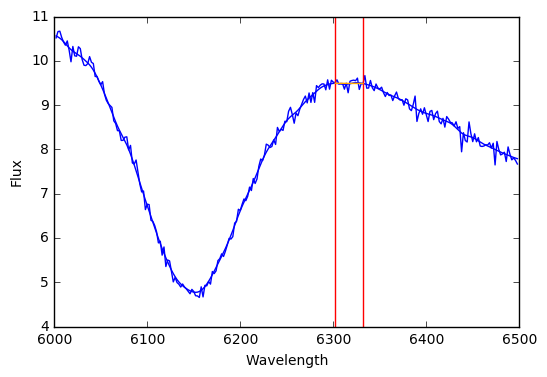

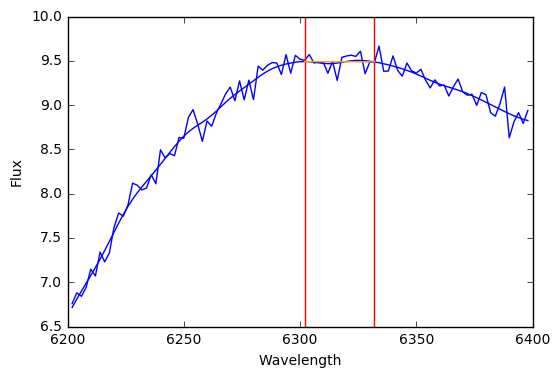

 0.00961367996531
109 2007qe N

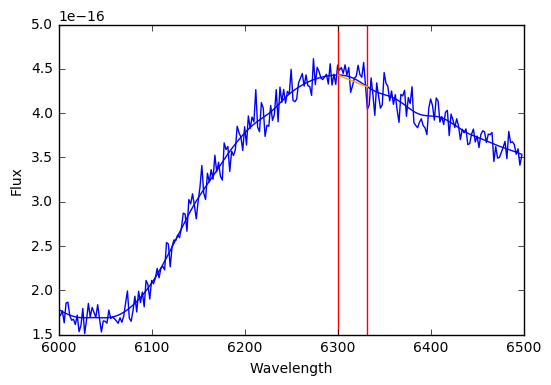

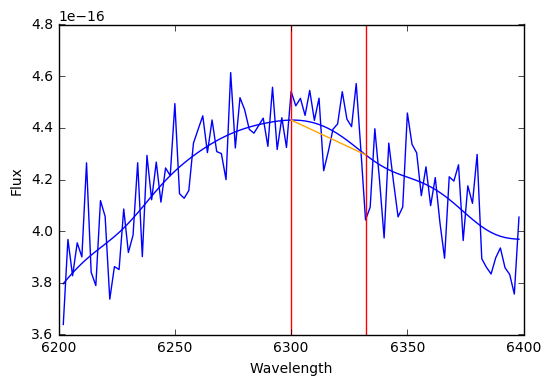

 -0.475699418858
112 1998ab N

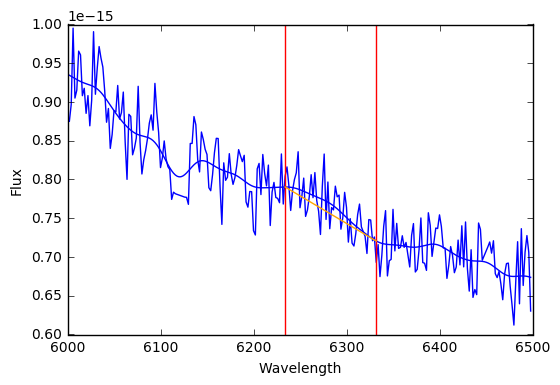

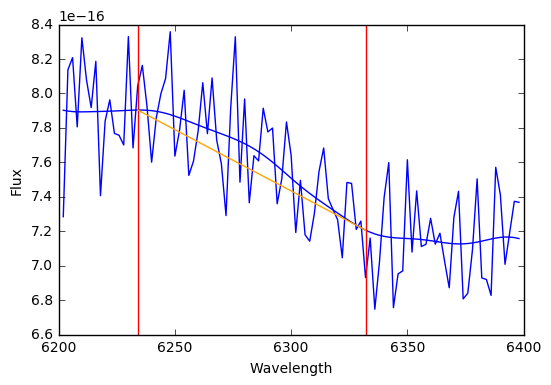

 -1.13088118103
113 1999cc N

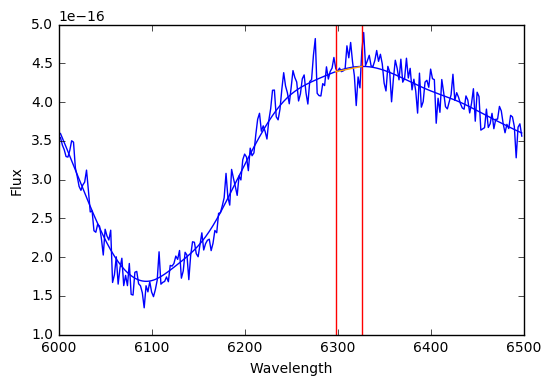

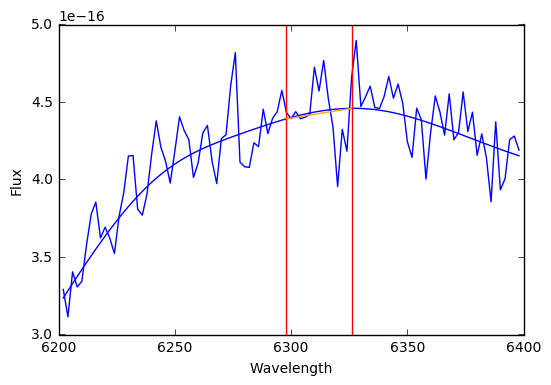

 -0.00917939899737
114 1999ej N

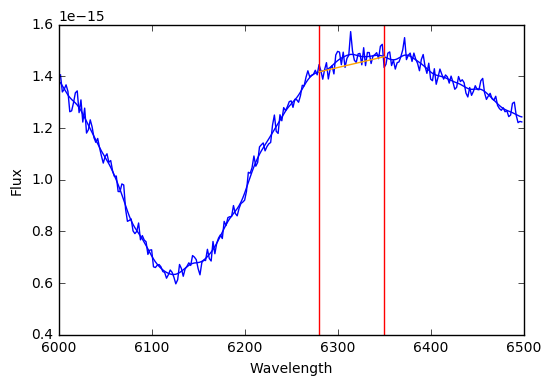

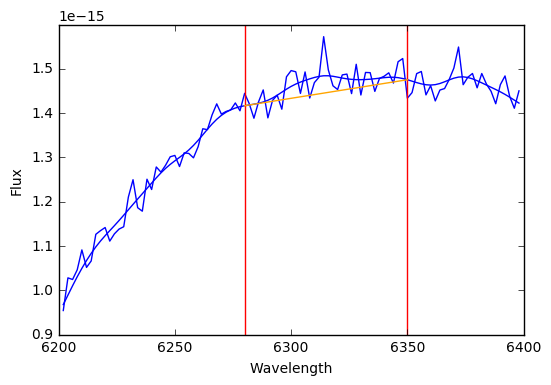

 -0.998480803101
115 1999gp N

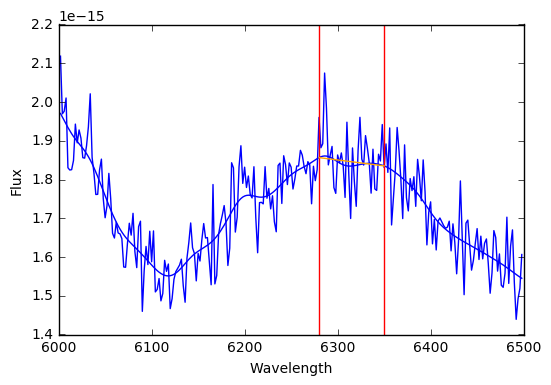

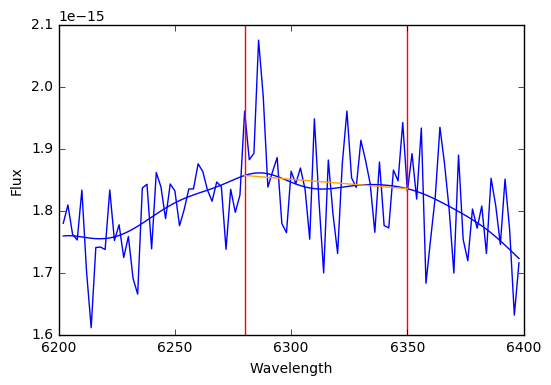

 -0.315230475802
117 2007jg N

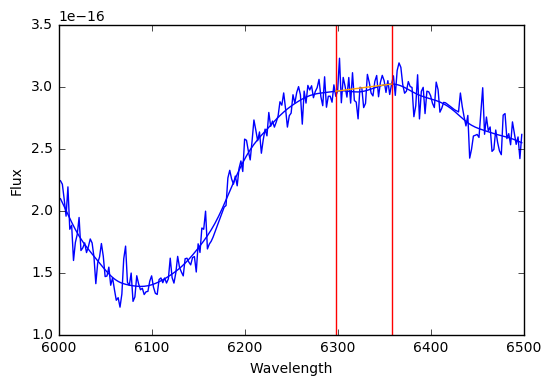

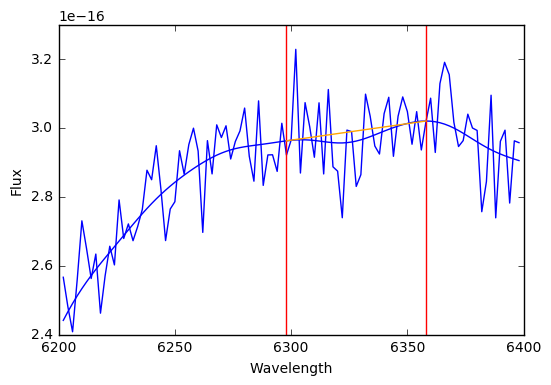

 0.217698952601
118 2006hx N

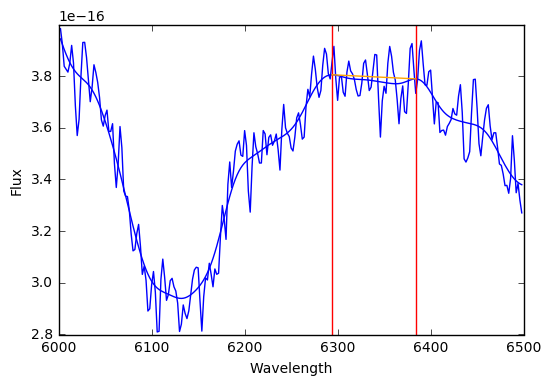

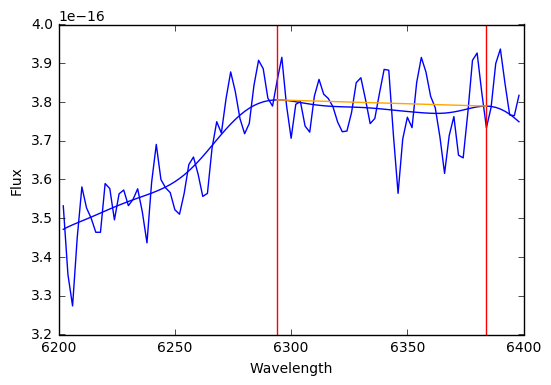

 0.359412551343
119 2007ai N

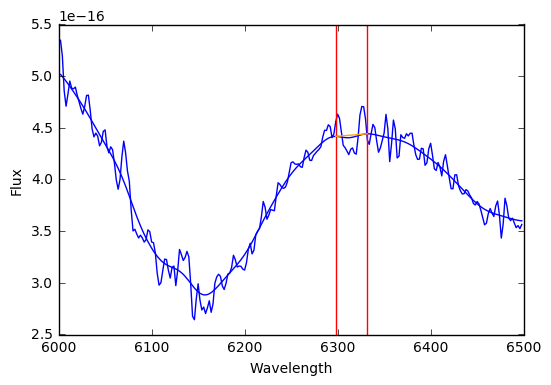

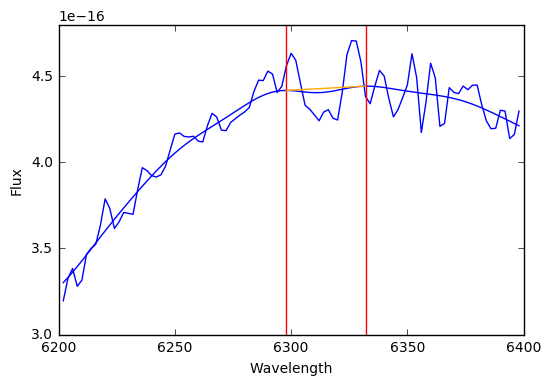

 -0.0594872986939
120 2007as N

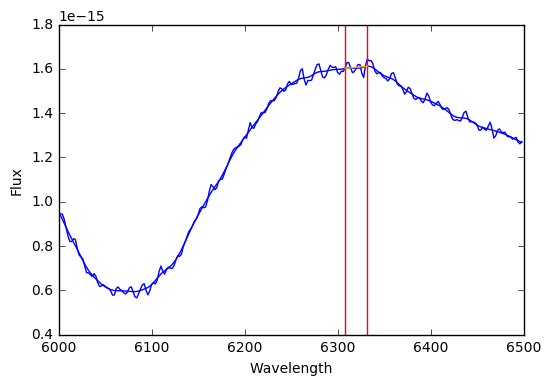

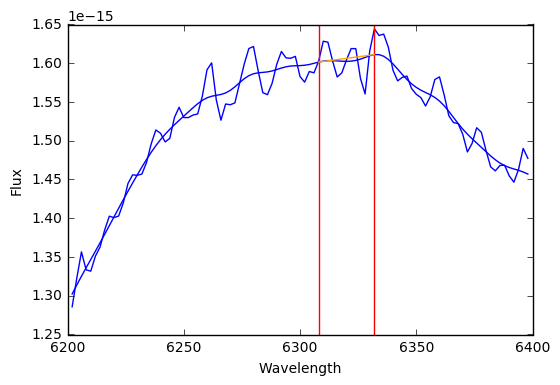

 0.0304733569039
121 2008bq N

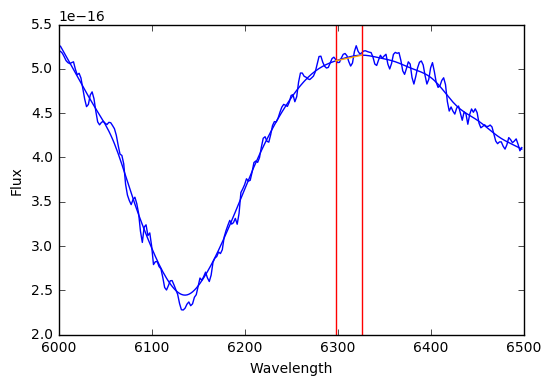

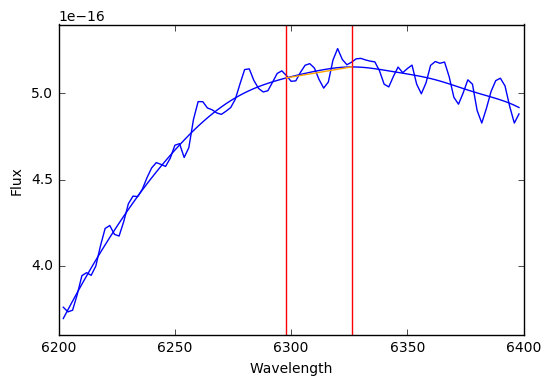

 -0.0691757862846


In [22]:
for i, e in enumerate(New_SN_Array):
    if e.carbon=='A':
        print i, e.name, e.carbon, eq_width(e,6200,6300,6400,plot=True)
        
for i, e in enumerate(New_SN_Array):
    if e.carbon=='F':
        print i, e.name, e.carbon, eq_width(e,6200,6300,6400,plot=True)
        
for i, e in enumerate(New_SN_Array):
    if e.carbon=='N':
        print i, e.name, e.carbon, eq_width(e,6200,6300,6400,plot=True)

19 1999ac F

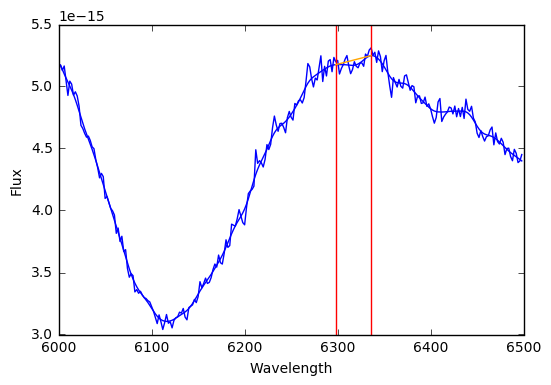

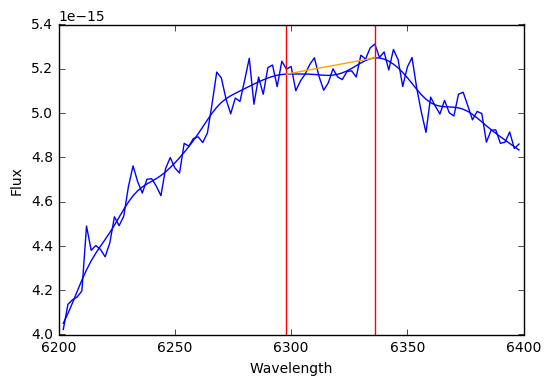

 0.162862586817


In [23]:
for i, e in enumerate(New_SN_Array):
    if e.name=='1999ac':
        print i, e.name, e.carbon, eq_width(e,6200,6300,6400,plot=True)

32 2001ep N

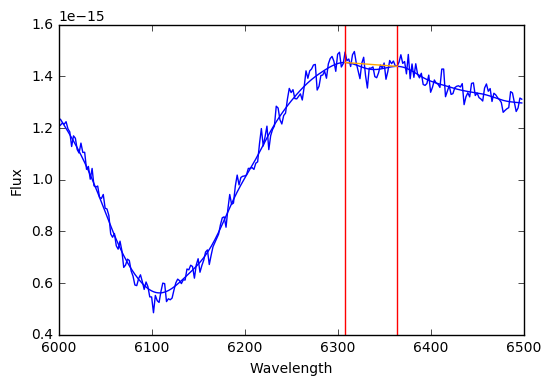

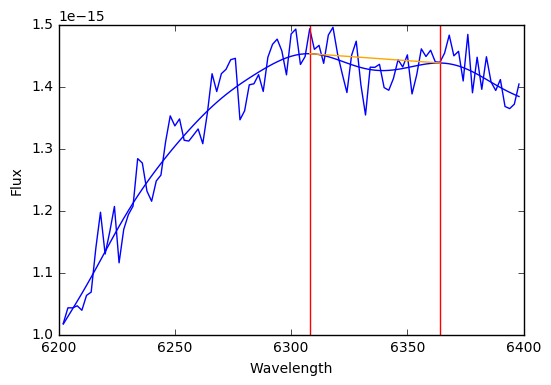

 0.386015155772


In [24]:
for i, e in enumerate(New_SN_Array):
    if e.name=='2001ep':
        print i, e.name, e.carbon, eq_width(e,6200,6300,6400,plot=True)

38 2002cr A

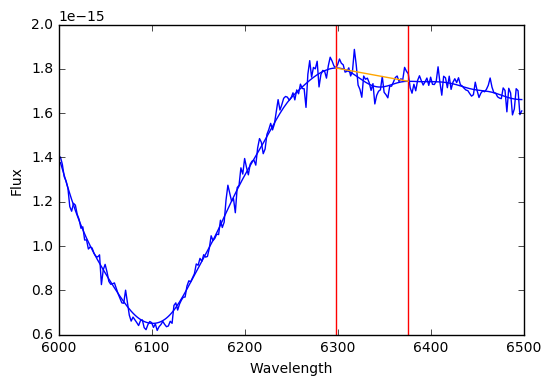

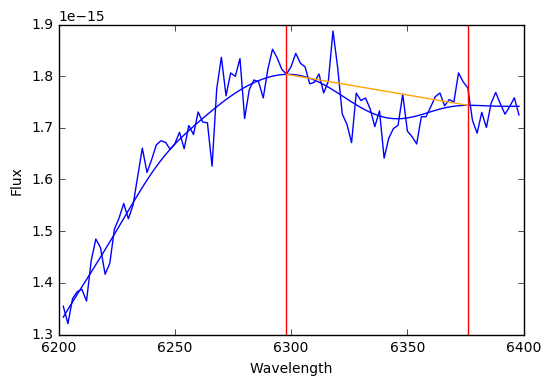

 0.892994485528


In [25]:
for i, e in enumerate(New_SN_Array):
    if e.name=='2002cr':
        print i, e.name, e.carbon, eq_width(e,6200,6300,6400,plot=True)

42 2002fb N

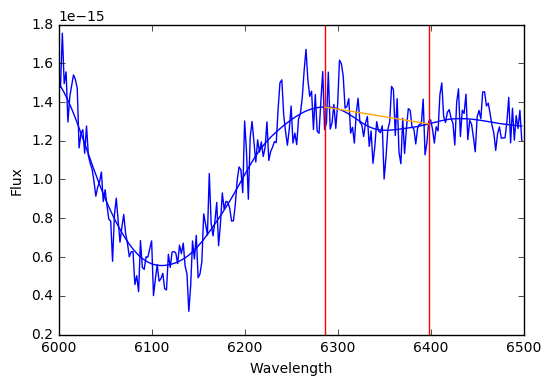

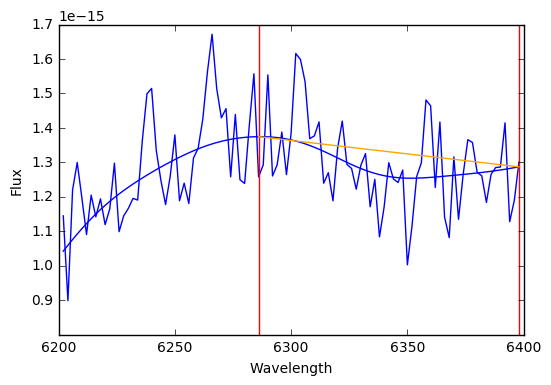

 3.131986135


In [26]:
for i, e in enumerate(New_SN_Array):
    if e.name=='2002fb':
        print i, e.name, e.carbon, eq_width(e,6200,6300,6400,plot=True)

46 2002hw A

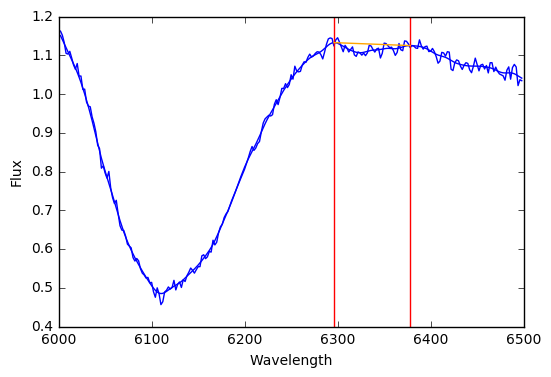

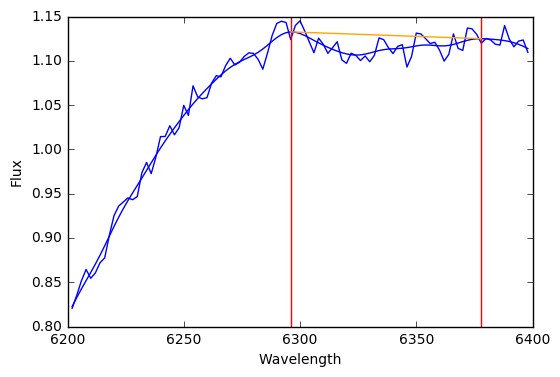

 0.862371345229


In [27]:
for i, e in enumerate(New_SN_Array):
    if e.name=='2002hw':
        print i, e.name, e.carbon, eq_width(e,6200,6300,6400,plot=True)

In [28]:
for i, e in enumerate(New_SN_Array):
    if e.name=='2000gt':
        print i, e.name, e.carbon, eq_width(e,6200,6300,6400,plot=True)